In [1]:
import os
import numpy as np
import pandas as pd
import re

# 原始数据文件夹
folder_path = r'D:\wangshuo\angel_data'
# 保存结果文件夹
save_path = r'D:\wangshuo\localization'

waveforms = []
labels = []

for filename in sorted(os.listdir(folder_path)):
    if filename.endswith('.csv'):
        file_path = os.path.join(folder_path, filename)
        data = pd.read_csv(file_path, header=None)
        waveforms.append(data.iloc[:, 0].values)
        nums = re.findall(r'([\d\.]+)o([\d\.]+)o([\d\.]+)', filename)
        if nums:
            label = [float(x) for x in nums[0]]
            labels.append(label)
        else:
            raise ValueError(f"Filename format error: {filename}")

# 保存到新的文件夹
np.save(os.path.join(save_path, 'waveforms.npy'), np.array(waveforms, dtype=object))
np.save(os.path.join(save_path, 'labels.npy'), np.array(labels, dtype=float))

print("保存完成！waveforms.npy 和 labels.npy 已生成在 D:\\wangshuo\\localization 文件夹下。")


保存完成！waveforms.npy 和 labels.npy 已生成在 D:\wangshuo\localization 文件夹下。


In [7]:
import numpy as np
import os

save_path = r'D:\wangshuo\localization'

waveforms = np.load(os.path.join(save_path, 'waveforms.npy'), allow_pickle=True)
labels = np.load(os.path.join(save_path, 'labels.npy'))

print(f"waveforms 的总数: {waveforms.shape}")
print(f"labels 的形状: {labels.shape}")

for i in range(3):
    print(f"\n第{i+1}个 label: {labels[i]}")
    print(f"对应的 waveform 长度: {len(waveforms[i])}")
    print(f"部分数据: {waveforms[i][:10]}")  # 打印前10个采样点

# 打印labels第一列最大/最小值
print(f"\n第一列最大值: {labels[:,0].max()}，最小值: {labels[:,0].min()}")

# 打印labels第二列最大/最小值
print(f"第二列最大值: {labels[:,1].max()}，最小值: {labels[:,1].min()}")



waveforms 的总数: (22946, 1024)
labels 的形状: (22946, 3)

第1个 label: [10. 10.  1.]
对应的 waveform 长度: 1024
部分数据: [-0.001221 -0.000916 -0.00061 -0.000305 0.0 0.0 -0.000305 -0.00061
 0.000305 0.000305]

第2个 label: [10. 10. 11.]
对应的 waveform 长度: 1024
部分数据: [0.0 0.0 0.0 0.0 -0.000305 0.0 -0.000305 0.000305 0.0 -0.00061]

第3个 label: [10. 10. 12.]
对应的 waveform 长度: 1024
部分数据: [0.002441 0.001831 0.001221 0.00061 0.00061 0.000916 0.001221 0.001221
 0.001221 0.001526]

第一列最大值: 36.0，最小值: 1.0
第二列最大值: 31.0，最小值: 1.0


In [4]:
import numpy as np
from sklearn.model_selection import train_test_split

# 加载数据
save_path = r'D:\wangshuo\localization'
waveforms = np.load(os.path.join(save_path, 'waveforms.npy'), allow_pickle=True)
labels = np.load(os.path.join(save_path, 'labels.npy'))

# 输入：waveforms（N, 1024），输出 labels 的前两列（N, 2）
X = np.stack(waveforms).astype('float32')   # 确保类型没问题
y = labels[:, :2].astype('float32')

# 划分训练/验证集
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.1, random_state=42)



import tensorflow as tf
from tensorflow.keras import layers, models

inputs = layers.Input(shape=(1024,))
x = tf.expand_dims(inputs, axis=-1)
x = layers.Conv1D(64, 3, padding='same', activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(128, 3, padding='same', activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(256, 3, padding='same', activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(512, 3, padding='same', activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(1024, 3, padding='same', activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Flatten()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dense(64, activation='relu')(x)
outputs = layers.Dense(2)(x)

model = models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='mse')
model.summary()


history = model.fit(
    X_train, y_train,
    epochs=200,
    batch_size=2000,
    validation_data=(X_val, y_val)
)


val_loss = model.evaluate(X_val, y_val)
print("验证集MSE:", val_loss)





Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1024)]            0         
_________________________________________________________________
tf.expand_dims (TFOpLambda)  (None, 1024, 1)           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 1024, 64)          256       
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 512, 64)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 512, 128)          24704     
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 256, 128)          0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 256, 256)          98560 

11/11 [==============================] - 2s 143ms/step - loss: 0.7102 - val_loss: 3.3550
Epoch 133/200
11/11 [==============================] - 2s 143ms/step - loss: 0.6650 - val_loss: 3.4255
Epoch 134/200
11/11 [==============================] - 2s 143ms/step - loss: 1.2846 - val_loss: 3.4007
Epoch 135/200
11/11 [==============================] - 2s 143ms/step - loss: 1.0339 - val_loss: 3.3329
Epoch 136/200
11/11 [==============================] - 2s 143ms/step - loss: 0.7552 - val_loss: 3.2613
Epoch 137/200
11/11 [==============================] - 2s 143ms/step - loss: 0.7753 - val_loss: 3.2561
Epoch 138/200
11/11 [==============================] - 2s 144ms/step - loss: 0.8562 - val_loss: 3.4033
Epoch 139/200
11/11 [==============================] - 2s 144ms/step - loss: 0.8418 - val_loss: 3.6927
Epoch 140/200
11/11 [==============================] - 2s 144ms/step - loss: 0.7600 - val_loss: 3.5043
Epoch 141/200
11/11 [==============================] - 2s 144ms/step - loss: 0.6969 - v

训练集 loss： [418.26593017578125, 318.2042236328125, 137.24029541015625, 103.4168701171875, 97.34882354736328, 94.54119873046875, 90.60313415527344, 74.95588684082031, 57.5622673034668, 39.30393981933594, 32.819522857666016, 28.10455894470215, 25.632938385009766, 23.55586051940918, 22.014972686767578, 20.45001220703125, 19.378185272216797, 18.700252532958984, 17.844501495361328, 17.354013442993164, 17.06695556640625, 16.0320987701416, 15.204715728759766, 14.6502685546875, 14.3377046585083, 13.352853775024414, 13.529648780822754, 11.88828182220459, 12.803040504455566, 12.047525405883789, 11.01423454284668, 11.2152681350708, 11.10473918914795, 9.332199096679688, 8.784797668457031, 8.412080764770508, 8.898954391479492, 9.004432678222656, 7.6264801025390625, 7.212202072143555, 7.884136199951172, 6.982397079467773, 6.478283405303955, 5.808139324188232, 7.040767669677734, 6.5512590408325195, 6.061675071716309, 5.4618377685546875, 5.21395206451416, 4.768105506896973, 5.224380016326904, 4.3723964

C:\conda\envs\tensorflow\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 35757 (\N{CJK UNIFIED IDEOGRAPH-8BAD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\conda\envs\tensorflow\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 32451 (\N{CJK UNIFIED IDEOGRAPH-7EC3}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\conda\envs\tensorflow\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 39564 (\N{CJK UNIFIED IDEOGRAPH-9A8C}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\conda\envs\tensorflow\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 35777 (\N{CJK UNIFIED IDEOGRAPH-8BC1}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\conda\envs\tensorflow\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 26354 (\N{CJK UNIFIED IDEOGRAPH-66F2}) missing from font(s) DejaVu San

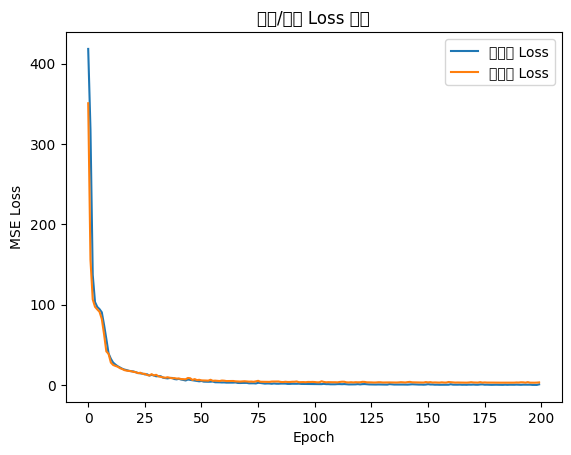

In [5]:
import matplotlib.pyplot as plt

# 打印每一轮的 loss 和 val_loss 数值
print("训练集 loss：", history.history['loss'])
print("验证集 val_loss：", history.history['val_loss'])

# 画loss曲线
plt.figure()
plt.plot(history.history['loss'], label='训练集 Loss')
plt.plot(history.history['val_loss'], label='验证集 Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('训练/验证 Loss 曲线')
plt.legend()

plt.show()


In [6]:
# 编译模型时加上metrics
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# 训练时也会显示mae，但你可以单独在测试集上评估
mae = model.evaluate(X_val, y_val, verbose=1)[1]
print("测试集 MAE：", mae)


72/72 [==============================] - 0s 4ms/step - loss: 3.4204 - mae: 1.0999
测试集 MAE： 1.0998599529266357


In [9]:
import numpy as np
import os

save_path = r'D:\wangshuo\localization'
labels = np.load(os.path.join(save_path, 'labels.npy'))

# 创建新数组
labels_real = labels.copy()

# 第一列：*5 -2.5 后转弧度
labels_real[:, 0] = np.deg2rad(labels[:, 0] * 5 - 2.5)

# 第二列：*3 +4.5 后再*10
labels_real[:, 1] = (labels[:, 1] * 3 + 4.5) * 10

# 第三列不变

# 保存
np.save(os.path.join(save_path, 'label_REAL.npy'), labels_real)

# 检查一下
print(f"\n第一列最大值: {labels_real[:,0].max()}，最小值: {labels_real[:,0].min()}")
print(f"第二列最大值: {labels_real[:,1].max()}，最小值: {labels_real[:,1].min()}")
print("前3行：\n", labels_real[:3])



第一列最大值: 3.097959422289935，最小值: 0.04363323129985824
第二列最大值: 975.0，最小值: 75.0
前3行：
 [[  0.82903139 345.           1.        ]
 [  0.82903139 345.          11.        ]
 [  0.82903139 345.          12.        ]]


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf

def polar_distance_squared(y_true, y_pred):
    # y_true, y_pred: (batch, 2) 第一列是弧度，第二列是距离
    theta_true = y_true[:, 0]
    r_true = y_true[:, 1]
    theta_pred = y_pred[:, 0]
    r_pred = y_pred[:, 1]
    # 计算距离的平方
    dist_sq = tf.maximum(
    tf.square(r_true) + tf.square(r_pred) - 2.0 * r_true * r_pred * tf.cos(theta_true - theta_pred),
    1e-8
)

    # 返回均值
    return tf.reduce_mean(dist_sq)

# 加载数据
save_path = r'D:\wangshuo\localization'
waveforms = np.load(os.path.join(save_path, 'waveforms.npy'), allow_pickle=True)
labels = np.load(os.path.join(save_path, 'label_REAL.npy'))

# 输入：waveforms（N, 1024），输出 labels 的前两列（N, 2）
X = np.stack(waveforms).astype('float32')   # 确保类型没问题
y = labels[:, :2].astype('float32')

# 划分训练/验证集
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.1, random_state=42)



import tensorflow as tf
from tensorflow.keras import layers, models

inputs = layers.Input(shape=(1024,))
x = tf.expand_dims(inputs, axis=-1)
x = layers.Conv1D(64, 3, padding='same', activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(128, 3, padding='same', activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(256, 3, padding='same', activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(512, 3, padding='same', activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(1024, 3, padding='same', activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Flatten()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dense(64, activation='relu')(x)
outputs = layers.Dense(2)(x)

model = models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss=polar_distance_squared)

model.summary()


history = model.fit(
    X_train, y_train,
    epochs=500,
    batch_size=3000,
    validation_data=(X_val, y_val)
)







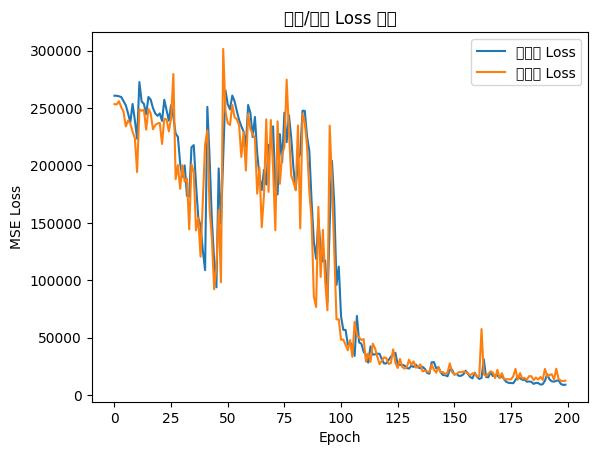

In [11]:
import matplotlib.pyplot as plt

# 打印每一轮的 loss 和 val_loss 数值

# 画loss曲线
plt.figure()
plt.plot(history.history['loss'], label='训练集 Loss')
plt.plot(history.history['val_loss'], label='验证集 Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('训练/验证 Loss 曲线')
plt.legend()

plt.show()


In [22]:
import numpy as np
import os

save_path = r'D:\wangshuo\localization'
labels_real = np.load(os.path.join(save_path, 'label_REAL.npy'))

# 提取
theta = labels_real[:, 0]   # 弧度
r = labels_real[:, 1]       # 距离
z = labels_real[:, 2]       # 第三列保持不变

# 极坐标转直角坐标
x = r * np.cos(theta)
y = r * np.sin(theta)

# 拼接为新数组 (N,3)
labels_xyz = np.stack([x, y, z], axis=1)

# 保存
np.save(os.path.join(save_path, 'label_XYZ.npy'), labels_xyz)

# 检查
print(f"\n第一列最大值: {labels_xyz[:,0].max()}，最小值: {labels_xyz[:,0].min()}")
print(f"第二列最大值: {labels_xyz[:,1].max()}，最小值: {labels_xyz[:,1].min()}")


第一列最大值: 974.0720160423114，最小值: -974.0720160423114
第二列最大值: 450.2048979041581，最小值: 3.2714540524002


训练集: (18356, 1024)
验证集: (2295, 1024)
测试集: (2295, 1024)
Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 1024)]            0         
_________________________________________________________________
dense_94 (Dense)             (None, 1024)              1049600   
_________________________________________________________________
dense_95 (Dense)             (None, 1024)              1049600   
_________________________________________________________________
dense_96 (Dense)             (None, 1024)              1049600   
_________________________________________________________________
dense_97 (Dense)             (None, 1024)              1049600   
_________________________________________________________________
dense_98 (Dense)             (None, 1024)              1049600   
_________________________________________________________________
dens

Epoch 26/2000
7/7 [==============================] - 0s 17ms/step - loss: 173.7037 - val_loss: 183.7003

Epoch 00026: val_loss did not improve from 176.75917
Epoch 27/2000
7/7 [==============================] - 0s 18ms/step - loss: 179.5544 - val_loss: 200.3278

Epoch 00027: val_loss did not improve from 176.75917
Epoch 28/2000
7/7 [==============================] - 0s 17ms/step - loss: 201.7889 - val_loss: 184.3467

Epoch 00028: val_loss did not improve from 176.75917
Epoch 29/2000
7/7 [==============================] - 0s 17ms/step - loss: 177.9189 - val_loss: 173.7702

Epoch 00029: val_loss improved from 176.75917 to 173.77023, saving model to C:\localization\best_model4.h5
Epoch 30/2000
7/7 [==============================] - 0s 20ms/step - loss: 169.4507 - val_loss: 176.2277

Epoch 00030: val_loss did not improve from 173.77023
Epoch 31/2000
7/7 [==============================] - 0s 18ms/step - loss: 167.6014 - val_loss: 173.9720

Epoch 00031: val_loss did not improve from 173.7702

7/7 [==============================] - 0s 18ms/step - loss: 34.5149 - val_loss: 62.9435

Epoch 00118: val_loss did not improve from 44.47382
Epoch 119/2000
7/7 [==============================] - 0s 17ms/step - loss: 38.3816 - val_loss: 59.8400

Epoch 00119: val_loss did not improve from 44.47382
Epoch 120/2000
7/7 [==============================] - 0s 17ms/step - loss: 27.2370 - val_loss: 47.4863

Epoch 00120: val_loss did not improve from 44.47382
Epoch 121/2000
7/7 [==============================] - 0s 19ms/step - loss: 24.0715 - val_loss: 45.5908

Epoch 00121: val_loss did not improve from 44.47382
Epoch 122/2000
7/7 [==============================] - 0s 17ms/step - loss: 23.8079 - val_loss: 43.7520

Epoch 00122: val_loss improved from 44.47382 to 43.75201, saving model to C:\localization\best_model4.h5
Epoch 123/2000
7/7 [==============================] - 0s 17ms/step - loss: 24.0768 - val_loss: 41.9451

Epoch 00123: val_loss improved from 43.75201 to 41.94512, saving model to C:\l


Epoch 00169: val_loss did not improve from 40.66251
Epoch 170/2000
7/7 [==============================] - 0s 18ms/step - loss: 21.7757 - val_loss: 57.0584

Epoch 00170: val_loss did not improve from 40.66251
Epoch 171/2000
7/7 [==============================] - 0s 17ms/step - loss: 32.7877 - val_loss: 52.7225

Epoch 00171: val_loss did not improve from 40.66251
Epoch 172/2000
7/7 [==============================] - 0s 19ms/step - loss: 25.9727 - val_loss: 51.5437

Epoch 00172: val_loss did not improve from 40.66251
Epoch 173/2000
7/7 [==============================] - 0s 17ms/step - loss: 24.7444 - val_loss: 42.4106

Epoch 00173: val_loss did not improve from 40.66251
Epoch 174/2000
7/7 [==============================] - 0s 18ms/step - loss: 26.5763 - val_loss: 45.1816

Epoch 00174: val_loss did not improve from 40.66251
Epoch 175/2000
7/7 [==============================] - 0s 18ms/step - loss: 26.3889 - val_loss: 61.3449

Epoch 00175: val_loss did not improve from 40.66251
Epoch 176/2

7/7 [==============================] - 0s 17ms/step - loss: 20.2491 - val_loss: 46.5797

Epoch 00273: val_loss did not improve from 36.68902
Epoch 274/2000
7/7 [==============================] - 0s 18ms/step - loss: 22.1078 - val_loss: 45.3714

Epoch 00274: val_loss did not improve from 36.68902
Epoch 275/2000
7/7 [==============================] - 0s 18ms/step - loss: 21.9387 - val_loss: 41.9014

Epoch 00275: val_loss did not improve from 36.68902
Epoch 276/2000
7/7 [==============================] - 0s 18ms/step - loss: 18.5055 - val_loss: 42.0311

Epoch 00276: val_loss did not improve from 36.68902
Epoch 277/2000
7/7 [==============================] - 0s 17ms/step - loss: 17.7248 - val_loss: 45.7908

Epoch 00277: val_loss did not improve from 36.68902
Epoch 278/2000
7/7 [==============================] - 0s 17ms/step - loss: 17.6824 - val_loss: 38.6211

Epoch 00278: val_loss did not improve from 36.68902
Epoch 279/2000
7/7 [==============================] - 0s 19ms/step - loss: 17.2

7/7 [==============================] - 0s 18ms/step - loss: 17.9241 - val_loss: 39.7688

Epoch 00376: val_loss did not improve from 34.12287
Epoch 377/2000
7/7 [==============================] - 0s 17ms/step - loss: 17.5532 - val_loss: 37.7754

Epoch 00377: val_loss did not improve from 34.12287
Epoch 378/2000
7/7 [==============================] - 0s 17ms/step - loss: 17.1499 - val_loss: 37.3554

Epoch 00378: val_loss did not improve from 34.12287
Epoch 379/2000
7/7 [==============================] - 0s 17ms/step - loss: 16.7026 - val_loss: 43.0711

Epoch 00379: val_loss did not improve from 34.12287
Epoch 380/2000
7/7 [==============================] - 0s 18ms/step - loss: 16.4032 - val_loss: 41.6209

Epoch 00380: val_loss did not improve from 34.12287
Epoch 381/2000
7/7 [==============================] - 0s 18ms/step - loss: 18.2103 - val_loss: 37.4003

Epoch 00381: val_loss did not improve from 34.12287
Epoch 382/2000
7/7 [==============================] - 0s 17ms/step - loss: 17.0

7/7 [==============================] - 0s 17ms/step - loss: 12.0968 - val_loss: 36.0748

Epoch 00480: val_loss did not improve from 32.62347
Epoch 481/2000
7/7 [==============================] - 0s 17ms/step - loss: 15.0045 - val_loss: 38.4286

Epoch 00481: val_loss did not improve from 32.62347
Epoch 482/2000
7/7 [==============================] - 0s 17ms/step - loss: 15.4346 - val_loss: 37.9452

Epoch 00482: val_loss did not improve from 32.62347
Epoch 483/2000
7/7 [==============================] - 0s 17ms/step - loss: 12.6696 - val_loss: 33.6749

Epoch 00483: val_loss did not improve from 32.62347
Epoch 484/2000
7/7 [==============================] - 0s 19ms/step - loss: 12.6118 - val_loss: 44.1231

Epoch 00484: val_loss did not improve from 32.62347
Epoch 485/2000
7/7 [==============================] - 0s 17ms/step - loss: 21.3857 - val_loss: 39.8375

Epoch 00485: val_loss did not improve from 32.62347
Epoch 486/2000
7/7 [==============================] - 0s 18ms/step - loss: 16.1


Epoch 00531: val_loss did not improve from 30.10906
Epoch 532/2000
7/7 [==============================] - 0s 17ms/step - loss: 14.5473 - val_loss: 36.6469

Epoch 00532: val_loss did not improve from 30.10906
Epoch 533/2000
7/7 [==============================] - 0s 17ms/step - loss: 12.5860 - val_loss: 35.6138

Epoch 00533: val_loss did not improve from 30.10906
Epoch 534/2000
7/7 [==============================] - 0s 17ms/step - loss: 12.9160 - val_loss: 35.6870

Epoch 00534: val_loss did not improve from 30.10906
Epoch 535/2000
7/7 [==============================] - 0s 19ms/step - loss: 15.0238 - val_loss: 34.6827

Epoch 00535: val_loss did not improve from 30.10906
Epoch 536/2000
7/7 [==============================] - 0s 17ms/step - loss: 13.7294 - val_loss: 33.4142

Epoch 00536: val_loss did not improve from 30.10906
Epoch 537/2000
7/7 [==============================] - 0s 17ms/step - loss: 11.3188 - val_loss: 35.9232

Epoch 00537: val_loss did not improve from 30.10906
Epoch 538/2

7/7 [==============================] - 0s 17ms/step - loss: 11.0673 - val_loss: 36.8812

Epoch 00637: val_loss did not improve from 30.10906
Epoch 638/2000
7/7 [==============================] - 0s 17ms/step - loss: 12.2736 - val_loss: 35.7900

Epoch 00638: val_loss did not improve from 30.10906
Epoch 639/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.6544 - val_loss: 36.2037

Epoch 00639: val_loss did not improve from 30.10906
Epoch 640/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.8915 - val_loss: 34.6443

Epoch 00640: val_loss did not improve from 30.10906
Epoch 641/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.7245 - val_loss: 33.9855

Epoch 00641: val_loss did not improve from 30.10906
Epoch 642/2000
7/7 [==============================] - 0s 18ms/step - loss: 10.9600 - val_loss: 31.6944

Epoch 00642: val_loss did not improve from 30.10906
Epoch 643/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.10


Epoch 00689: val_loss did not improve from 30.10906
Epoch 690/2000
7/7 [==============================] - 0s 17ms/step - loss: 21.1870 - val_loss: 44.7544

Epoch 00690: val_loss did not improve from 30.10906
Epoch 691/2000
7/7 [==============================] - 0s 17ms/step - loss: 18.1127 - val_loss: 43.5422

Epoch 00691: val_loss did not improve from 30.10906
Epoch 692/2000
7/7 [==============================] - 0s 18ms/step - loss: 16.2498 - val_loss: 41.4730

Epoch 00692: val_loss did not improve from 30.10906
Epoch 693/2000
7/7 [==============================] - 0s 18ms/step - loss: 14.1753 - val_loss: 38.3070

Epoch 00693: val_loss did not improve from 30.10906
Epoch 694/2000
7/7 [==============================] - 0s 18ms/step - loss: 12.4944 - val_loss: 36.8329

Epoch 00694: val_loss did not improve from 30.10906
Epoch 695/2000
7/7 [==============================] - 0s 17ms/step - loss: 11.0720 - val_loss: 35.3749

Epoch 00695: val_loss did not improve from 30.10906
Epoch 696/2

7/7 [==============================] - 0s 17ms/step - loss: 11.6194 - val_loss: 36.3967

Epoch 00795: val_loss did not improve from 30.10906
Epoch 796/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.1229 - val_loss: 40.6043

Epoch 00796: val_loss did not improve from 30.10906
Epoch 797/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.7050 - val_loss: 40.5683

Epoch 00797: val_loss did not improve from 30.10906
Epoch 798/2000
7/7 [==============================] - 0s 17ms/step - loss: 12.8547 - val_loss: 36.8362

Epoch 00798: val_loss did not improve from 30.10906
Epoch 799/2000
7/7 [==============================] - 0s 18ms/step - loss: 8.4959 - val_loss: 37.1313

Epoch 00799: val_loss did not improve from 30.10906
Epoch 800/2000
7/7 [==============================] - 0s 17ms/step - loss: 11.5400 - val_loss: 36.8858

Epoch 00800: val_loss did not improve from 30.10906
Epoch 801/2000
7/7 [==============================] - 0s 17ms/step - loss: 11.02

7/7 [==============================] - 0s 19ms/step - loss: 10.1052 - val_loss: 36.1177

Epoch 00848: val_loss did not improve from 30.10906
Epoch 849/2000
7/7 [==============================] - 0s 18ms/step - loss: 8.9309 - val_loss: 34.7073

Epoch 00849: val_loss did not improve from 30.10906
Epoch 850/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.9561 - val_loss: 35.7129

Epoch 00850: val_loss did not improve from 30.10906
Epoch 851/2000
7/7 [==============================] - 0s 18ms/step - loss: 10.3058 - val_loss: 36.9401

Epoch 00851: val_loss did not improve from 30.10906
Epoch 852/2000
7/7 [==============================] - 0s 18ms/step - loss: 9.3869 - val_loss: 36.4353

Epoch 00852: val_loss did not improve from 30.10906
Epoch 853/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.4865 - val_loss: 39.5473

Epoch 00853: val_loss did not improve from 30.10906
Epoch 854/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.8882

7/7 [==============================] - 0s 17ms/step - loss: 9.0739 - val_loss: 39.3634

Epoch 00901: val_loss did not improve from 30.10906
Epoch 902/2000
7/7 [==============================] - 0s 17ms/step - loss: 15.4378 - val_loss: 43.5794

Epoch 00902: val_loss did not improve from 30.10906
Epoch 903/2000
7/7 [==============================] - 0s 18ms/step - loss: 17.9388 - val_loss: 41.5081

Epoch 00903: val_loss did not improve from 30.10906
Epoch 904/2000
7/7 [==============================] - 0s 18ms/step - loss: 13.4197 - val_loss: 37.5695

Epoch 00904: val_loss did not improve from 30.10906
Epoch 905/2000
7/7 [==============================] - 0s 18ms/step - loss: 9.3531 - val_loss: 36.4228

Epoch 00905: val_loss did not improve from 30.10906
Epoch 906/2000
7/7 [==============================] - 0s 18ms/step - loss: 7.7703 - val_loss: 37.2884

Epoch 00906: val_loss did not improve from 30.10906
Epoch 907/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.5154 

7/7 [==============================] - 0s 17ms/step - loss: 8.5225 - val_loss: 35.7705

Epoch 00954: val_loss did not improve from 30.10906
Epoch 955/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.3569 - val_loss: 34.9873

Epoch 00955: val_loss did not improve from 30.10906
Epoch 956/2000
7/7 [==============================] - 0s 18ms/step - loss: 8.5150 - val_loss: 38.6432

Epoch 00956: val_loss did not improve from 30.10906
Epoch 957/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.0224 - val_loss: 36.7416

Epoch 00957: val_loss did not improve from 30.10906
Epoch 958/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.4474 - val_loss: 35.6846

Epoch 00958: val_loss did not improve from 30.10906
Epoch 959/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.5738 - val_loss: 38.8617

Epoch 00959: val_loss did not improve from 30.10906
Epoch 960/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.1096 -

7/7 [==============================] - 0s 17ms/step - loss: 29.4384 - val_loss: 57.1235

Epoch 01007: val_loss did not improve from 30.10906
Epoch 1008/2000
7/7 [==============================] - 0s 17ms/step - loss: 28.3584 - val_loss: 51.7450

Epoch 01008: val_loss did not improve from 30.10906
Epoch 1009/2000
7/7 [==============================] - 0s 17ms/step - loss: 33.5692 - val_loss: 68.4425

Epoch 01009: val_loss did not improve from 30.10906
Epoch 1010/2000
7/7 [==============================] - 0s 18ms/step - loss: 49.6631 - val_loss: 74.0156

Epoch 01010: val_loss did not improve from 30.10906
Epoch 1011/2000
7/7 [==============================] - 0s 17ms/step - loss: 48.0418 - val_loss: 73.6388

Epoch 01011: val_loss did not improve from 30.10906
Epoch 1012/2000
7/7 [==============================] - 0s 17ms/step - loss: 52.4517 - val_loss: 80.3066

Epoch 01012: val_loss did not improve from 30.10906
Epoch 1013/2000
7/7 [==============================] - 0s 19ms/step - loss

7/7 [==============================] - 0s 18ms/step - loss: 6.0051 - val_loss: 31.8156

Epoch 01111: val_loss did not improve from 30.10906
Epoch 1112/2000
7/7 [==============================] - 0s 18ms/step - loss: 6.3466 - val_loss: 32.4111

Epoch 01112: val_loss did not improve from 30.10906
Epoch 1113/2000
7/7 [==============================] - 0s 19ms/step - loss: 7.6471 - val_loss: 36.5039

Epoch 01113: val_loss did not improve from 30.10906
Epoch 1114/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.9339 - val_loss: 33.7285

Epoch 01114: val_loss did not improve from 30.10906
Epoch 1115/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.1913 - val_loss: 35.4129

Epoch 01115: val_loss did not improve from 30.10906
Epoch 1116/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.0627 - val_loss: 33.5855

Epoch 01116: val_loss did not improve from 30.10906
Epoch 1117/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.


Epoch 01163: val_loss did not improve from 30.10906
Epoch 1164/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.2225 - val_loss: 33.2184

Epoch 01164: val_loss did not improve from 30.10906
Epoch 1165/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.9855 - val_loss: 35.0644

Epoch 01165: val_loss did not improve from 30.10906
Epoch 1166/2000
7/7 [==============================] - 0s 18ms/step - loss: 7.5754 - val_loss: 33.4558

Epoch 01166: val_loss did not improve from 30.10906
Epoch 1167/2000
7/7 [==============================] - 0s 18ms/step - loss: 7.8822 - val_loss: 34.1224

Epoch 01167: val_loss did not improve from 30.10906
Epoch 1168/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.8023 - val_loss: 33.6315

Epoch 01168: val_loss did not improve from 30.10906
Epoch 1169/2000
7/7 [==============================] - 0s 18ms/step - loss: 8.5489 - val_loss: 35.6040

Epoch 01169: val_loss did not improve from 30.10906
Epoch 1170/


Epoch 01268: val_loss did not improve from 30.10906
Epoch 1269/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.8320 - val_loss: 32.6500

Epoch 01269: val_loss did not improve from 30.10906
Epoch 1270/2000
7/7 [==============================] - 0s 18ms/step - loss: 7.7621 - val_loss: 31.7031

Epoch 01270: val_loss did not improve from 30.10906
Epoch 1271/2000
7/7 [==============================] - 0s 18ms/step - loss: 7.0966 - val_loss: 31.3086

Epoch 01271: val_loss did not improve from 30.10906
Epoch 1272/2000
7/7 [==============================] - 0s 17ms/step - loss: 5.3946 - val_loss: 31.0538

Epoch 01272: val_loss did not improve from 30.10906
Epoch 1273/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.1298 - val_loss: 33.2415

Epoch 01273: val_loss did not improve from 30.10906
Epoch 1274/2000
7/7 [==============================] - 0s 18ms/step - loss: 6.7779 - val_loss: 31.2129

Epoch 01274: val_loss did not improve from 30.10906
Epoch 1275/

7/7 [==============================] - 0s 18ms/step - loss: 8.2388 - val_loss: 36.0339

Epoch 01321: val_loss did not improve from 30.07277
Epoch 1322/2000
7/7 [==============================] - 0s 18ms/step - loss: 8.4691 - val_loss: 34.9247

Epoch 01322: val_loss did not improve from 30.07277
Epoch 1323/2000
7/7 [==============================] - 0s 19ms/step - loss: 8.6622 - val_loss: 34.2468

Epoch 01323: val_loss did not improve from 30.07277
Epoch 1324/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.9028 - val_loss: 37.9703

Epoch 01324: val_loss did not improve from 30.07277
Epoch 1325/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.3649 - val_loss: 34.0586

Epoch 01325: val_loss did not improve from 30.07277
Epoch 1326/2000
7/7 [==============================] - 0s 17ms/step - loss: 6.8271 - val_loss: 32.2277

Epoch 01326: val_loss did not improve from 30.07277
Epoch 1327/2000
7/7 [==============================] - 0s 18ms/step - loss: 5.48

7/7 [==============================] - 0s 17ms/step - loss: 18.5549 - val_loss: 44.3134

Epoch 01425: val_loss did not improve from 29.62289
Epoch 1426/2000
7/7 [==============================] - 0s 18ms/step - loss: 17.7366 - val_loss: 42.5706

Epoch 01426: val_loss did not improve from 29.62289
Epoch 1427/2000
7/7 [==============================] - 0s 19ms/step - loss: 15.9170 - val_loss: 41.4530

Epoch 01427: val_loss did not improve from 29.62289
Epoch 1428/2000
7/7 [==============================] - 0s 18ms/step - loss: 15.0635 - val_loss: 41.1075

Epoch 01428: val_loss did not improve from 29.62289
Epoch 1429/2000
7/7 [==============================] - 0s 17ms/step - loss: 14.5187 - val_loss: 42.1387

Epoch 01429: val_loss did not improve from 29.62289
Epoch 1430/2000
7/7 [==============================] - 0s 18ms/step - loss: 14.2461 - val_loss: 39.8712

Epoch 01430: val_loss did not improve from 29.62289
Epoch 1431/2000
7/7 [==============================] - 0s 17ms/step - loss


Epoch 01529: val_loss did not improve from 29.62289
Epoch 1530/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.6415 - val_loss: 34.9676

Epoch 01530: val_loss did not improve from 29.62289
Epoch 1531/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.6068 - val_loss: 34.2357

Epoch 01531: val_loss did not improve from 29.62289
Epoch 1532/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.2268 - val_loss: 34.3798

Epoch 01532: val_loss did not improve from 29.62289
Epoch 1533/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.2551 - val_loss: 34.1107

Epoch 01533: val_loss did not improve from 29.62289
Epoch 1534/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.9591 - val_loss: 35.1447

Epoch 01534: val_loss did not improve from 29.62289
Epoch 1535/2000
7/7 [==============================] - 0s 20ms/step - loss: 8.8164 - val_loss: 32.2155

Epoch 01535: val_loss did not improve from 29.62289
Epoch 1536/


Epoch 01634: val_loss did not improve from 29.62289
Epoch 1635/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.3460 - val_loss: 34.6005

Epoch 01635: val_loss did not improve from 29.62289
Epoch 1636/2000
7/7 [==============================] - 0s 17ms/step - loss: 6.3531 - val_loss: 33.3712

Epoch 01636: val_loss did not improve from 29.62289
Epoch 1637/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.6098 - val_loss: 32.8815

Epoch 01637: val_loss did not improve from 29.62289
Epoch 1638/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.1891 - val_loss: 36.0990

Epoch 01638: val_loss did not improve from 29.62289
Epoch 1639/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.3374 - val_loss: 35.5567

Epoch 01639: val_loss did not improve from 29.62289
Epoch 1640/2000
7/7 [==============================] - 0s 18ms/step - loss: 6.7833 - val_loss: 37.1840

Epoch 01640: val_loss did not improve from 29.62289
Epoch 1641/


Epoch 01739: val_loss did not improve from 29.62289
Epoch 1740/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.8556 - val_loss: 33.8011

Epoch 01740: val_loss did not improve from 29.62289
Epoch 1741/2000
7/7 [==============================] - 0s 18ms/step - loss: 7.9888 - val_loss: 33.9062

Epoch 01741: val_loss did not improve from 29.62289
Epoch 1742/2000
7/7 [==============================] - 0s 17ms/step - loss: 6.4624 - val_loss: 34.4589

Epoch 01742: val_loss did not improve from 29.62289
Epoch 1743/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.0121 - val_loss: 34.9289

Epoch 01743: val_loss did not improve from 29.62289
Epoch 1744/2000
7/7 [==============================] - 0s 18ms/step - loss: 7.4360 - val_loss: 34.6897

Epoch 01744: val_loss did not improve from 29.62289
Epoch 1745/2000
7/7 [==============================] - 0s 17ms/step - loss: 6.6723 - val_loss: 32.6884

Epoch 01745: val_loss did not improve from 29.62289
Epoch 1746/

7/7 [==============================] - 0s 17ms/step - loss: 12.8119 - val_loss: 39.0629

Epoch 01792: val_loss did not improve from 29.62289
Epoch 1793/2000
7/7 [==============================] - 0s 17ms/step - loss: 12.2093 - val_loss: 38.9865

Epoch 01793: val_loss did not improve from 29.62289
Epoch 1794/2000
7/7 [==============================] - 0s 17ms/step - loss: 11.8397 - val_loss: 37.8354

Epoch 01794: val_loss did not improve from 29.62289
Epoch 1795/2000
7/7 [==============================] - 0s 17ms/step - loss: 11.1260 - val_loss: 38.2524

Epoch 01795: val_loss did not improve from 29.62289
Epoch 1796/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.7625 - val_loss: 37.9645

Epoch 01796: val_loss did not improve from 29.62289
Epoch 1797/2000
7/7 [==============================] - 0s 18ms/step - loss: 10.9995 - val_loss: 39.7780

Epoch 01797: val_loss did not improve from 29.62289
Epoch 1798/2000
7/7 [==============================] - 0s 17ms/step - loss


Epoch 01844: val_loss did not improve from 29.62289
Epoch 1845/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.0038 - val_loss: 33.6677

Epoch 01845: val_loss did not improve from 29.62289
Epoch 1846/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.1570 - val_loss: 34.6768

Epoch 01846: val_loss did not improve from 29.62289
Epoch 1847/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.2689 - val_loss: 33.2126

Epoch 01847: val_loss did not improve from 29.62289
Epoch 1848/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.3568 - val_loss: 33.2604

Epoch 01848: val_loss did not improve from 29.62289
Epoch 1849/2000
7/7 [==============================] - 0s 20ms/step - loss: 7.7293 - val_loss: 33.2640

Epoch 01849: val_loss did not improve from 29.62289
Epoch 1850/2000
7/7 [==============================] - 0s 17ms/step - loss: 6.8418 - val_loss: 35.3894

Epoch 01850: val_loss did not improve from 29.62289
Epoch 1851/


Epoch 01949: val_loss did not improve from 29.62289
Epoch 1950/2000
7/7 [==============================] - 0s 19ms/step - loss: 8.8073 - val_loss: 36.1176

Epoch 01950: val_loss did not improve from 29.62289
Epoch 1951/2000
7/7 [==============================] - 0s 18ms/step - loss: 8.6685 - val_loss: 36.0763

Epoch 01951: val_loss did not improve from 29.62289
Epoch 1952/2000
7/7 [==============================] - 0s 18ms/step - loss: 8.5511 - val_loss: 36.6288

Epoch 01952: val_loss did not improve from 29.62289
Epoch 1953/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.4379 - val_loss: 35.6317

Epoch 01953: val_loss did not improve from 29.62289
Epoch 1954/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.2093 - val_loss: 35.5863

Epoch 01954: val_loss did not improve from 29.62289
Epoch 1955/2000
7/7 [==============================] - 0s 18ms/step - loss: 6.9712 - val_loss: 34.1042

Epoch 01955: val_loss did not improve from 29.62289
Epoch 1956/

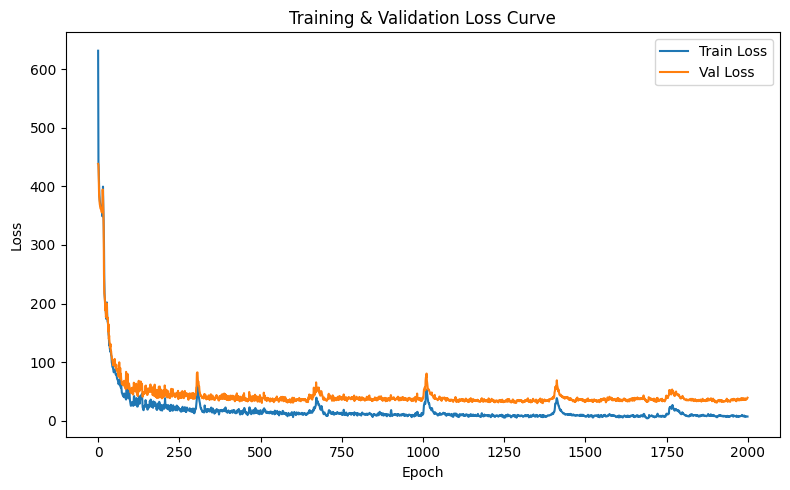

In [21]:
import numpy as np
import os
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

# 加载数据
save_path = r'C:\localization'
waveforms = np.load(os.path.join(save_path, 'waveforms.npy'), allow_pickle=True)
labels = np.load(os.path.join(save_path, 'label_XYZ.npy'))

X = np.stack(waveforms).astype('float32')
y = labels[:, :2].astype('float32')

# 划分：8:1:1
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

print("训练集:", X_train.shape)
print("验证集:", X_val.shape)
print("测试集:", X_test.shape)

# 建模
inputs = layers.Input(shape=(1024,))
# x = layers.Reshape((1024, 1))(inputs)
# x = layers.Conv1D(64, 3, padding='same', activation='relu')(x)
# x = layers.MaxPooling1D(2)(x)
# x = layers.Conv1D(128, 3, padding='same', activation='relu')(x)
# x = layers.MaxPooling1D(2)(x)
# x = layers.Conv1D(256, 3, padding='same', activation='relu')(x)
# x = layers.MaxPooling1D(2)(x)
# x = layers.Conv1D(512, 3, padding='same', activation='relu')(x)
# x = layers.MaxPooling1D(2)(x)
# x = layers.Conv1D(1024, 3, padding='same', activation='relu')(x)
# x = layers.MaxPooling1D(2)(x)
# x = layers.Conv1D(1024, 3, padding='same', activation='relu')(x)
# x = layers.MaxPooling1D(2)(x)
# x = layers.Conv1D(1024, 3, padding='same', activation='relu')(x)
# x = layers.MaxPooling1D(2)(x)
# x = layers.Conv1D(1024, 3, padding='same', activation='relu')(x)
# x = layers.MaxPooling1D(2)(x)
# x = layers.Flatten()(x)
x = layers.Dense(1024, activation='relu')(inputs)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)

x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)

x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)

x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
outputs = layers.Dense(2)(x)

model = models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss=euclidean_distance_loss)
model.summary()

# Checkpoint回调
model_path = os.path.join(save_path, 'best_model4.h5')
checkpoint = ModelCheckpoint(
    filepath=model_path,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    mode='min',
    verbose=1
)

# 训练模型
history = model.fit(
    X_train, y_train,
    epochs=2000,
    batch_size=3000,
    validation_data=(X_val, y_val),
    callbacks=[checkpoint]
)

# 训练后加载最佳模型
best_model = load_model(
    model_path, 
    custom_objects={'euclidean_distance_loss': euclidean_distance_loss}
)

# 测试集评估
test_loss = best_model.evaluate(X_test, y_test)
print("测试集欧氏距离均值:", test_loss)

# 绘制训练曲线
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Curve')
plt.legend()
plt.tight_layout()
plt.show()


In [23]:
from tensorflow.keras.models import load_model

# 先定义loss（和训练时一样），以便加载
def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join(save_path, 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 预测
y_pred = best_model.predict(X_test)  # shape: (num_test_samples, 2)

# 计算欧氏距离
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)

print(f"测试集样本的平均欧氏距离: {mean_distance:.4f}")



测试集样本的平均欧氏距离: 25.8374


In [24]:
import pandas as pd

# history.history 是一个dict，key有 'loss', 'val_loss' 等
history_df = pd.DataFrame(history.history)
history_csv_path = os.path.join(save_path, 'train_history.csv')
history_df.to_csv(history_csv_path, index=False)

print(f"训练曲线已保存到 {history_csv_path}")


训练曲线已保存到 C:\localization\train_history.csv


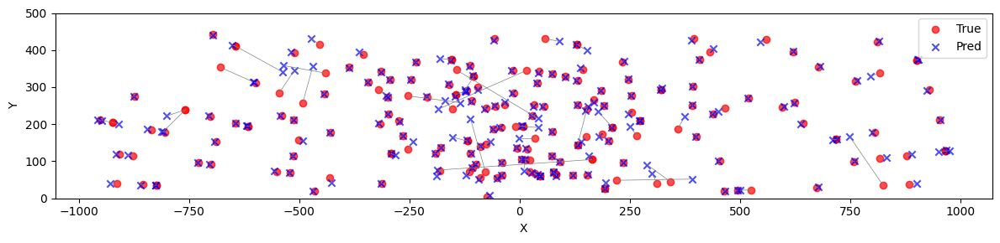

In [37]:
import matplotlib.pyplot as plt
import numpy as np

np.random.seed(42)
idx = np.random.choice(len(y_test), 200, replace=False)  # 随机选200个

plt.figure(figsize=(12,3))

plt.scatter(y_test[idx,0], y_test[idx,1], c='red', marker='o', label='True', alpha=0.7)
plt.scatter(y_pred[idx,0], y_pred[idx,1], c='blue', marker='x', label='Pred', alpha=0.7)

for i in idx:
    plt.plot([y_test[i,0], y_pred[i,0]], [y_test[i,1], y_pred[i,1]], c='gray', lw=0.5)

plt.legend()
plt.xlabel('X')
plt.ylabel('Y')


plt.ylim(0, 500)  # y轴范围0~500

plt.tight_layout()
plt.show()


In [38]:
import numpy as np
import os

# 假设 save_path 已定义
np.save(os.path.join(save_path, 'X_train.npy'), X_train)
np.save(os.path.join(save_path, 'y_train.npy'), y_train)
np.save(os.path.join(save_path, 'X_val.npy'), X_val)
np.save(os.path.join(save_path, 'y_val.npy'), y_val)
np.save(os.path.join(save_path, 'X_test.npy'), X_test)
np.save(os.path.join(save_path, 'y_test.npy'), y_test)

print("数据已保存为6个npy文件！")


数据已保存为6个npy文件！


In [ ]:
import numpy as np
import os

# === 路径 ===
clean_path = 'D:/wangshuo/clean_train/jxl4djzwave.npy'
noise_path = 'D:/wangshuo/zaoyinshaozhou.npy'
save_dir = 'D:/wangshuo'

# === 加载数据 ===
clean_data = np.load(clean_path)  # shape: (N, L)
noise_data = np.load(noise_path)  # shape: (M, L)
assert clean_data.shape[1] == noise_data.shape[1], "信号长度不一致！"

# === 添加噪声函数（按指定 SNR）===
def add_noise_with_snr(clean, noise, snr_db):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean(noise ** 2)
    if noise_power == 0:
        return clean  # 避免除以 0
    factor = np.sqrt(signal_power / (noise_power * 10 ** (snr_db / 10)))
    return clean + noise * factor

# === SNR 级别 ===
snr_levels = [0, 5, 10, 15]
contaminated_sets = {snr: [] for snr in snr_levels}

# === 逐条处理 ===
num_clean = clean_data.shape[0]
for i in range(num_clean):
    clean = clean_data[i]
    noise = noise_data[np.random.randint(noise_data.shape[0])]  # 随机选噪声

    for snr in snr_levels:
        contaminated = add_noise_with_snr(clean, noise, snr)
        contaminated_sets[snr].append(contaminated)

# === 保存 ===
for snr, signals in contaminated_sets.items():
    arr = np.array(signals)
    save_path = os.path.join(save_dir, f'jxl4djzwave_contaminated_{snr}dB.npy')
    np.save(save_path, arr)
    print(f"Saved: {save_path}, shape: {arr.shape}")


In [54]:
import numpy as np
import os

# === 路径 ===
clean_path = 'C:/localization/X_train.npy'
noise_path = 'D:/wangshuo/zaoyinshaozhou.npy'
save_dir = 'C:/localization'

# === 加载数据 ===
clean_data = np.load(clean_path)  # shape: (N, L)
noise_data = np.load(noise_path)  # shape: (M, L)
assert clean_data.shape[1] == noise_data.shape[1], "信号长度不一致！"

# === 添加噪声函数（按指定 SNR）===
def add_noise_with_snr(clean, noise, snr_db):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean(noise ** 2)
    if noise_power == 0:
        return clean  # 避免除以 0
    factor = np.sqrt(signal_power / (noise_power * 10 ** (snr_db / 10)))
    return clean + noise * factor

# === SNR 级别 ===
snr_levels = [0, 5, 10, 15]
contaminated_sets = {snr: [] for snr in snr_levels}

# === 逐条处理 ===
num_clean = clean_data.shape[0]
for i in range(num_clean):
    clean = clean_data[i]
    noise = noise_data[np.random.randint(noise_data.shape[0])]  # 随机选噪声

    for snr in snr_levels:
        contaminated = add_noise_with_snr(clean, noise, snr)
        contaminated_sets[snr].append(contaminated)

# === 保存 ===
for snr, signals in contaminated_sets.items():
    arr = np.array(signals)
    save_path = os.path.join(save_dir, f'x_train_{snr}dB.npy')
    np.save(save_path, arr)
    print(f"Saved: {save_path}, shape: {arr.shape}")
    
    
    


Saved: C:/localization\x_train_0dB.npy, shape: (18356, 1024)
Saved: C:/localization\x_train_5dB.npy, shape: (18356, 1024)
Saved: C:/localization\x_train_10dB.npy, shape: (18356, 1024)
Saved: C:/localization\x_train_15dB.npy, shape: (18356, 1024)


新测试集样本的平均欧氏距离: 30.0521
距离已保存到 C:/localization/noise_distances_15dB.csv


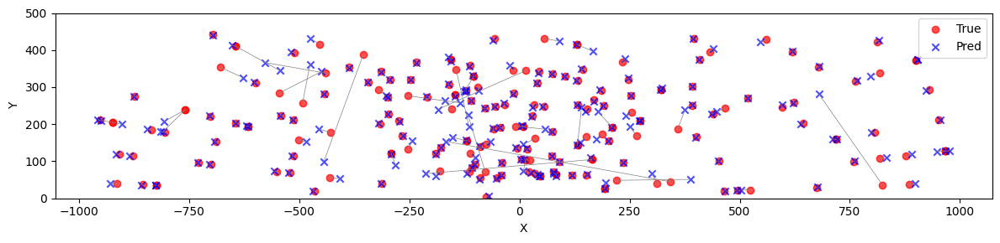

In [84]:
import numpy as np
from tensorflow.keras.models import load_model

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_15dB.npy').astype('float32')

# 预测
y_pred = best_model.predict(new_X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")

import pandas as pd

save_path = 'C:/localization/noise_distances_15dB.csv'
pd.DataFrame({'distance': distances}).to_csv(save_path, index=False)
print(f"距离已保存到 {save_path}")




import matplotlib.pyplot as plt
import numpy as np

np.random.seed(42)
idx = np.random.choice(len(y_test), 200, replace=False)  # 随机选200个

plt.figure(figsize=(12,3))

plt.scatter(y_test[idx,0], y_test[idx,1], c='red', marker='o', label='True', alpha=0.7)
plt.scatter(y_pred[idx,0], y_pred[idx,1], c='blue', marker='x', label='Pred', alpha=0.7)

for i in idx:
    plt.plot([y_test[i,0], y_pred[i,0]], [y_test[i,1], y_pred[i,1]], c='gray', lw=0.5)

plt.legend()
plt.xlabel('X')
plt.ylabel('Y')


plt.ylim(0, 500)  # y轴范围0~500

plt.tight_layout()
plt.show()


In [64]:
import numpy as np
from sklearn.model_selection import train_test_split

# === 加载数据 ===
x_train = np.load('C:/localization/x_train_15dB.npy')  # 输入（污染信号）
y_train = np.load('C:/localization/X_train.npy')       # 目标（干净信号）

x_val = np.load('C:/localization/x_val_15dB.npy')  # 输入（污染信号）
y_val = np.load('C:/localization/X_val.npy')
# === 添加通道维度 ===
x_train = x_train[..., np.newaxis]  # (N, 1024, 1)
y_train = y_train[..., np.newaxis]

x_val = x_val[..., np.newaxis]  # (N, 1024, 1)
y_val = y_val[..., np.newaxis]
# === 按 8:1:1 划分 ===

from tensorflow.keras import layers, models

# === 你的 U-Net 构建函数 ===
def conv_block(x, filters, kernel_size=3, activation='relu'):
    x = layers.Conv1D(filters, kernel_size, padding='same')(x)
    x = layers.Activation(activation)(x)
    x = layers.Conv1D(filters, kernel_size, padding='same')(x)
    x = layers.Activation(activation)(x)
    return x

def encoder_block(x, filters):
    x = conv_block(x, filters)
    p = layers.MaxPooling1D(pool_size=2)(x)
    return x, p

def decoder_block(x, skip, filters):
    x = layers.UpSampling1D(size=2)(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x

def build_unet_1d(input_length=1024):
    inputs = layers.Input(shape=(input_length, 1))
    e1, p1 = encoder_block(inputs, 32)
    e2, p2 = encoder_block(p1, 64)
    e3, p3 = encoder_block(p2, 128)
    e4, p4 = encoder_block(p3, 256)
    e5, p5 = encoder_block(p4, 512)
    e6, p6 = encoder_block(p5, 512)
    b = conv_block(p6, 512)
    d6 = decoder_block(b, e6, 512)
    d5 = decoder_block(d6, e5, 256)
    d4 = decoder_block(d5, e4, 128)
    d3 = decoder_block(d4, e3, 64)
    d2 = decoder_block(d3, e2, 32)
    d1 = decoder_block(d2, e1, 32)
    outputs = layers.Conv1D(1, kernel_size=1, activation='linear')(d1)
    return models.Model(inputs=inputs, outputs=outputs)

# 构建模型
model = build_unet_1d(input_length=1024)
model.summary()

from tensorflow.keras.callbacks import EarlyStopping

# === 编译模型 ===
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# === 设置 EarlyStopping（验证集损失连续10轮不提升就停止）===
from tensorflow.keras.callbacks import ModelCheckpoint

# === 设置模型保存路径 ===
checkpoint_path = 'C:/localization/denoise_15dB.h5'

# === 设置只保存 val_loss 最低的模型 ===
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,  # 保存整个模型结构 + 权重
    verbose=1
)

# === 训练固定 100 轮（不使用 early stopping） ===
history = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=100,
    batch_size=2000,
    callbacks=[checkpoint],  # 不再用 EarlyStopping
    verbose=1
)






save_dir = 'C:/localization'
os.makedirs(save_dir, exist_ok=True)

# 保存训练日志为 CSV
df = pd.DataFrame(history.history)
df.to_csv(os.path.join(save_dir, 'denoise_15dB.csv'), index=False)

print("训练日志 CSV 已保存到:", save_dir)


Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           [(None, 1024, 1)]    0                                            
__________________________________________________________________________________________________
conv1d_122 (Conv1D)             (None, 1024, 32)     128         input_15[0][0]                   
__________________________________________________________________________________________________
activation_104 (Activation)     (None, 1024, 32)     0           conv1d_122[0][0]                 
__________________________________________________________________________________________________
conv1d_123 (Conv1D)             (None, 1024, 32)     3104        activation_104[0][0]             
___________________________________________________________________________________________

10/10 [==============================] - 9s 363ms/step - loss: 0.0618 - mae: 0.1147 - val_loss: 0.0150 - val_mae: 0.0678

Epoch 00001: val_loss improved from inf to 0.01503, saving model to C:/localization\denoise_15dB.h5
Epoch 2/100
10/10 [==============================] - 3s 321ms/step - loss: 0.0187 - mae: 0.0741 - val_loss: 0.0119 - val_mae: 0.0642

Epoch 00002: val_loss improved from 0.01503 to 0.01191, saving model to C:/localization\denoise_15dB.h5
Epoch 3/100
10/10 [==============================] - 3s 322ms/step - loss: 0.0060 - mae: 0.0417 - val_loss: 0.0038 - val_mae: 0.0383

Epoch 00003: val_loss improved from 0.01191 to 0.00384, saving model to C:/localization\denoise_15dB.h5
Epoch 4/100
10/10 [==============================] - 3s 319ms/step - loss: 0.0029 - mae: 0.0306 - val_loss: 0.0026 - val_mae: 0.0276

Epoch 00004: val_loss improved from 0.00384 to 0.00261, saving model to C:/localization\denoise_15dB.h5
Epoch 5/100
10/10 [==============================] - 3s 322ms/st

Epoch 37/100
10/10 [==============================] - 3s 320ms/step - loss: 0.0010 - mae: 0.0155 - val_loss: 9.4233e-04 - val_mae: 0.0150

Epoch 00037: val_loss improved from 0.00102 to 0.00094, saving model to C:/localization\denoise_15dB.h5
Epoch 38/100
10/10 [==============================] - 3s 319ms/step - loss: 9.5943e-04 - mae: 0.0151 - val_loss: 9.0693e-04 - val_mae: 0.0147

Epoch 00038: val_loss improved from 0.00094 to 0.00091, saving model to C:/localization\denoise_15dB.h5
Epoch 39/100
10/10 [==============================] - 3s 318ms/step - loss: 9.2694e-04 - mae: 0.0149 - val_loss: 8.8085e-04 - val_mae: 0.0146

Epoch 00039: val_loss improved from 0.00091 to 0.00088, saving model to C:/localization\denoise_15dB.h5
Epoch 40/100
10/10 [==============================] - 3s 320ms/step - loss: 8.9320e-04 - mae: 0.0146 - val_loss: 8.5678e-04 - val_mae: 0.0143

Epoch 00040: val_loss improved from 0.00088 to 0.00086, saving model to C:/localization\denoise_15dB.h5
Epoch 41/100
10/

In [13]:
import numpy as np
from tensorflow.keras.models import load_model

# 定义模型路径和测试数据路径
model_path = 'C:/localization/denoise_15dB.h5'
x_test = np.load('C:/localization/x_test_15dB.npy')

# 添加通道维度（如果还没有）
if x_test.ndim == 2:  # shape (N, 1024)
    x_test = x_test[..., np.newaxis]  # shape (N, 1024, 1)

# 加载模型
denoise_model = load_model(model_path)

# 预测去噪结果
# y_pred = denoise_model.predict(x_test, batch_size=2000)
y_pred = x_test

import numpy as np
from tensorflow.keras.models import load_model

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = y_pred

# 预测
y_Lo_pred = best_model.predict(new_X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_Lo_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")

import pandas as pd

save_path = 'C:/localization/noise_distances_15dB.csv'
pd.DataFrame({'distance': distances}).to_csv(save_path, index=False)
print(f"距离已保存到 {save_path}")


新测试集样本的平均欧氏距离: 30.0521
距离已保存到 C:/localization/noise_distances_15dB.csv


C:\Users\RTX4090D\AppData\Local\Temp\ipykernel_8756\1046577631.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


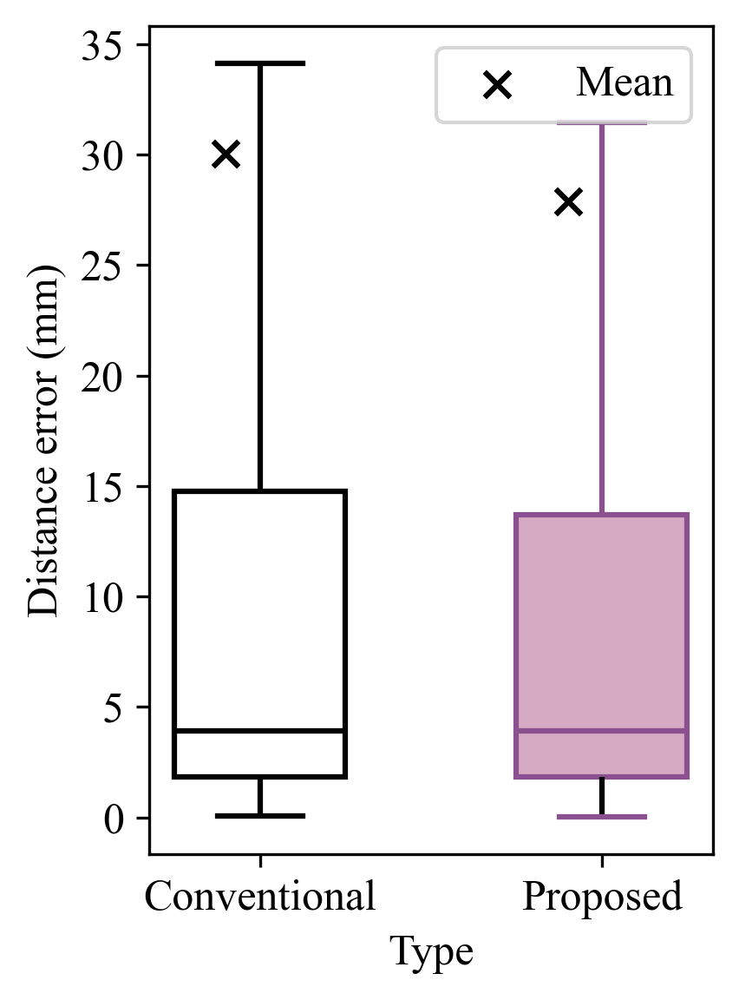

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib

# 全局字体设置
matplotlib.rcParams['font.family'] = 'Times New Roman'
matplotlib.rcParams['font.size'] = 12

# 读取数据
noise_df = pd.read_csv('C:/localization/noise_distances_15dB.csv')
denoise_df = pd.read_csv('C:/localization/denoise_distances_15dB.csv')
noise_errors = noise_df.iloc[:,0]
denoise_errors = denoise_df.iloc[:,0]

# 组标签
labels = ['Conventional', 'Proposed']

# 构建DataFrame并重命名组别
df = pd.DataFrame({
    'Error': np.concatenate([noise_errors, denoise_errors]),
    'Type': [labels[0]]*len(noise_errors) + [labels[1]]*len(denoise_errors)
})

# 自定义配色
my_palette = {labels[0]: 'white', labels[1]: '#dda3c3'}
box_colors = ['black', '#8a508f']     # 箱体外框色
line_colors = ['black', '#8a508f']    # 须线、中位线等

plt.figure(figsize=(3,4), dpi=300)
ax = sns.boxplot(
    x='Type', y='Error', data=df, 
    showfliers=False, width=0.5, 
    palette=my_palette,
    linewidth=1.5
)

# 设置每个箱子的边框颜色
for patch, color in zip(ax.patches, box_colors):
    patch.set_edgecolor(color)
    patch.set_linewidth(1.5)

# 设置箱线、中位线、须线等的颜色
for i, line in enumerate(ax.lines):
    color = line_colors[i // 6]
    line.set_color(color)
    line.set_linewidth(1.5)

plt.ylabel('Distance error (mm)')

# 均值、标准差、样本量
means = [noise_errors.mean(), denoise_errors.mean()]
stds = [noise_errors.std(), denoise_errors.std()]
counts = [len(noise_errors), len(denoise_errors)]

# 在图上画均值点
plt.scatter([-0.1], [means[0]], color='black', marker='x', s=50, label='Mean')
plt.scatter([0.9], [means[1]], color='black', marker='x', s=50)

# # 在箱线图下方标注均值、标准差、样本量
# for i, (mean, std, count) in enumerate(zip(means, stds, counts)):
#     text = f'Mean={mean:.2f}\nStd={std:.2f}\nN={count}'
#     plt.text(i, ax.get_ylim()[0] - (ax.get_ylim()[1]-ax.get_ylim()[0])*0.13, text,
#              ha='center', va='top', fontsize=10)

plt.legend(loc='upper right')
plt.tight_layout()
plt.savefig('C:/localization/boxplot_15dB.png', dpi=300)
plt.show()


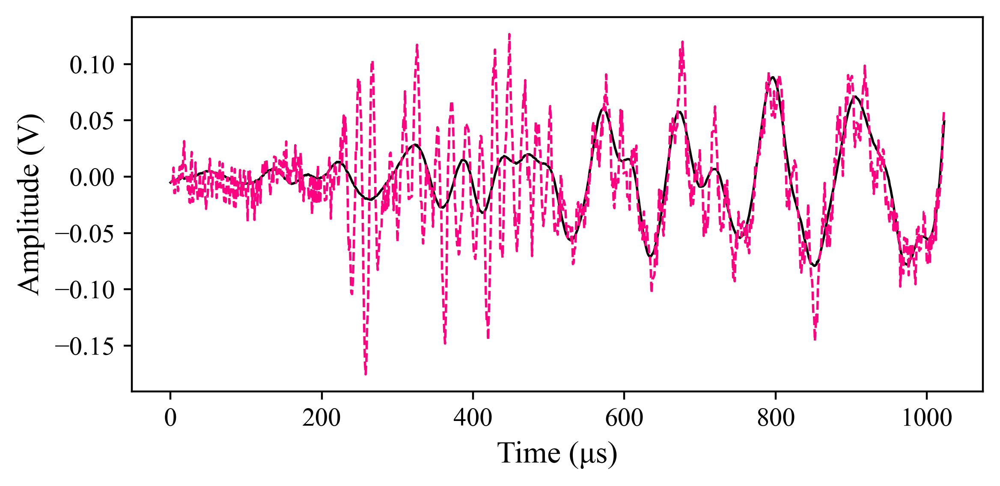

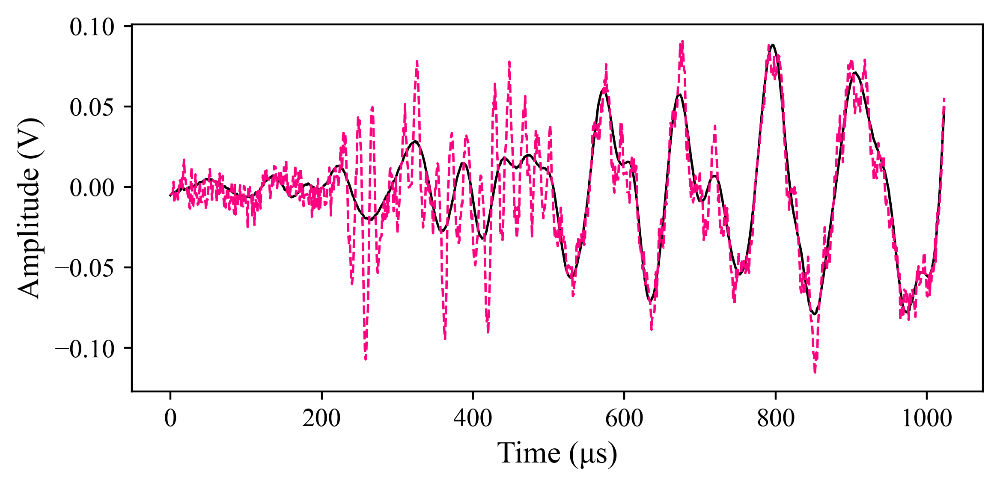

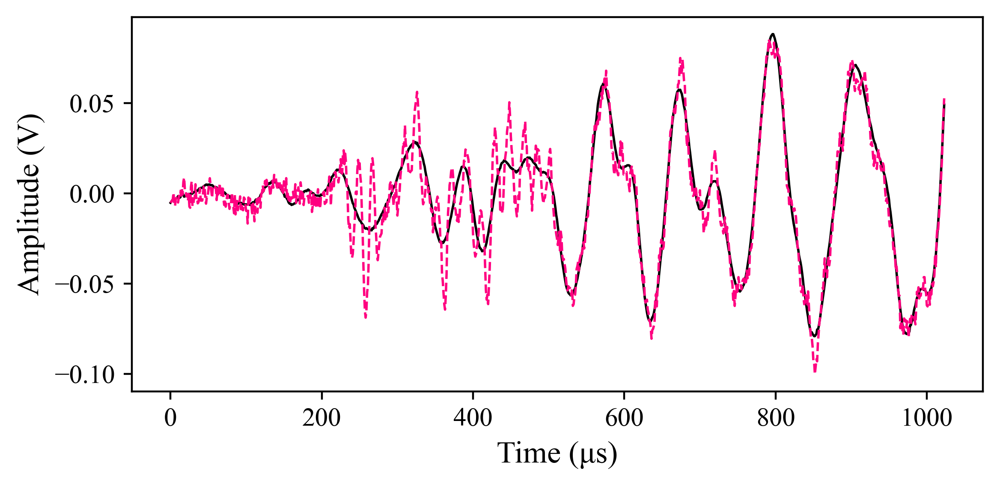

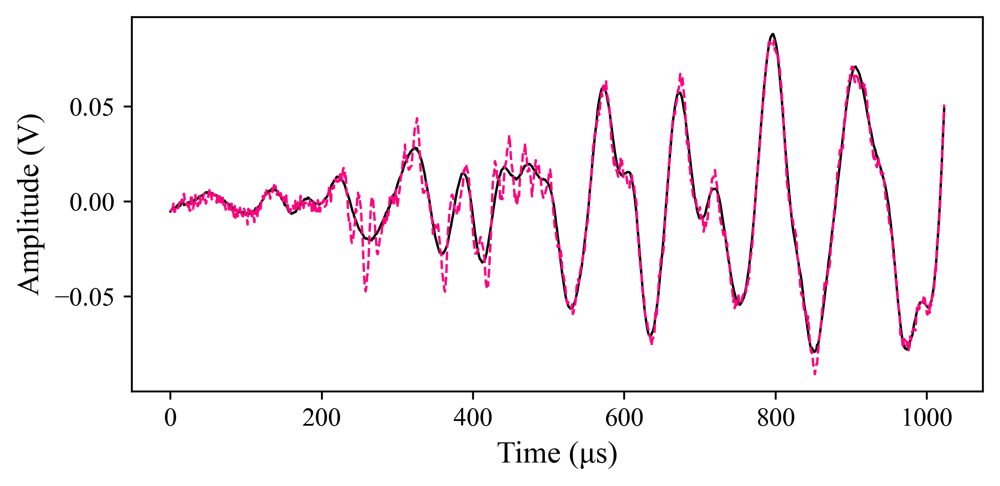

In [25]:
import numpy as np
import matplotlib.pyplot as plt

# === 加载数据 ===
clean = np.load('C:/localization/X_test.npy')
c_0db  = np.load('C:/localization/x_test_0dB.npy')
c_5db  = np.load('C:/localization/x_test_5dB.npy')
c_10db = np.load('C:/localization/x_test_10dB.npy')
c_15db = np.load('C:/localization/x_test_15dB.npy')

# === 选择一个样本 ===
idx = np.random.randint(clean.shape[0])

# === 标签与数据 ===
snr_labels = ['0 dB', '5 dB', '10 dB', '15 dB']
contaminated_sets = [c_0db, c_5db, c_10db, c_15db]

plt.rcParams['font.family'] = 'Times New Roman'

# 高对比度玫红色
magenta_color = '#FF0080'  # 非常高对比度！

# === 分别绘图 ===
for i in range(4):
    plt.figure(figsize=(6, 3), dpi=400)
    plt.plot(clean[idx], color='black', linewidth=1, linestyle='-')
    plt.plot(contaminated_sets[i][idx], color=magenta_color, linewidth=1, linestyle='--')
    
    plt.xlabel("Time (μs)", fontsize=13)
    plt.ylabel("Amplitude (V)", fontsize=13)
    plt.tick_params(labelsize=11)
    plt.grid(False)
    plt.tight_layout()
    plt.show()


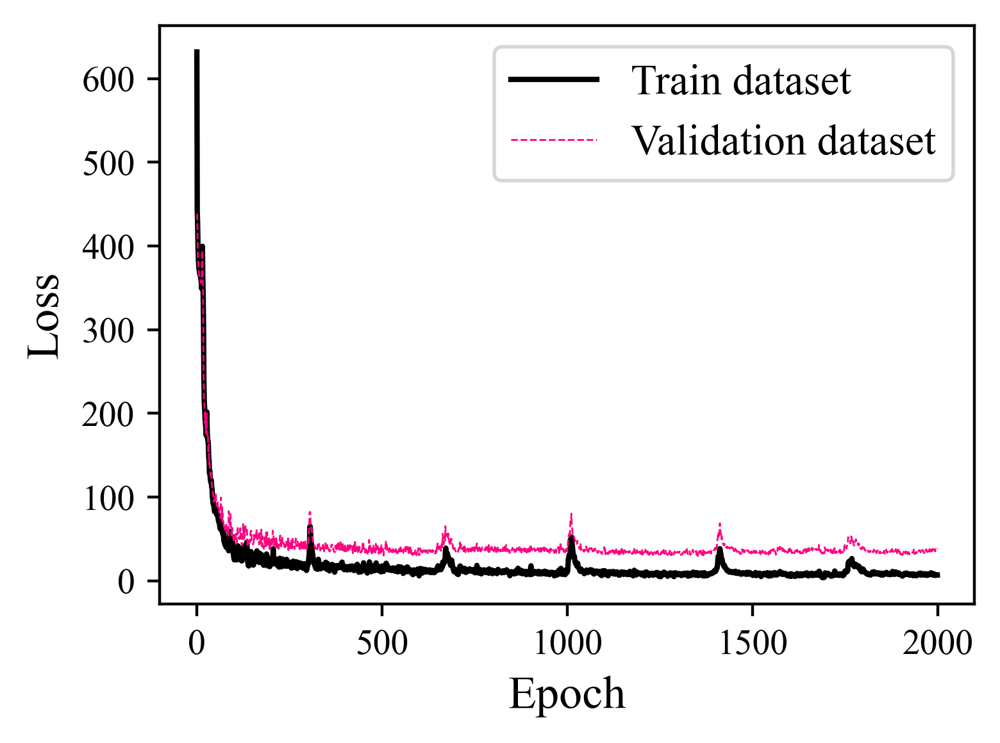

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# 设置全局字体为 Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

# 读取数据
df = pd.read_csv(r'C:\localization\train_history.csv')


# 画 loss 曲线
plt.figure(figsize=(4,3), dpi=400)
plt.plot(df['loss'], label='Train dataset', color='black', linewidth=1.5)
plt.plot(df['val_loss'], label='Validation dataset', color='#FF0080', linewidth=0.5, linestyle='--')
plt.xlabel('Epoch', fontsize=13)
plt.ylabel('Loss', fontsize=13)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


In [1]:
import numpy as np
from tensorflow.keras.models import load_model

# 定义模型路径和测试数据路径
model_path = 'C:/localization/denoise_0dB.h5'
x_test = np.load('C:/localization/x_test_0dB.npy')

# 添加通道维度（如果还没有）

# 加载模型
denoise_model = load_model(model_path)

# 预测去噪结果
y_pred = denoise_model.predict(x_test, batch_size=2000)


y_test = np.load('C:/localization/X_test.npy')
y_pred = y_pred.squeeze()


def compute_snr(clean, denoised):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean((clean - denoised) ** 2)
    if noise_power == 0:
        return np.inf
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

snr_value = compute_snr(y_test, y_pred)
print(f"Test SNR: {snr_value:.2f} dB")


Test SNR: 11.70 dB


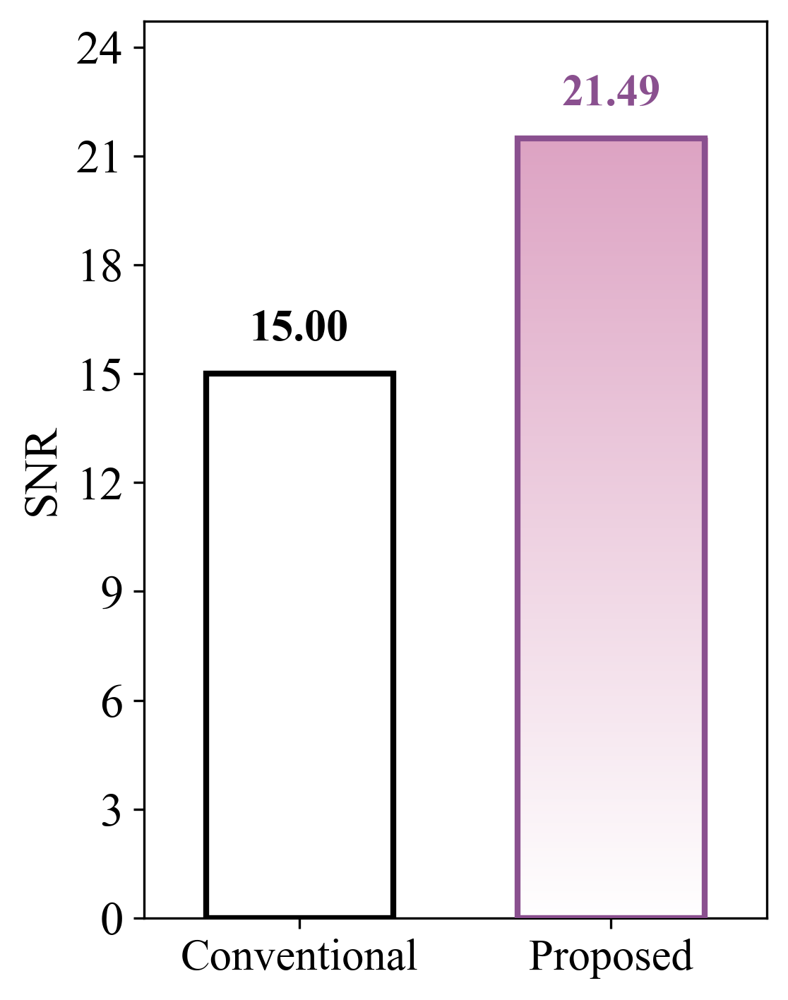

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
import os
matplotlib.rcParams['font.family'] = 'Times New Roman'
matplotlib.rcParams['font.size'] = 16

means = [15, 21.49]   
labels =['Conventional', 'Proposed']
x = np.arange(len(labels))

fig, ax = plt.subplots(figsize=(4, 5), dpi=300)

# 只显示整数y轴
ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))

# 先画 Un-denoised 白色柱子
bars = ax.bar(x[0], means[0], width=0.6, color='white', edgecolor='black', linewidth=2, zorder=3)

# 再画 Denoised 渐变柱子
from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list("my_cmap", ['#dda3c3', 'white'])
delta = 0.01
x1 = x[1]
bar_width = 0.6
height = means[1]
x0 = x1 - bar_width/2
if height > 0:
    im = ax.imshow(
        np.linspace(0,1,256).reshape(-1,1),
        extent=[x0-delta, x0+bar_width+delta, 0, height],
        aspect='auto',
        cmap=cmap,
        alpha=1,
        zorder=2
    )
rect = plt.Rectangle((x0, 0), bar_width, height, 
                    edgecolor='#8a508f', facecolor='none', 
                    linewidth=2, zorder=3)
ax.add_patch(rect)

number_colors = ['black', '#8a508f']
for i, mean in enumerate(means):
    bar_center = x[i]
    bar_top = mean
    ax.text(bar_center, bar_top + max(means)*0.03, f"{mean:.2f}",
            ha='center', va='bottom', fontsize=15, color=number_colors[i], fontweight='bold')

plt.ylim(0, max(means)*1.15)
plt.xlim(-0.5, 1.5)
plt.xticks(x, labels, fontsize=15)
plt.ylabel('SNR', fontsize=16)
plt.tight_layout()
plt.show()


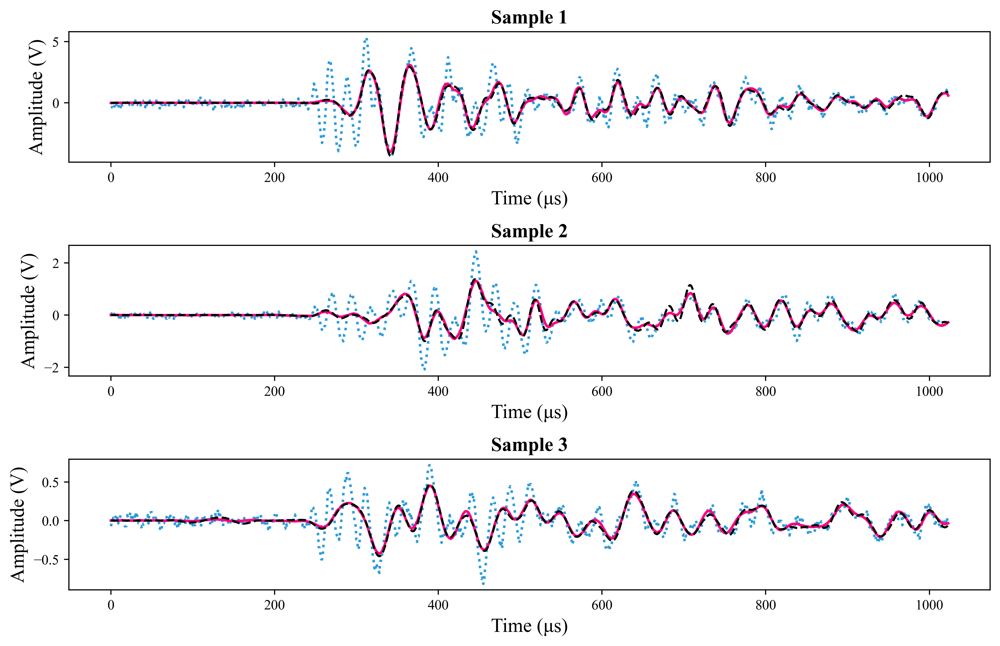

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# === 随机选择 3 个样本索引 ===
indices = np.random.choice(x_test.shape[0], 3, replace=False)

plt.rcParams['font.family'] = 'Times New Roman'
fig, axes = plt.subplots(3, 1, figsize=(10, 6.5), dpi=500)
fig.subplots_adjust(hspace=0.5)

for i, idx in enumerate(indices):
    ax = axes[i]

    input_signal = x_test[idx].squeeze()
    output_signal = y_pred[idx].squeeze()
    target_signal = y_test[idx].squeeze()

    # 设定高对比度配色，并让其中两条虚线
    ax.plot(input_signal, color='#2D9CDB', linewidth=1.8, linestyle=':')     # 蓝色虚线
    ax.plot(output_signal, color='#FF0080', linewidth=1.8, linestyle='-')     # 玫红实线
    ax.plot(target_signal, color='black', linewidth=1.5, linestyle='--')      # 黑色虚线

    ax.set_title(f"Sample {i+1}", fontsize=14, fontweight='bold')
    ax.set_xlabel("Time (μs)", fontsize=14)
    ax.set_ylabel("Amplitude (V)", fontsize=14)
    ax.grid(False)
    # 不需要legend

plt.tight_layout()
plt.show()


新测试集样本的平均欧氏距离: 52.1741


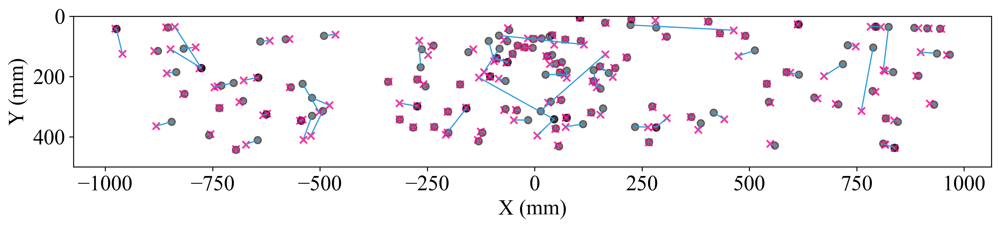

In [93]:
import numpy as np
import os
from tensorflow.keras.models import load_model

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')

denoise_model = load_model('C:/localization/denoise_0dB.h5')

X_test = denoise_model.predict(new_X_test, batch_size=2000)



# 预测
y_pred = best_model.predict(X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")

# ... 之前部分保持不变 ...


# 1. 选出误差<=75的索引
valid_idx = np.where(distances <= 400)[0]

# 2. 从这些索引里随机抽100个
np.random.seed(12)
if len(valid_idx) >= 200:
    idx = np.random.choice(valid_idx, 150, replace=False)
else:
    idx = valid_idx  # 如果剩下不足100个，就全选

import matplotlib.pyplot as plt
import numpy as np

# ... 之前数据处理部分保持不变 ...

plt.figure(figsize=(12,3), dpi=300)
plt.scatter(y_test[idx,0], y_test[idx,1], c='black', marker='o', alpha=0.5)
plt.scatter(y_pred[idx,0], y_pred[idx,1], c='#FF0080', marker='x', alpha=0.8)

for i in idx:
    plt.plot([y_test[i,0], y_pred[i,0]], [y_test[i,1], y_pred[i,1]], c='#2D9CDB', lw=1)

plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.ylim(0, 500)
plt.gca().invert_yaxis()   # 反转y轴方向
plt.tight_layout()
plt.show()





新测试集样本的平均欧氏距离: 94.6697


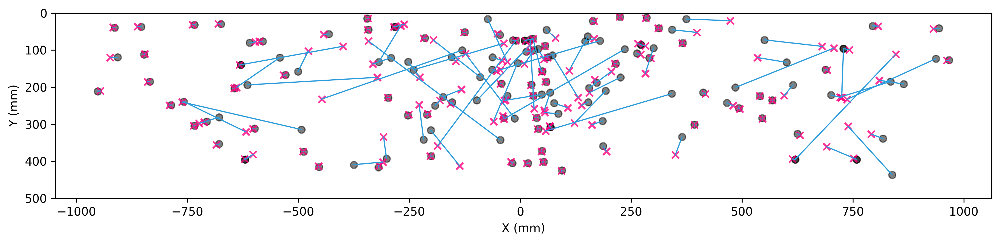

In [2]:
import numpy as np
import os
from tensorflow.keras.models import load_model

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')

denoise_model = load_model('C:/localization/denoise_0dB.h5')

X_test = new_X_test



# 预测
y_pred = best_model.predict(X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))


mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")

# ... 之前部分保持不变 ...


# 1. 选出误差<=75的索引
valid_idx = np.where(distances <= 400)[0]

# 2. 从这些索引里随机抽100个
np.random.seed(12)
if len(valid_idx) >= 200:
    idx = np.random.choice(valid_idx, 150, replace=False)
else:
    idx = valid_idx  # 如果剩下不足100个，就全选

import matplotlib.pyplot as plt
import numpy as np

# ... 之前数据处理部分保持不变 ...

plt.figure(figsize=(12,3), dpi=300)
plt.scatter(y_test[idx,0], y_test[idx,1], c='black', marker='o', alpha=0.5)
plt.scatter(y_pred[idx,0], y_pred[idx,1], c='#FF0080', marker='x', alpha=0.8)

for i in idx:
    plt.plot([y_test[i,0], y_pred[i,0]], [y_test[i,1], y_pred[i,1]], c='#2D9CDB', lw=1)

plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.ylim(0, 500)
plt.gca().invert_yaxis()   # 反转y轴方向
plt.tight_layout()
plt.show()





In [ ]:
import numpy as np
import os

# === 路径 ===
clean_path = 'C:/localization/X_test.npy'
noise_path = 'D:/wangshuo/zaoyinshaozhou.npy'
save_dir = 'C:/localization'

# === 加载数据 ===
clean_data = np.load(clean_path)  # shape: (N, L)
noise_data = np.load(noise_path)  # shape: (M, L)
assert clean_data.shape[1] == noise_data.shape[1], "信号长度不一致！"

# === 添加噪声函数（按指定 SNR）===
def add_noise_with_snr(clean, noise, snr_db):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean(noise ** 2)
    if noise_power == 0:
        return clean  # 避免除以 0
    factor = np.sqrt(signal_power / (noise_power * 10 ** (snr_db / 10)))
    return clean + noise * factor

# === SNR 级别 ===
snr_levels = [0, 5, 10, 15]
contaminated_sets = {snr: [] for snr in snr_levels}

# === 逐条处理 ===
num_clean = clean_data.shape[0]
for i in range(num_clean):
    clean = clean_data[i]
    noise = noise_data[np.random.randint(noise_data.shape[0])]  # 随机选噪声

    for snr in snr_levels:
        contaminated = add_noise_with_snr(clean, noise, snr)
        contaminated_sets[snr].append(contaminated)

# === 保存 ===
for snr, signals in contaminated_sets.items():
    arr = np.array(signals)
    save_path = os.path.join(save_dir, f'x_train_{snr}dB.npy')
    np.save(save_path, arr)
    print(f"Saved: {save_path}, shape: {arr.shape}")
    
    
    


In [9]:
import numpy as np
from tensorflow.keras.models import load_model

# 定义模型路径和测试数据路径
model_path = 'C:/localization/denoise_0dB.h5'
x_test = np.load('C:/localization/x_test_0dB.npy')

# 加载模型
denoise_model = load_model(model_path)

# 预测去噪结果
y_pred = denoise_model.predict(x_test, batch_size=2000)

y_test = np.load('C:/localization/X_test.npy')
y_pred = y_pred.squeeze()

def compute_snr(clean, denoised):
    """
    批量计算每个信号的SNR。
    clean, denoised: shape (N, T)
    返回 shape (N,) 的 SNR 数组
    """
    signal_power = np.mean(clean ** 2, axis=1)
    noise_power = np.mean((clean - denoised) ** 2, axis=1)
    snr = np.where(noise_power == 0, np.inf, 10 * np.log10(signal_power / noise_power))
    return snr

# 如果数据是一维（单个信号），变成二维
if y_test.ndim == 1:
    y_test = y_test[None, :]
    y_pred = y_pred[None, :]

snr_values = compute_snr(y_test, y_pred)
print(f"Test SNR (mean): {snr_values.mean():.2f} dB")
print(f"SNR for each signal (dB):\n{snr_values}")

def compute_mae(clean, denoised):
    """
    批量计算每个信号的 MAE。
    clean, denoised: shape (N, T)
    返回 shape (N,) 的 MAE 数组
    """
    return np.mean(np.abs(clean - denoised), axis=1)

mae_values = compute_mae(y_test, y_pred)
print(f"Test MAE (mean): {mae_values.mean():.4f}")
print(f"MAE for each signal:\n{mae_values}")



Test SNR (mean): 13.33 dB
SNR for each signal (dB):
[15.581092 12.676991 18.549185 ... 15.480184  9.831278 11.39554 ]
Test MAE (mean): 0.0402
MAE for each signal:
[0.02471111 0.0891267  0.02409854 ... 0.03635569 0.18073699 0.09621102]


In [7]:
mae=
print(distances.shape)
print(snr_values.shape)

(2295,)
(2295,)


SNR=0 dB:
  Repeat 1: Mean error = 101.09 mm
  Repeat 2: Mean error = 98.84 mm
  Repeat 3: Mean error = 95.87 mm
  Repeat 4: Mean error = 92.48 mm
  Repeat 5: Mean error = 95.58 mm
  Repeat 6: Mean error = 96.12 mm
  Repeat 7: Mean error = 101.63 mm
  Repeat 8: Mean error = 97.90 mm
  Repeat 9: Mean error = 92.31 mm
  Repeat 10: Mean error = 89.68 mm
SNR=1 dB:
  Repeat 1: Mean error = 85.50 mm
  Repeat 2: Mean error = 77.40 mm
  Repeat 3: Mean error = 89.09 mm
  Repeat 4: Mean error = 84.70 mm
  Repeat 5: Mean error = 85.83 mm
  Repeat 6: Mean error = 83.60 mm
  Repeat 7: Mean error = 86.88 mm
  Repeat 8: Mean error = 79.94 mm
  Repeat 9: Mean error = 79.62 mm
  Repeat 10: Mean error = 84.82 mm
SNR=2 dB:
  Repeat 1: Mean error = 75.72 mm
  Repeat 2: Mean error = 72.45 mm
  Repeat 3: Mean error = 75.95 mm
  Repeat 4: Mean error = 71.30 mm
  Repeat 5: Mean error = 79.29 mm
  Repeat 6: Mean error = 73.19 mm
  Repeat 7: Mean error = 77.61 mm
  Repeat 8: Mean error = 76.32 mm
  Repeat 9: Me

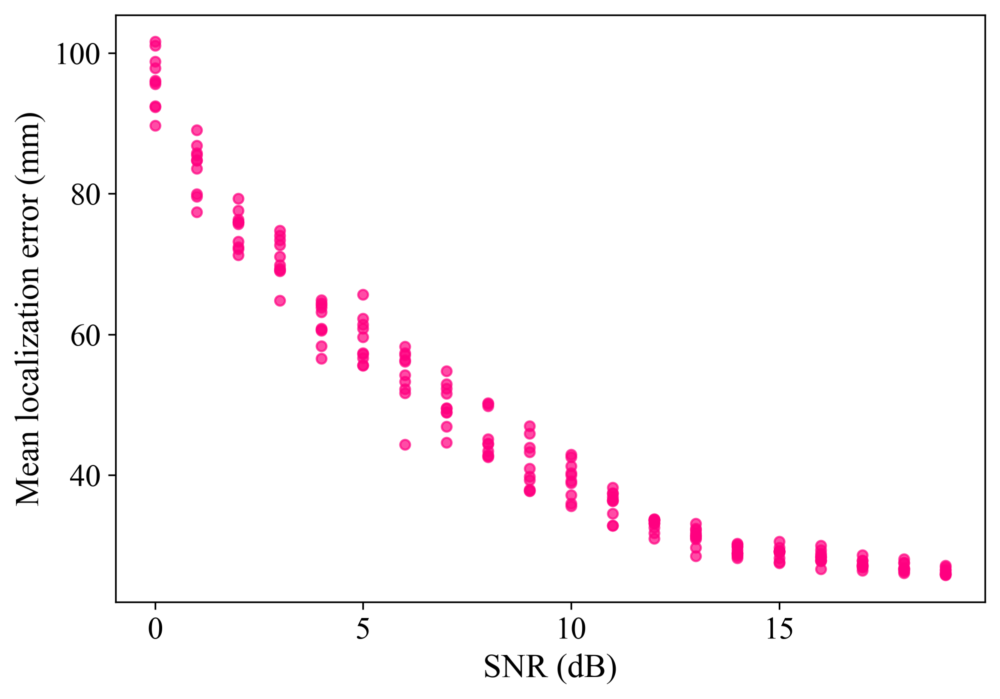

In [16]:
import numpy as np
import os
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# === 路径 ===
clean_path = 'C:/localization/X_test.npy'
noise_path = 'D:/wangshuo/zaoyinshaozhou.npy'

# === 加载数据 ===
clean_data = np.load(clean_path)  # shape: (N, L)
noise_data = np.load(noise_path)  # shape: (M, L)
y_test = np.load('C:/localization/y_test.npy').astype('float32')  # shape: (N, 2)

def euclidean_distance_loss(y_true, y_pred):
    return np.mean(np.linalg.norm(y_true - y_pred, axis=-1))

best_model = load_model('C:/localization/best_model4.h5', custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

snr_levels = list(range(0, 20))  # 0~24
num_repeat = 10  # 每个SNR重复次数

all_snr = []
all_distances = []

for snr in snr_levels:
    print(f"SNR={snr} dB:")
    for rep in range(num_repeat):
        contaminated_signals = []
        for i in range(clean_data.shape[0]):
            clean = clean_data[i]
            noise = noise_data[np.random.randint(noise_data.shape[0])]
            signal_power = np.mean(clean ** 2)
            noise_power = np.mean(noise ** 2)
            factor = np.sqrt(signal_power / (noise_power * 10 ** (snr / 10))) if noise_power != 0 else 0
            contaminated = clean + noise * factor
            contaminated_signals.append(contaminated)
        x_test = np.array(contaminated_signals).astype('float32')
        if x_test.ndim == 2:
            x_test = x_test[..., np.newaxis]
        x_denoised = x_test
        x_denoised = x_denoised.squeeze()
        y_pred = best_model.predict(x_denoised)
        distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
        mean_dist = np.mean(distances)
        all_snr.append(snr)
        all_distances.append(mean_dist)
        print(f"  Repeat {rep+1}: Mean error = {mean_dist:.2f} mm")

# 画所有散点
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 18

plt.figure(figsize=(7,5), dpi=300)
plt.scatter(all_snr, all_distances, color='#FF0080', s=22, alpha=0.7)
plt.xlabel('SNR (dB)', fontsize=16)
plt.ylabel('Mean localization error (mm)', fontsize=16)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.tight_layout()
plt.show()


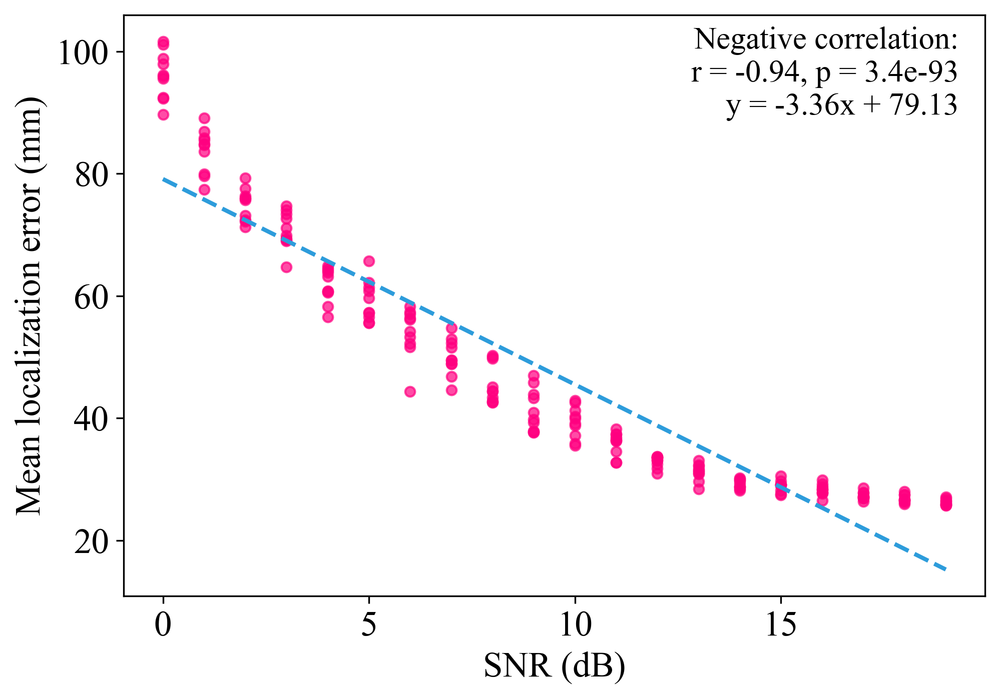

In [17]:
import numpy as np
from scipy.stats import pearsonr
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# 你的 all_snr 和 all_distances 已经准备好
all_snr = np.array(all_snr)
all_distances = np.array(all_distances)

# 拟合线性关系
def linear(x, a, b):
    return a * x + b
popt, _ = curve_fit(linear, all_snr, all_distances)
x_fit = np.linspace(all_snr.min(), all_snr.max(), 200)
y_fit = linear(x_fit, *popt)

# 相关性
corr, pval = pearsonr(all_snr, all_distances)
direction = "positive" if corr > 0 else "negative"

# 画图
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 18

plt.figure(figsize=(7,5), dpi=300)
plt.scatter(all_snr, all_distances, color='#FF0080', s=22, alpha=0.7, label='Mean errors')
plt.plot(x_fit, y_fit, color='#2D9CDB', linestyle='--', linewidth=2, label='Linear fit')

plt.xlabel('SNR (dB)', fontsize=17)
plt.ylabel('Mean localization error (mm)', fontsize=17)
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)

# 标注相关性系数和正/负相关a
plt.text(0.97, 0.98, 
         f"{direction.capitalize()} correlation:\n"
         f"r = {corr:.2f}, p = {pval:.1e}\n"
         f"y = {popt[0]:.2f}x + {popt[1]:.2f}", 
         ha='right', va='top',
         fontsize=15,
         transform=plt.gca().transAxes,
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.75))

plt.tight_layout()
plt.show()


新测试集样本的平均欧氏距离: 52.1765
所有标签到原点的平均距离: 439.1176
标签到原点的距离与误差的皮尔逊相关系数: r=0.130


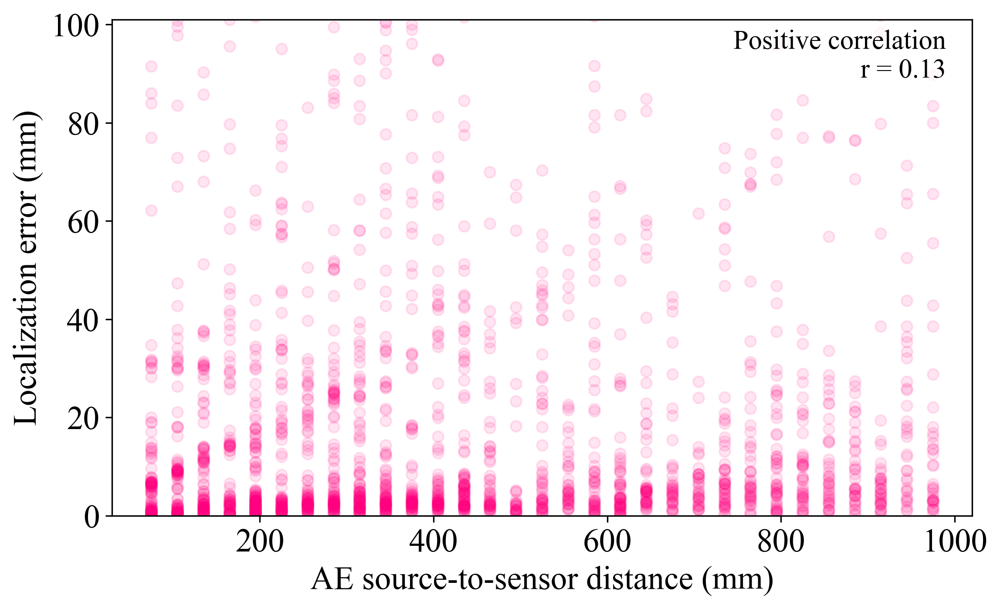

In [21]:
import numpy as np
import os
from tensorflow.keras.models import load_model
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')
denoise_model = load_model('C:/localization/denoise_0dB.h5')
X_test = denoise_model.predict(new_X_test, batch_size=2000)

# 预测
y_pred = best_model.predict(X_test)  # shape: (num_samples, 2)

# 真实标签
y_test = np.load('C:/localization/y_test.npy').astype('float32')

# 误差
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")

# 计算 y_test 到原点的距离
origin = np.array([0, 0])
origin_distances = np.sqrt(np.sum((y_test - origin) ** 2, axis=1))
mean_origin_distance = np.mean(origin_distances)
print(f"所有标签到原点的平均距离: {mean_origin_distance:.4f}")

# 相关性分析
corr, pval = pearsonr(origin_distances, distances)
print(f"标签到原点的距离与误差的皮尔逊相关系数: r={corr:.3f}")
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 18
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5), dpi=300)
plt.scatter(origin_distances, distances, color='#FF0080', alpha=0.1)
plt.xlabel('AE source-to-sensor distance (mm)')
plt.ylabel('Localization error (mm)')
plt.ylim(0, 101)
plt.tight_layout()

# 判断相关性方向
direction = "Positive" if corr > 0 else "Negative"

# 把统计结果放到图内右上角
plt.text(0.97, 0.98, 
         f"{direction} correlation\n"
         f"r = {corr:.2f}",
         ha='right', va='top', fontsize=15,
         transform=plt.gca().transAxes,
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.75)
         )

plt.show()



In [77]:
import numpy as np
import os

# === 路径 ===
clean_path = 'C:/localization/X_val.npy'
noise_path = 'D:/wangshuo/loudi2zaoyin3wave.npy'
save_dir = 'C:/localization'

# === 加载数据 ===
clean_data = np.load(clean_path)  # shape: (N, L)
print(clean_data.shape)
noise_data = np.load(noise_path)  # shape: (M, L)
noise_data = noise_data[:, :1024]
print(noise_data.shape)
assert clean_data.shape[1] == noise_data.shape[1], "信号长度不一致！"

# === 添加噪声函数（按指定 SNR）===
def add_noise_with_snr(clean, noise, snr_db):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean(noise ** 2)
    if noise_power == 0:
        return clean  # 避免除以 0
    factor = np.sqrt(signal_power / (noise_power * 10 ** (snr_db / 10)))
    return clean + noise * factor

# === SNR 级别 ===
snr_levels = [0]
contaminated_sets = {snr: [] for snr in snr_levels}

# === 逐条处理 ===
num_clean = clean_data.shape[0]
for i in range(num_clean):
    clean = clean_data[i]
    noise = noise_data[np.random.randint(noise_data.shape[0])]  # 随机选噪声

    for snr in snr_levels:
        contaminated = add_noise_with_snr(clean, noise, snr)
        contaminated_sets[snr].append(contaminated)

# === 保存 ===
for snr, signals in contaminated_sets.items():
    arr = np.array(signals)
    save_path = os.path.join(save_dir, f'x_val_LOUDI_{snr}dB.npy')
    np.save(save_path, arr)
    print(f"Saved: {save_path}, shape: {arr.shape}")
    
    
    


(2295, 1024)
(6473, 1024)
Saved: C:/localization\x_val_LOUDI_0dB.npy, shape: (2295, 1024)


In [81]:
import numpy as np
from sklearn.model_selection import train_test_split

# === 加载数据 ===
x_train = np.load('C:/localization/x_train_LOUDI_0dB.npy')  # 输入（污染信号）
y_train = np.load('C:/localization/X_train.npy')       # 目标（干净信号）

x_val = np.load('C:/localization/x_val_LOUDI_0dB.npy')  # 输入（污染信号）
y_val = np.load('C:/localization/X_val.npy')
# === 添加通道维度 ===
x_train = x_train[..., np.newaxis]  # (N, 1024, 1)
y_train = y_train[..., np.newaxis]

x_val = x_val[..., np.newaxis]  # (N, 1024, 1)
y_val = y_val[..., np.newaxis]
# === 按 8:1:1 划分 ===

from tensorflow.keras import layers, models

# === 你的 U-Net 构建函数 ===
def conv_block(x, filters, kernel_size=3, activation='relu'):
    x = layers.Conv1D(filters, kernel_size, padding='same')(x)
    x = layers.Activation(activation)(x)
    x = layers.Conv1D(filters, kernel_size, padding='same')(x)
    x = layers.Activation(activation)(x)
    return x

def encoder_block(x, filters):
    x = conv_block(x, filters)
    p = layers.MaxPooling1D(pool_size=2)(x)
    return x, p

def decoder_block(x, skip, filters):
    x = layers.UpSampling1D(size=2)(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x

def build_unet_1d(input_length=1024):
    inputs = layers.Input(shape=(input_length, 1))
    e1, p1 = encoder_block(inputs, 32)
    e2, p2 = encoder_block(p1, 64)
    e3, p3 = encoder_block(p2, 128)
    e4, p4 = encoder_block(p3, 256)
    e5, p5 = encoder_block(p4, 512)
    e6, p6 = encoder_block(p5, 512)
    b = conv_block(p6, 512)
    d6 = decoder_block(b, e6, 512)
    d5 = decoder_block(d6, e5, 256)
    d4 = decoder_block(d5, e4, 128)
    d3 = decoder_block(d4, e3, 64)
    d2 = decoder_block(d3, e2, 32)
    d1 = decoder_block(d2, e1, 32)
    outputs = layers.Conv1D(1, kernel_size=1, activation='linear')(d1)
    return models.Model(inputs=inputs, outputs=outputs)

# 构建模型
model = build_unet_1d(input_length=1024)
model.summary()

from tensorflow.keras.callbacks import EarlyStopping

# === 编译模型 ===
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# === 设置 EarlyStopping（验证集损失连续10轮不提升就停止）===
from tensorflow.keras.callbacks import ModelCheckpoint

# === 设置模型保存路径 ===
checkpoint_path = 'C:/localization/denoise_LOUDI_0dB.h5'

# === 设置只保存 val_loss 最低的模型 ===
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,  # 保存整个模型结构 + 权重
    verbose=1
)

# === 训练固定 100 轮（不使用 early stopping） ===
history = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=100,
    batch_size=2000,
    callbacks=[checkpoint],  # 不再用 EarlyStopping
    verbose=1
)









Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 1024, 1)]    0                                            
__________________________________________________________________________________________________
conv1d_27 (Conv1D)              (None, 1024, 32)     128         input_2[0][0]                    
__________________________________________________________________________________________________
activation_26 (Activation)      (None, 1024, 32)     0           conv1d_27[0][0]                  
__________________________________________________________________________________________________
conv1d_28 (Conv1D)              (None, 1024, 32)     3104        activation_26[0][0]              
____________________________________________________________________________________________

10/10 [==============================] - 9s 382ms/step - loss: 0.0628 - mae: 0.1334 - val_loss: 0.0407 - val_mae: 0.1166

Epoch 00001: val_loss improved from inf to 0.04069, saving model to C:/localization\denoise_LOUDI_0dB.h5
Epoch 2/100
10/10 [==============================] - 3s 339ms/step - loss: 0.0408 - mae: 0.1133 - val_loss: 0.0375 - val_mae: 0.1093

Epoch 00002: val_loss improved from 0.04069 to 0.03754, saving model to C:/localization\denoise_LOUDI_0dB.h5
Epoch 3/100
10/10 [==============================] - 3s 339ms/step - loss: 0.0354 - mae: 0.1049 - val_loss: 0.0300 - val_mae: 0.0973

Epoch 00003: val_loss improved from 0.03754 to 0.03002, saving model to C:/localization\denoise_LOUDI_0dB.h5
Epoch 4/100
10/10 [==============================] - 3s 343ms/step - loss: 0.0318 - mae: 0.1002 - val_loss: 0.0290 - val_mae: 0.0971

Epoch 00004: val_loss improved from 0.03002 to 0.02896, saving model to C:/localization\denoise_LOUDI_0dB.h5
Epoch 5/100
10/10 [=========================

10/10 [==============================] - 3s 341ms/step - loss: 0.0052 - mae: 0.0446 - val_loss: 0.0159 - val_mae: 0.0642

Epoch 00080: val_loss did not improve from 0.01423
Epoch 81/100
10/10 [==============================] - 3s 344ms/step - loss: 0.0051 - mae: 0.0446 - val_loss: 0.0157 - val_mae: 0.0642

Epoch 00081: val_loss did not improve from 0.01423
Epoch 82/100
10/10 [==============================] - 3s 339ms/step - loss: 0.0053 - mae: 0.0450 - val_loss: 0.0151 - val_mae: 0.0633

Epoch 00082: val_loss did not improve from 0.01423
Epoch 83/100
10/10 [==============================] - 3s 340ms/step - loss: 0.0054 - mae: 0.0456 - val_loss: 0.0158 - val_mae: 0.0640

Epoch 00083: val_loss did not improve from 0.01423
Epoch 84/100
10/10 [==============================] - 3s 343ms/step - loss: 0.0050 - mae: 0.0442 - val_loss: 0.0163 - val_mae: 0.0648

Epoch 00084: val_loss did not improve from 0.01423
Epoch 85/100
10/10 [==============================] - 3s 339ms/step - loss: 0.0048 

NameError: name 'pd' is not defined

In [90]:
import numpy as np
from tensorflow.keras.models import load_model

# 定义模型路径和测试数据路径
model_path = 'C:/localization/denoise_LOUDI_0dB.h5'
x_test = np.load('C:/localization/x_test_LOUDI_0dB.npy')

# 加载模型
denoise_model = load_model(model_path)

# 预测去噪结果
y_pred = denoise_model.predict(x_test, batch_size=2000)

y_test = np.load('C:/localization/X_test.npy')
y_pred = y_pred.squeeze()

def compute_snr(clean, denoised):
    """
    批量计算每个信号的SNR。
    clean, denoised: shape (N, T)
    返回 shape (N,) 的 SNR 数组
    """
    signal_power = np.mean(clean ** 2, axis=1)
    noise_power = np.mean((clean - denoised) ** 2, axis=1)
    snr = np.where(noise_power == 0, np.inf, 10 * np.log10(signal_power / noise_power))
    return snr

# 如果数据是一维（单个信号），变成二维
if y_test.ndim == 1:
    y_test = y_test[None, :]
    y_pred = y_pred[None, :]

snr_values = compute_snr(y_test, y_pred)
print(f"Test SNR (mean): {snr_values.mean():.2f} dB")
print(f"SNR for each signal (dB):\n{snr_values}")

def compute_mae(clean, denoised):
    """
    批量计算每个信号的 MAE。
    clean, denoised: shape (N, T)
    返回 shape (N,) 的 MAE 数组
    """
    return np.mean(np.abs(clean - denoised), axis=1)

mae_values = compute_mae(y_test, y_pred)
print(f"Test MAE (mean): {mae_values.mean():.4f}")
print(f"MAE for each signal:\n{mae_values}")



Test SNR (mean): 8.39 dB
SNR for each signal (dB):
[ 8.540348   9.043637   9.861389  ...  7.8278356 14.213947   9.74518  ]
Test MAE (mean): 0.0632
MAE for each signal:
[0.05232816 0.13853717 0.06293117 ... 0.08709104 0.11035204 0.11357094]


Test SNR (mean): 10.44 dB
SNR for each signal (dB):
[11.199633  10.245905  11.092039  ... 11.334418  14.370466  10.6268635]
新测试集样本的平均欧氏距离: 62.5349


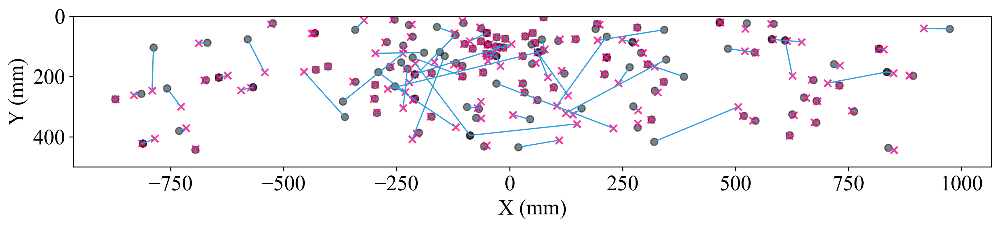

In [159]:
import numpy as np
import os
from tensorflow.keras.models import load_model

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_LOUDI_10dB.npy').astype('float32')

denoise_model = load_model('C:/localization/denoise_LOUDI_0dB.h5')

X_test = denoise_model.predict(new_X_test, batch_size=2000)



Z = np.load('C:/localization/X_test.npy')
D = X_test.squeeze()



snr_values = compute_snr(Z, D)
print(f"Test SNR (mean): {snr_values.mean():.2f} dB")
print(f"SNR for each signal (dB):\n{snr_values}")





# 预测
y_pred = best_model.predict(new_X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")

# ... 之前部分保持不变 ...


# 1. 选出误差<=75的索引
valid_idx = np.where(distances <= 391)[0]

# 2. 从这些索引里随机抽100个
np.random.seed(12)
if len(valid_idx) >= 200:
    idx = np.random.choice(valid_idx, 150, replace=False)
else:
    idx = valid_idx  # 如果剩下不足100个，就全选

import matplotlib.pyplot as plt
import numpy as np

# ... 之前数据处理部分保持不变 ...

plt.figure(figsize=(12,3), dpi=300)
plt.scatter(y_test[idx,0], y_test[idx,1], c='black', marker='o', alpha=0.5)
plt.scatter(y_pred[idx,0], y_pred[idx,1], c='#FF0080', marker='x', alpha=0.8)

for i in idx:
    plt.plot([y_test[i,0], y_pred[i,0]], [y_test[i,1], y_pred[i,1]], c='#2D9CDB', lw=1)

plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.ylim(0, 500)
plt.gca().invert_yaxis()   # 反转y轴方向
plt.tight_layout()
plt.show()





新测试集样本的平均欧氏距离: 27.8730


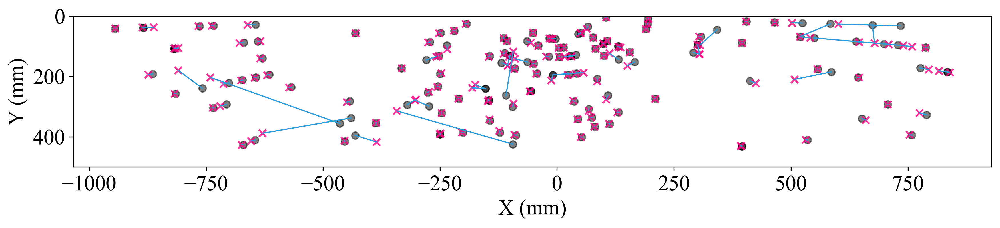

In [148]:
import numpy as np
import os
from tensorflow.keras.models import load_model

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_15dB.npy').astype('float32')

denoise_model = load_model('C:/localization/denoise_15dB.h5')

X_test = denoise_model.predict(new_X_test, batch_size=2000)



# 预测
y_pred = best_model.predict(X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")

# ... 之前部分保持不变 ...


# 1. 选出误差<=75的索引
valid_idx = np.where(distances <= 400)[0]

# 2. 从这些索引里随机抽100个
np.random.seed(12)
if len(valid_idx) >= 200:
    idx = np.random.choice(valid_idx, 150, replace=False)
else:
    idx = valid_idx  # 如果剩下不足100个，就全选

import matplotlib.pyplot as plt
import numpy as np

# ... 之前数据处理部分保持不变 ...

plt.figure(figsize=(12,3), dpi=300)
plt.scatter(y_test[idx,0], y_test[idx,1], c='black', marker='o', alpha=0.5)
plt.scatter(y_pred[idx,0], y_pred[idx,1], c='#FF0080', marker='x', alpha=0.8)

for i in idx:
    plt.plot([y_test[i,0], y_pred[i,0]], [y_test[i,1], y_pred[i,1]], c='#2D9CDB', lw=1)

plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.ylim(0, 500)
plt.gca().invert_yaxis()   # 反转y轴方向
plt.tight_layout()
plt.show()





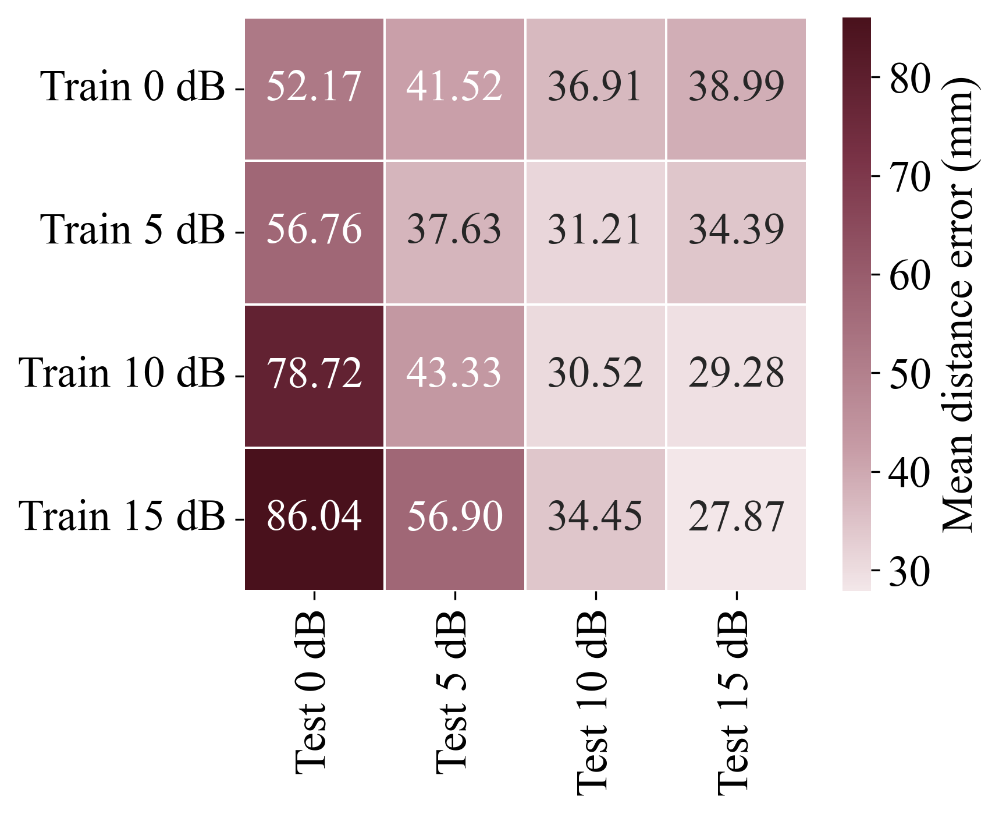

In [125]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# 数据
data = np.array([
    [52.17, 41.52, 36.91,38.99],
    [56.76, 37.63, 31.21, 34.39],
    [78.72, 43.33, 30.52, 29.28],
    [86.04,  56.90, 34.45, 27.87],
])

train_snrs = ['Train 0 dB', 'Train 5 dB', 'Train 10 dB', 'Train 15 dB']
test_snrs = ['Test 0 dB', 'Test 5 dB', 'Test 10 dB', 'Test 15 dB']

# 创建渐变 colormap：由浅到深以 #49111C 为核心色
colors = ['#F3E7E9', '#C69BA5', '#A06776', '#7A3347', '#49111C']
custom_cmap = LinearSegmentedColormap.from_list("custom_49111C", colors)

# 画图
plt.rcParams['font.family'] = 'Times New Roman'
plt.figure(figsize=(6, 5), dpi=300)

ax = sns.heatmap(data, annot=True, fmt=".2f",
                 xticklabels=test_snrs,
                 yticklabels=train_snrs,
                 cmap=custom_cmap,
                 linewidths=0.5,
                 linecolor='white',
                 cbar_kws={'label': 'Mean distance error (mm)'})


plt.tight_layout()
plt.show()


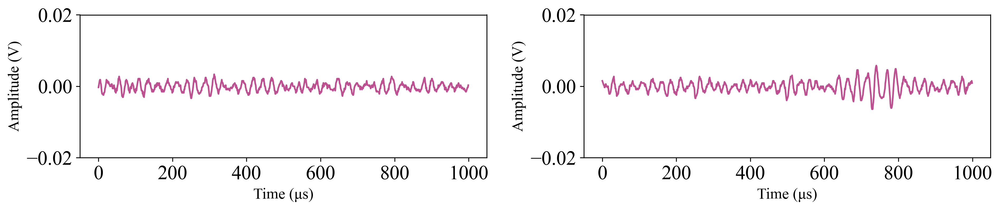

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# === 数据加载 ===
file_path = 'D:/wangshuo/zaoyin/shaozhou_0117_7wave.txt'
data = pd.read_csv(file_path, sep='\t')
data['wave_data'] = data['wave_data'].apply(lambda x: [float(i) for i in x.split()])
waveforms = np.array(data['wave_data'].tolist())

# === 参数设置 ===
sampling_rate = 1024  # Hz
length = waveforms.shape[1]
t = np.linspace(0, 1, length, endpoint=False) * 1000  # 毫秒

plt.rcParams['font.family'] = 'Times New Roman'

signals = [waveforms[0], waveforms[1]]  # 取第1和第2个
titles = ['Sample 1', 'Sample 2']

fig, axes = plt.subplots(1, 2, figsize=(13, 3), dpi=300)
for i, ax in enumerate(axes):
    ax.plot(t, signals[i], color='#bc5090', linewidth=1.5)
    ax.set_xlabel("Time (μs)", fontsize=14)
    ax.set_ylabel("Amplitude (V)", fontsize=14)
    ax.set_ylim(-0.02, 0.02)
    
    ax.grid(False)

plt.tight_layout()
plt.show()


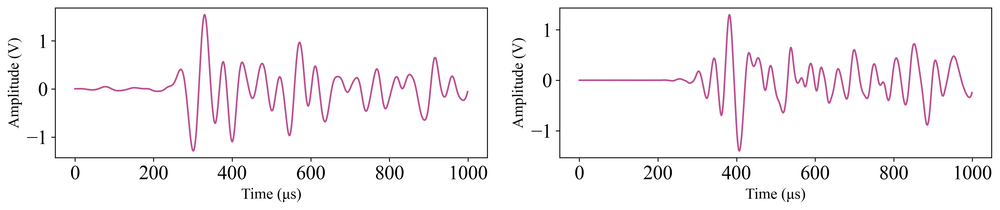

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 18
# === 数据加载 ===
clean_path = 'C:/localization/X_train.npy'
noise_path = 'D:/wangshuo/zaoyinshaozhou.npy'
save_dir = 'C:/localization'

# === 加载数据 ===
clean_data = np.load(clean_path)  # shape: (N, L)
waveforms = clean_data

# === 参数设置 ===
sampling_rate = 1024  # Hz
length = waveforms.shape[1]
t = np.linspace(0, 1, length, endpoint=False) * 1000  # 毫秒

plt.rcParams['font.family'] = 'Times New Roman'

signals = [waveforms[0], waveforms[7]]  # 取第1和第2个
titles = ['Sample 1', 'Sample 2']

fig, axes = plt.subplots(1, 2, figsize=(13, 3), dpi=300)
for i, ax in enumerate(axes):
    ax.plot(t, signals[i], color='#bc5090', linewidth=1.5)
    ax.set_xlabel("Time (μs)", fontsize=14)
    ax.set_ylabel("Amplitude (V)", fontsize=14)
    
    
    ax.grid(False)

plt.tight_layout()
plt.show()


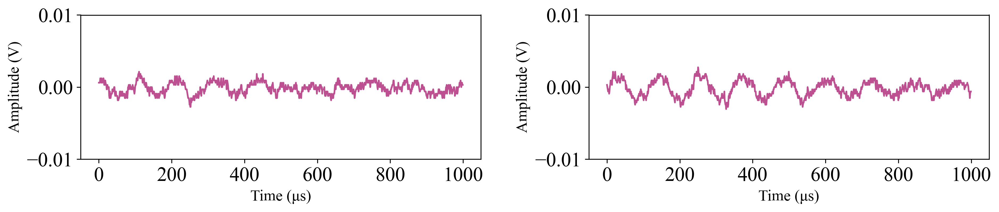

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# === 数据加载 ===
file_path = 'D:/wangshuo/zaoyin/loudi3wave.txt'
data = pd.read_csv(file_path, sep='\t')
data['wave_data'] = data['wave_data'].apply(lambda x: [float(i) for i in x.split()])
waveforms = np.array(data['wave_data'].tolist())
waveforms = waveforms[:, :1024]

sampling_rate = 1024  # Hz
length = waveforms.shape[1]
t = np.linspace(0, 1, length, endpoint=False) * 1000  # 毫秒

plt.rcParams['font.family'] = 'Times New Roman'

signals = [waveforms[43], waveforms[1]]  # 取第1和第2个
titles = ['Sample 1', 'Sample 2']

fig, axes = plt.subplots(1, 2, figsize=(13, 3), dpi=300)
for i, ax in enumerate(axes):
    ax.plot(t, signals[i], color='#bc5090', linewidth=1.5)
    ax.set_xlabel("Time (μs)", fontsize=14)
    ax.set_ylabel("Amplitude (V)", fontsize=14)
    ax.set_ylim(-0.01, 0.01)
    
    ax.grid(False)

plt.tight_layout()
plt.show()

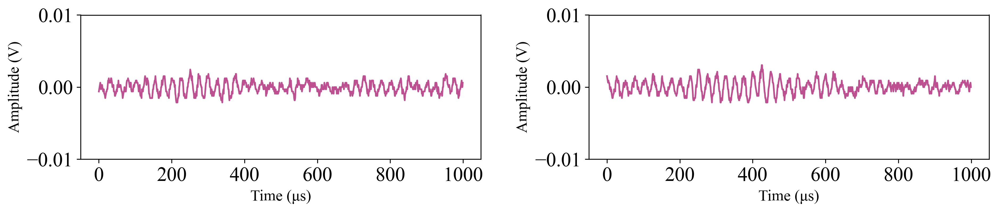

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# === 数据加载 ===
file_path = 'D:/wangshuo/zaoyin/loudi2zaoyin3wave.txt'
data = pd.read_csv(file_path, sep='\t')
data['wave_data'] = data['wave_data'].apply(lambda x: [float(i) for i in x.split()])
waveforms = np.array(data['wave_data'].tolist())
waveforms = waveforms[:, :1024]

sampling_rate = 1024  # Hz
length = waveforms.shape[1]
t = np.linspace(0, 1, length, endpoint=False) * 1000  # 毫秒

plt.rcParams['font.family'] = 'Times New Roman'

signals = [waveforms[0], waveforms[1]]  # 取第1和第2个
titles = ['Sample 1', 'Sample 2']

fig, axes = plt.subplots(1, 2, figsize=(13, 3), dpi=300)
for i, ax in enumerate(axes):
    ax.plot(t, signals[i], color='#bc5090', linewidth=1.5)
    ax.set_xlabel("Time (μs)", fontsize=14)
    ax.set_ylabel("Amplitude (V)", fontsize=14)
    ax.set_ylim(-0.01, 0.01)
    
    ax.grid(False)

plt.tight_layout()
plt.show()

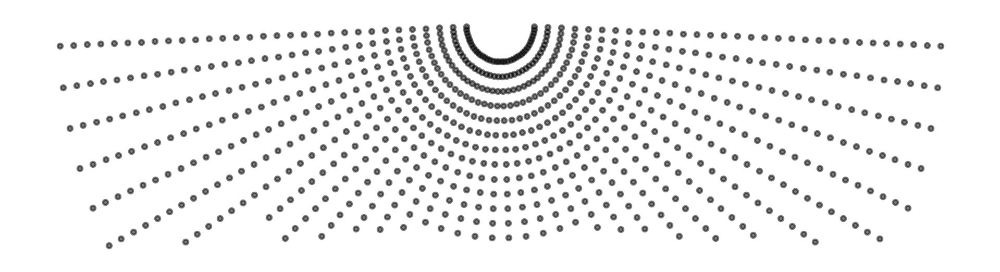

In [36]:
import numpy as np
import os
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Times New Roman'
save_path = r'D:\wangshuo\localization'
labels = np.load(os.path.join(save_path, 'label_XYZ.npy'))

labels_no_col3 = np.delete(labels, 2, axis=1)
labels_unique = np.unique(labels_no_col3, axis=0)

x = labels_unique[:, 0]
y = labels_unique[:, 1]

plt.figure(figsize=(8, 2), dpi=300)
plt.scatter(x, y, s=5, c='black', marker='o', alpha=0.5)

plt.xlabel('X')
plt.ylabel('Y')

# 去掉四周的边框
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# 去掉坐标轴
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.invert_yaxis()
# 去掉网格线
plt.grid(False)

plt.show()


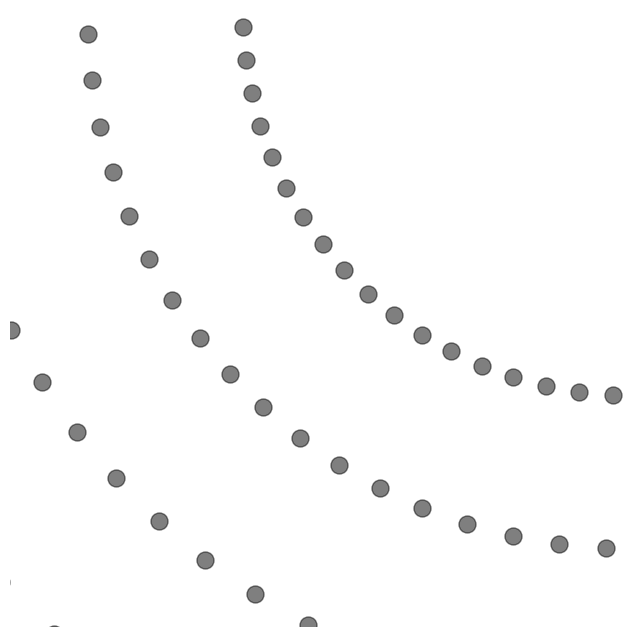

In [42]:
import numpy as np
import os
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Times New Roman'
save_path = r'D:\wangshuo\localization'
labels = np.load(os.path.join(save_path, 'label_XYZ.npy'))

labels_no_col3 = np.delete(labels, 2, axis=1)
labels_unique = np.unique(labels_no_col3, axis=0)

x = labels_unique[:, 0]
y = labels_unique[:, 1]

plt.figure(figsize=(8, 8))
plt.scatter(x, y, s=150, c='black', marker='o',alpha=0.5)

plt.xlabel('X')
plt.ylabel('Y')

# 去掉四周的边框
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# 去掉坐标轴
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

# 去掉网格线
plt.grid(False)
plt.xlim(-120,0)
plt.ylim(0, 120)
ax.invert_yaxis()
plt.show()


In [31]:
import numpy as np
import os
from tensorflow.keras.models import load_model
import matplotlib
matplotlib.rcParams['font.family'] = 'Times New Roman'

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')

denoise_model = load_model('C:/localization/denoise_0dB.h5')

X_test = denoise_model.predict(new_X_test, batch_size=2000)



# 预测
y_pred = best_model.predict(X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")

# ... 之前部分保持不变 ...


y_WAVE_test = np.load('C:/localization/X_test.npy')
X_WAVE_test = X_test.squeeze()



def compute_snr(clean, denoised):
    # clean, denoised: shape = (N, L)
    # 逐个信号计算 SNR
    signal_power = np.mean(clean ** 2, axis=1)        # shape: (N,)
    noise_power = np.mean((clean - denoised) ** 2, axis=1)  # shape: (N,)

    # 避免除以零
    snr = np.where(
        noise_power == 0,
        np.inf,
        10 * np.log10(signal_power / noise_power)
    )  # shape: (N,)

    # 返回每个信号的 SNR 数组
    return snr



snr_value = compute_snr(y_WAVE_test, X_WAVE_test)






新测试集样本的平均欧氏距离: 52.1783


In [32]:
# 分组掩码
large_error_mask = distances > 200
small_error_mask = distances <= 200

# 分别提取索引
large_error_idx = np.where(large_error_mask)[0]
small_error_idx = np.where(small_error_mask)[0]

print(f"误差>200的样本数量: {len(large_error_idx)}")
print(f"误差<=200的样本数量: {len(small_error_idx)}")


误差>200的样本数量: 141
误差<=200的样本数量: 2154


C:\Users\RTX4090D\AppData\Local\Temp\ipykernel_19276\1801515608.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


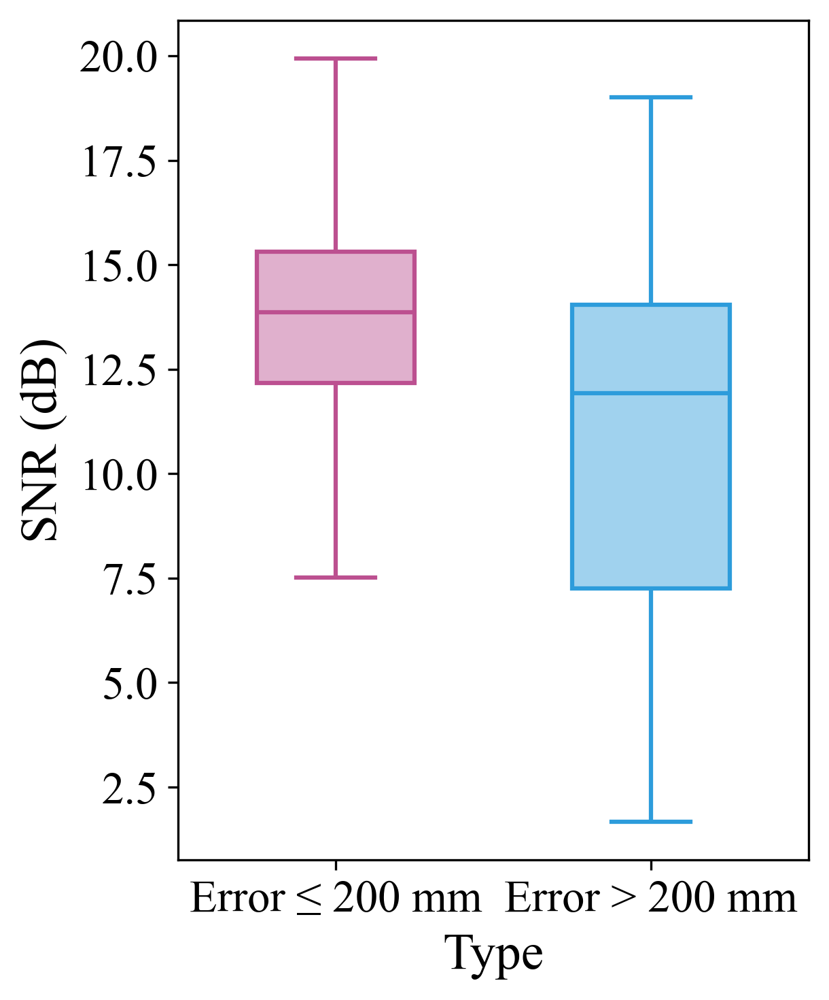

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib
matplotlib.rcParams['font.family'] = 'Times New Roman'

labels = ['Error ≤ 200 mm', 'Error > 200 mm']
box_colors = ['#bc5090', '#2D9CDB']
fill_colors = [(188/255, 80/255, 144/255, 0.45), (45/255, 156/255, 219/255, 0.45)]

# 分组掩码
large_error_mask = distances > 200
small_error_mask = distances <= 200
large_error_idx = np.where(large_error_mask)[0]
small_error_idx = np.where(small_error_mask)[0]

# DataFrame
snr_group = np.concatenate([snr_value[small_error_idx], snr_value[large_error_idx]])
group_labels = ([labels[0]] * len(small_error_idx)) + ([labels[1]] * len(large_error_idx))
df = pd.DataFrame({'SNR (dB)': snr_group, 'Type': group_labels})

plt.figure(figsize=(4, 5), dpi=300)
ax = sns.boxplot(
    x='Type', y='SNR (dB)', data=df,
    showfliers=False, width=0.5,
    linewidth=1.5,
    palette=fill_colors
)

# 重新设置箱体边框和填充色
for i, patch in enumerate(ax.patches):
    patch.set_edgecolor(box_colors[i])
    patch.set_facecolor(fill_colors[i])
    patch.set_linewidth(1.5)

# 动态处理所有可见线（须线、箱线、caps、median），按顺序分配颜色
for i, line in enumerate(ax.lines):
    group = i // 5  # showfliers=False时每组5条
    color = box_colors[group % len(box_colors)]
    line.set_color(color)
    line.set_linewidth(1.5)

ax.set_xlabel('Type', fontsize=18)
ax.set_ylabel('SNR (dB)', fontsize=18)
ax.tick_params(axis='both', labelsize=16)

plt.tight_layout()
plt.savefig('C:/localization/boxplot_snr_error_group_redblue_alpha_final.png', dpi=300)
plt.show()


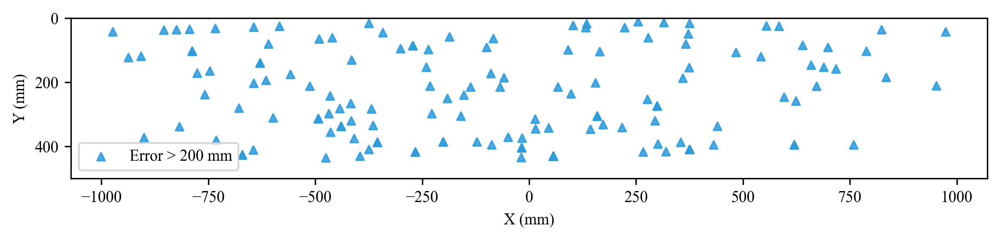

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# 所有大误差点，不去重
large_error_idx = np.where(distances > 200)[0]

plt.figure(figsize=(8, 2), dpi=300)
plt.scatter(
    y_test[large_error_idx, 0], y_test[large_error_idx, 1],
    c='#2D9CDB', marker='^', s=20, alpha=0.85,
    label='Error > 200 mm'
)

plt.xlabel('X (mm)', fontsize=9)
plt.ylabel('Y (mm)', fontsize=9)
plt.ylim(0, 500)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.gca().invert_yaxis()
plt.legend(fontsize=9)
plt.tight_layout()
plt.savefig('C:/localization/source_location_error_group_large_all.png', dpi=300)
plt.show()


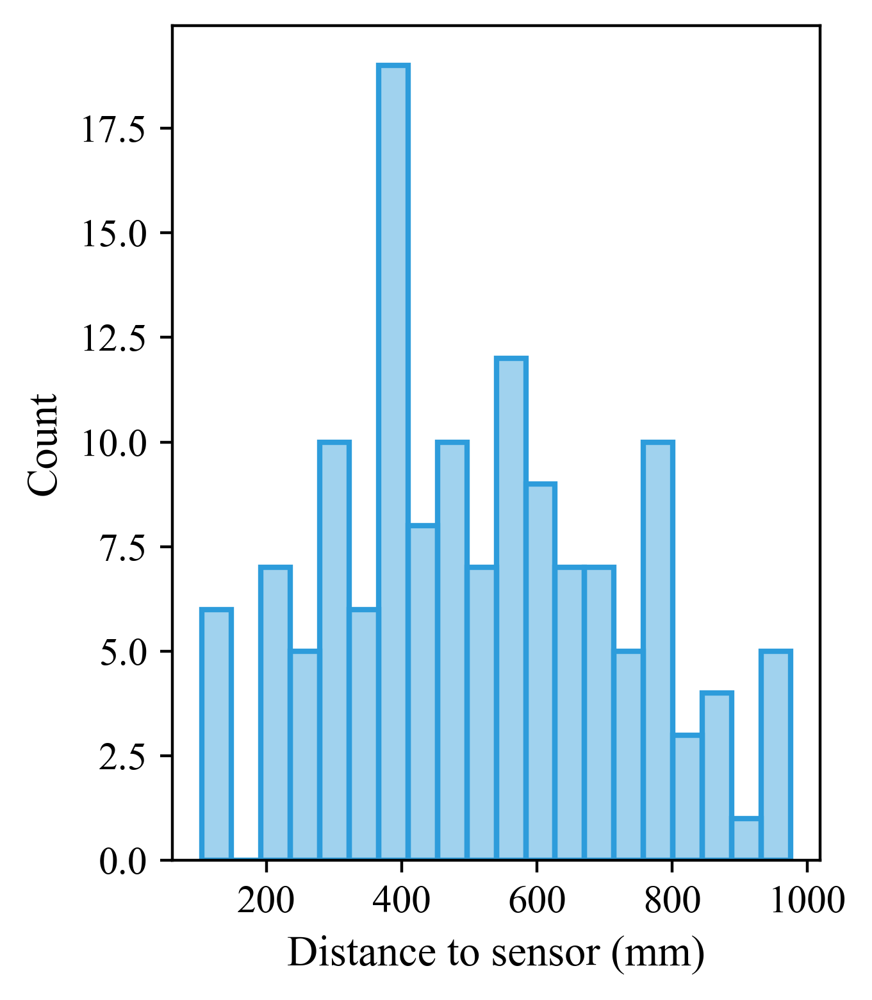

In [44]:
import numpy as np
import matplotlib.pyplot as plt

# 大误差点索引
large_error_idx = np.where(distances > 200)[0]
large_error_coords = y_test[large_error_idx]    # shape=(N, 2)

sensor_xy = np.array([0, 0])
large_error_dist = np.linalg.norm(large_error_coords - sensor_xy, axis=1)

plt.figure(figsize=(3.5,4), dpi=400)
plt.hist(
    large_error_dist, bins=20,
    color=(45/255, 156/255, 219/255, 0.45),    # 填充
    edgecolor='#2D9CDB', linewidth=1.5         # 边框
)
plt.xlabel('Distance to sensor (mm)', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.tight_layout()
plt.show()


C:\Users\RTX4090D\AppData\Local\Temp\ipykernel_15096\520291581.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


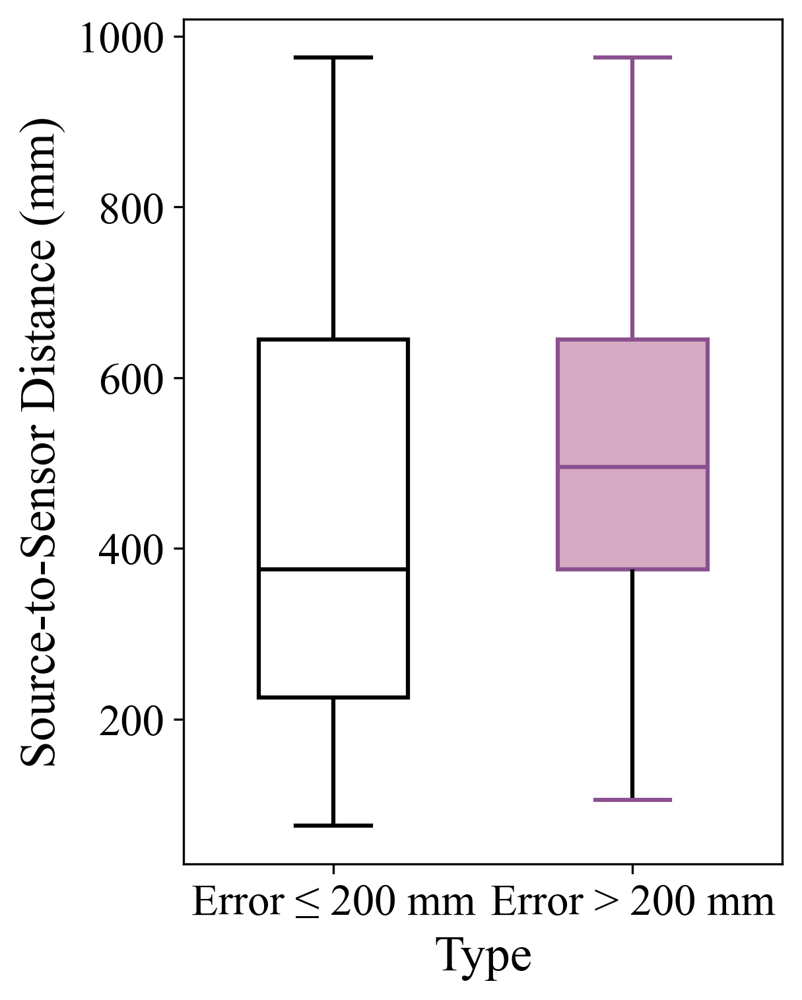

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib
matplotlib.rcParams['font.family'] = 'Times New Roman'

# 分组
labels = ['Error ≤ 200 mm', 'Error > 200 mm']
large_error_idx = np.where(distances > 200)[0]
small_error_idx = np.where(distances <= 200)[0]

# 求到(0,0)的距离
distance_to_sensor = np.linalg.norm(y_test, axis=1)
distance_group = np.concatenate([distance_to_sensor[small_error_idx], distance_to_sensor[large_error_idx]])
group_labels = ([labels[0]] * len(small_error_idx)) + ([labels[1]] * len(large_error_idx))

df = pd.DataFrame({'Source-to-Sensor (mm)': distance_group, 'Type': group_labels})

# 配色
my_palette = {labels[0]: 'white', labels[1]: '#dda3c3'}
box_colors = ['black', '#8a508f']
line_colors = ['black', '#8a508f']

plt.figure(figsize=(4, 5), dpi=300)
ax = sns.boxplot(
    x='Type', y='Source-to-Sensor (mm)', data=df,
    showfliers=False, width=0.5,
    palette=my_palette,
    linewidth=1.5
)

# 设置每个箱子的边框颜色
for patch, color in zip(ax.patches, box_colors):
    patch.set_edgecolor(color)
    patch.set_linewidth(1.5)

# 设置箱线、中位线、须线等的颜色
for i, line in enumerate(ax.lines):
    color = line_colors[i // 6]
    line.set_color(color)
    line.set_linewidth(1.5)

ax.set_xlabel('Type', fontsize=18)
ax.set_ylabel('Source-to-Sensor Distance (mm)', fontsize=18)
ax.tick_params(axis='both', labelsize=16)

plt.tight_layout()
plt.savefig('C:/localization/boxplot_source2sensor_error_group.png', dpi=300)
plt.show()


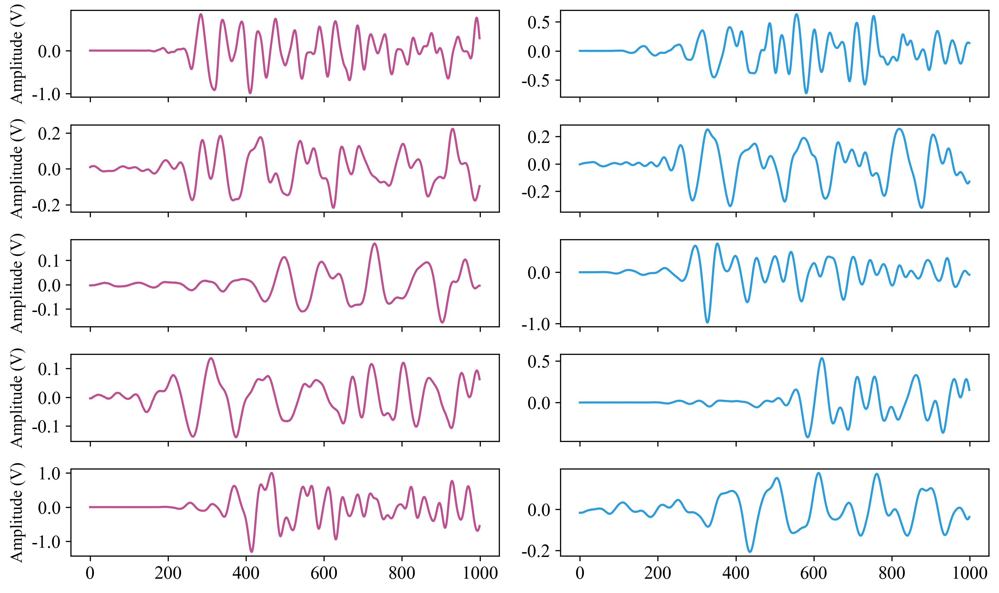

In [86]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
plt.rcParams['font.size'] = 13
plt.rcParams['font.family'] = 'Times New Roman'

# 各抽5个
np.random.seed(42)
sel_small = np.random.choice(small_error_idx, 5, replace=False)
sel_large = np.random.choice(large_error_idx, 5, replace=False)

length = y_WAVE_test.shape[1]
t = np.linspace(0, 1, length, endpoint=False) * 1000  # ms

fig, axes = plt.subplots(5, 2, figsize=(10, 6), dpi=300, sharex=True)  # 不用sharey

for i in range(5):
    # 左列：小误差，紫色
    axes[i, 0].plot(t, y_WAVE_test[sel_small[i]], color='#bc5090', linewidth=1.5)
   
    axes[i, 0].set_ylabel("Amplitude (V)", fontsize=12)
    axes[i, 0].grid(False)
    # 右列：大误差，蓝色
    axes[i, 1].plot(t, y_WAVE_test[sel_large[i]], color='#2D9CDB', linewidth=1.5)
    
    axes[i, 1].grid(False)

# 统一X轴标签
for ax in axes.flat:
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

plt.tight_layout()
plt.savefig('C:/localization/waveform_compare_grid.png', dpi=300)
plt.show()


C:\conda\envs\tensorflow\lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


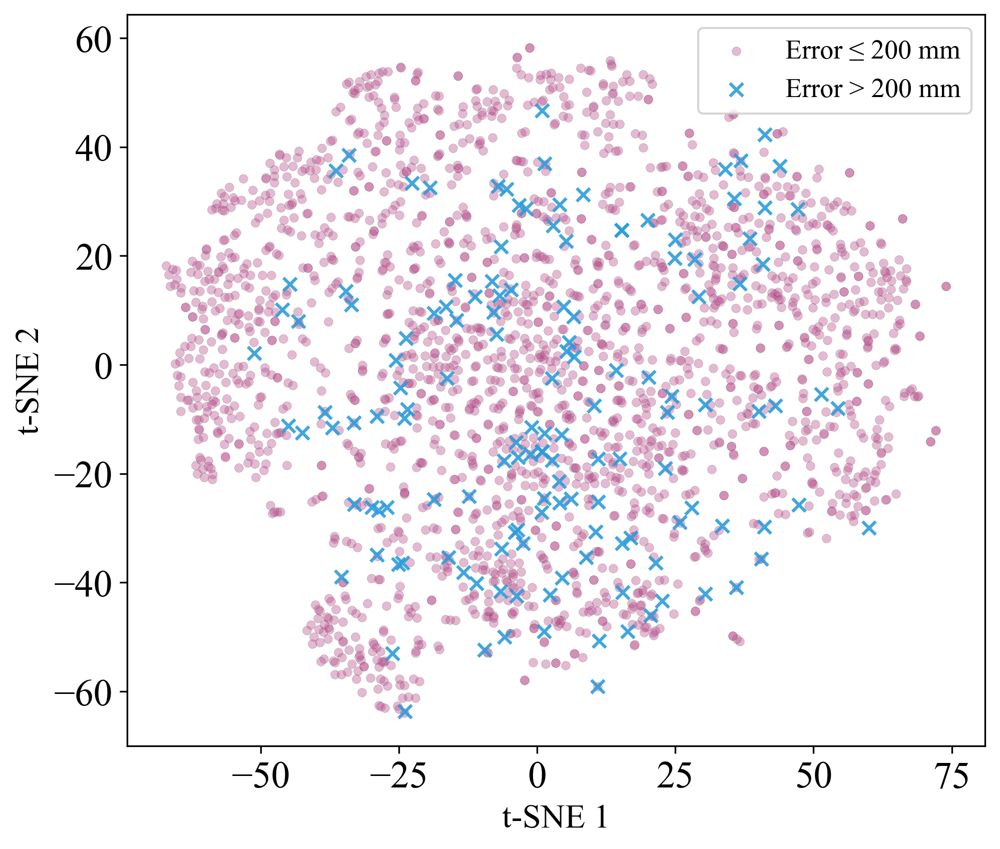

In [89]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

plt.rcParams['font.size'] = 18
plt.rcParams['font.family'] = 'Times New Roman'

# X: (N, L) 波形矩阵
X = y_WAVE_test  # shape: (num_samples, 1024)

# t-SNE降到二维
tsne = TSNE(n_components=2, random_state=0, perplexity=30, n_iter=1500)
X_embedded = tsne.fit_transform(X)

# 分组
large_error_idx = np.where(distances > 200)[0]
small_error_idx = np.where(distances <= 200)[0]

plt.figure(figsize=(7,6), dpi=300)
plt.scatter(
    X_embedded[small_error_idx, 0], X_embedded[small_error_idx, 1],
    c='#bc5090', marker='o', alpha=0.4, label='Error ≤ 200 mm', s=18, edgecolor='k', linewidth=0.1
)
plt.scatter(
    X_embedded[large_error_idx, 0], X_embedded[large_error_idx, 1],
    c='#2D9CDB', marker='x', alpha=0.9, label='Error > 200 mm', s=40
)
plt.xlabel('t-SNE 1', fontsize=16)
plt.ylabel('t-SNE 2', fontsize=16)
plt.legend(fontsize=13)
plt.tight_layout()
plt.savefig('C:/localization/tsne_error_group.png', dpi=300)
plt.show()


In [15]:
import numpy as np
import os
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

# 加载数据
save_path = r'C:\localization'
waveforms = np.load(os.path.join(save_path, 'waveforms.npy'), allow_pickle=True)
labels = np.load(os.path.join(save_path, 'label_XYZ.npy'))

X = np.stack(waveforms).astype('float32')
y = labels[:, :2].astype('float32')

# 划分：8:1:1
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

print("训练集:", X_train.shape)
print("验证集:", X_val.shape)
print("测试集:", X_test.shape)

# 建模
inputs = layers.Input(shape=(1024,))

x = layers.Dense(1024, activation='relu')(inputs)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)

x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)

x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(1024, activation='relu')(x)

# x = layers.Dense(1024, activation='relu')(x)
# x = layers.Dense(1024, activation='relu')(x)
# x = layers.Dense(1024, activation='relu')(x)
# x = layers.Dense(1024, activation='relu')(x)
outputs = layers.Dense(2)(x)

model = models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss=euclidean_distance_loss)
model.summary()

# Checkpoint回调
model_path = os.path.join(save_path, 'best_model_OPT.h5')
checkpoint = ModelCheckpoint(
    filepath=model_path,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    mode='min',
    verbose=1
)

# 训练模型
history = model.fit(
    X_train, y_train,
    epochs=2000,
    batch_size=3000,
    validation_data=(X_val, y_val),
    callbacks=[checkpoint]
)

# 训练后加载最佳模型
best_model = load_model(
    model_path, 
    custom_objects={'euclidean_distance_loss': euclidean_distance_loss}
)

# 测试集评估
test_loss = best_model.evaluate(X_test, y_test)
print("测试集欧氏距离均值:", test_loss)



训练集: (18356, 1024)
验证集: (2295, 1024)
测试集: (2295, 1024)
Model: "model_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_15 (InputLayer)        [(None, 1024)]            0         
_________________________________________________________________
dense_119 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
dense_120 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
dense_121 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
dense_122 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
dense_123 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
den

7/7 [==============================] - 0s 15ms/step - loss: 152.6584 - val_loss: 157.3650

Epoch 00029: val_loss improved from 160.76759 to 157.36499, saving model to C:\localization\best_model_OPT.h5
Epoch 30/2000
7/7 [==============================] - 0s 14ms/step - loss: 150.7421 - val_loss: 149.6110

Epoch 00030: val_loss improved from 157.36499 to 149.61098, saving model to C:\localization\best_model_OPT.h5
Epoch 31/2000
7/7 [==============================] - 0s 14ms/step - loss: 136.0408 - val_loss: 136.3567

Epoch 00031: val_loss improved from 149.61098 to 136.35672, saving model to C:\localization\best_model_OPT.h5
Epoch 32/2000
7/7 [==============================] - 0s 15ms/step - loss: 136.3844 - val_loss: 138.2611

Epoch 00032: val_loss did not improve from 136.35672
Epoch 33/2000
7/7 [==============================] - 0s 15ms/step - loss: 121.7243 - val_loss: 122.1333

Epoch 00033: val_loss improved from 136.35672 to 122.13329, saving model to C:\localization\best_model_OPT


Epoch 00124: val_loss did not improve from 43.09504
Epoch 125/2000
7/7 [==============================] - 0s 14ms/step - loss: 22.5535 - val_loss: 40.7653

Epoch 00125: val_loss improved from 43.09504 to 40.76526, saving model to C:\localization\best_model_OPT.h5
Epoch 126/2000
7/7 [==============================] - 0s 15ms/step - loss: 20.7030 - val_loss: 48.3695

Epoch 00126: val_loss did not improve from 40.76526
Epoch 127/2000
7/7 [==============================] - 0s 15ms/step - loss: 25.5603 - val_loss: 51.9798

Epoch 00127: val_loss did not improve from 40.76526
Epoch 128/2000
7/7 [==============================] - 0s 15ms/step - loss: 32.4120 - val_loss: 48.0372

Epoch 00128: val_loss did not improve from 40.76526
Epoch 129/2000
7/7 [==============================] - 0s 16ms/step - loss: 27.9592 - val_loss: 48.4602

Epoch 00129: val_loss did not improve from 40.76526
Epoch 130/2000
7/7 [==============================] - 0s 16ms/step - loss: 22.8114 - val_loss: 44.5029

Epoch 0


Epoch 00227: val_loss did not improve from 36.19666
Epoch 228/2000
7/7 [==============================] - 0s 15ms/step - loss: 22.7635 - val_loss: 43.6771

Epoch 00228: val_loss did not improve from 36.19666
Epoch 229/2000
7/7 [==============================] - 0s 15ms/step - loss: 21.2970 - val_loss: 47.2325

Epoch 00229: val_loss did not improve from 36.19666
Epoch 230/2000
7/7 [==============================] - 0s 15ms/step - loss: 23.0305 - val_loss: 47.5925

Epoch 00230: val_loss did not improve from 36.19666
Epoch 231/2000
7/7 [==============================] - 0s 15ms/step - loss: 21.3727 - val_loss: 43.6182

Epoch 00231: val_loss did not improve from 36.19666
Epoch 232/2000
7/7 [==============================] - 0s 16ms/step - loss: 19.1261 - val_loss: 38.3999

Epoch 00232: val_loss did not improve from 36.19666
Epoch 233/2000
7/7 [==============================] - 0s 15ms/step - loss: 14.7970 - val_loss: 37.8659

Epoch 00233: val_loss did not improve from 36.19666
Epoch 234/2

Epoch 279/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.2725 - val_loss: 36.4480

Epoch 00279: val_loss did not improve from 33.31786
Epoch 280/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.8494 - val_loss: 40.6951

Epoch 00280: val_loss did not improve from 33.31786
Epoch 281/2000
7/7 [==============================] - 0s 15ms/step - loss: 15.1102 - val_loss: 37.2019

Epoch 00281: val_loss did not improve from 33.31786
Epoch 282/2000
7/7 [==============================] - 0s 18ms/step - loss: 15.1102 - val_loss: 38.7436

Epoch 00282: val_loss did not improve from 33.31786
Epoch 283/2000
7/7 [==============================] - 0s 16ms/step - loss: 16.2063 - val_loss: 36.1516

Epoch 00283: val_loss did not improve from 33.31786
Epoch 284/2000
7/7 [==============================] - 0s 15ms/step - loss: 15.0622 - val_loss: 36.8698

Epoch 00284: val_loss did not improve from 33.31786
Epoch 285/2000
7/7 [==============================] - 0s 16ms/ste


Epoch 00331: val_loss did not improve from 33.31786
Epoch 332/2000
7/7 [==============================] - 0s 14ms/step - loss: 14.5084 - val_loss: 36.6002

Epoch 00332: val_loss did not improve from 33.31786
Epoch 333/2000
7/7 [==============================] - 0s 16ms/step - loss: 13.4619 - val_loss: 38.6912

Epoch 00333: val_loss did not improve from 33.31786
Epoch 334/2000
7/7 [==============================] - 0s 15ms/step - loss: 22.1167 - val_loss: 43.2211

Epoch 00334: val_loss did not improve from 33.31786
Epoch 335/2000
7/7 [==============================] - 0s 15ms/step - loss: 19.9284 - val_loss: 39.6995

Epoch 00335: val_loss did not improve from 33.31786
Epoch 336/2000
7/7 [==============================] - 0s 15ms/step - loss: 17.3732 - val_loss: 42.4667

Epoch 00336: val_loss did not improve from 33.31786
Epoch 337/2000
7/7 [==============================] - 0s 16ms/step - loss: 17.8157 - val_loss: 40.2474

Epoch 00337: val_loss did not improve from 33.31786
Epoch 338/2


Epoch 00436: val_loss did not improve from 33.31786
Epoch 437/2000
7/7 [==============================] - 0s 15ms/step - loss: 17.2430 - val_loss: 47.3827

Epoch 00437: val_loss did not improve from 33.31786
Epoch 438/2000
7/7 [==============================] - 0s 14ms/step - loss: 17.2155 - val_loss: 39.8735

Epoch 00438: val_loss did not improve from 33.31786
Epoch 439/2000
7/7 [==============================] - 0s 15ms/step - loss: 17.1327 - val_loss: 43.5200

Epoch 00439: val_loss did not improve from 33.31786
Epoch 440/2000
7/7 [==============================] - 0s 14ms/step - loss: 19.5657 - val_loss: 43.4347

Epoch 00440: val_loss did not improve from 33.31786
Epoch 441/2000
7/7 [==============================] - 0s 15ms/step - loss: 19.1818 - val_loss: 41.6395

Epoch 00441: val_loss did not improve from 33.31786
Epoch 442/2000
7/7 [==============================] - 0s 17ms/step - loss: 17.4767 - val_loss: 39.9679

Epoch 00442: val_loss did not improve from 33.31786
Epoch 443/2

7/7 [==============================] - 0s 15ms/step - loss: 10.0281 - val_loss: 32.2745

Epoch 00488: val_loss did not improve from 31.11442
Epoch 489/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.0608 - val_loss: 31.5306

Epoch 00489: val_loss did not improve from 31.11442
Epoch 490/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.9391 - val_loss: 31.6936

Epoch 00490: val_loss did not improve from 31.11442
Epoch 491/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.2532 - val_loss: 32.9228

Epoch 00491: val_loss did not improve from 31.11442
Epoch 492/2000
7/7 [==============================] - 0s 15ms/step - loss: 15.4960 - val_loss: 42.0559

Epoch 00492: val_loss did not improve from 31.11442
Epoch 493/2000
7/7 [==============================] - 0s 15ms/step - loss: 16.8762 - val_loss: 39.6162

Epoch 00493: val_loss did not improve from 31.11442
Epoch 494/2000
7/7 [==============================] - 0s 15ms/step - loss: 14.9283

7/7 [==============================] - 0s 15ms/step - loss: 10.7295 - val_loss: 34.8930

Epoch 00541: val_loss did not improve from 31.11442
Epoch 542/2000
7/7 [==============================] - 0s 15ms/step - loss: 11.4592 - val_loss: 36.9169

Epoch 00542: val_loss did not improve from 31.11442
Epoch 543/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.7762 - val_loss: 39.4956

Epoch 00543: val_loss did not improve from 31.11442
Epoch 544/2000
7/7 [==============================] - 0s 15ms/step - loss: 13.4703 - val_loss: 33.5762

Epoch 00544: val_loss did not improve from 31.11442
Epoch 545/2000
7/7 [==============================] - 0s 15ms/step - loss: 13.2535 - val_loss: 40.5242

Epoch 00545: val_loss did not improve from 31.11442
Epoch 546/2000
7/7 [==============================] - 0s 15ms/step - loss: 18.8903 - val_loss: 38.4164

Epoch 00546: val_loss did not improve from 31.11442
Epoch 547/2000
7/7 [==============================] - 0s 15ms/step - loss: 18.3

7/7 [==============================] - 0s 15ms/step - loss: 11.5281 - val_loss: 36.7287

Epoch 00594: val_loss did not improve from 31.11442
Epoch 595/2000
7/7 [==============================] - 0s 16ms/step - loss: 12.7068 - val_loss: 41.5366

Epoch 00595: val_loss did not improve from 31.11442
Epoch 596/2000
7/7 [==============================] - 0s 17ms/step - loss: 13.2521 - val_loss: 35.1231

Epoch 00596: val_loss did not improve from 31.11442
Epoch 597/2000
7/7 [==============================] - 0s 15ms/step - loss: 12.2655 - val_loss: 37.5895

Epoch 00597: val_loss did not improve from 31.11442
Epoch 598/2000
7/7 [==============================] - 0s 15ms/step - loss: 13.0335 - val_loss: 35.5450

Epoch 00598: val_loss did not improve from 31.11442
Epoch 599/2000
7/7 [==============================] - 0s 15ms/step - loss: 11.3411 - val_loss: 35.6171

Epoch 00599: val_loss did not improve from 31.11442
Epoch 600/2000
7/7 [==============================] - 0s 15ms/step - loss: 11.6


Epoch 00646: val_loss did not improve from 31.11442
Epoch 647/2000
7/7 [==============================] - 0s 15ms/step - loss: 12.0124 - val_loss: 37.9664

Epoch 00647: val_loss did not improve from 31.11442
Epoch 648/2000
7/7 [==============================] - 0s 15ms/step - loss: 14.6618 - val_loss: 36.1511

Epoch 00648: val_loss did not improve from 31.11442
Epoch 649/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.8244 - val_loss: 31.7272

Epoch 00649: val_loss did not improve from 31.11442
Epoch 650/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.0133 - val_loss: 37.2763

Epoch 00650: val_loss did not improve from 31.11442
Epoch 651/2000
7/7 [==============================] - 0s 15ms/step - loss: 15.6960 - val_loss: 37.1311

Epoch 00651: val_loss did not improve from 31.11442
Epoch 652/2000
7/7 [==============================] - 0s 15ms/step - loss: 15.0835 - val_loss: 36.9837

Epoch 00652: val_loss did not improve from 31.11442
Epoch 653/2

7/7 [==============================] - 0s 15ms/step - loss: 7.8701 - val_loss: 36.7531

Epoch 00751: val_loss did not improve from 30.18395
Epoch 752/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.8763 - val_loss: 30.9731

Epoch 00752: val_loss did not improve from 30.18395
Epoch 753/2000
7/7 [==============================] - 0s 18ms/step - loss: 9.3872 - val_loss: 33.9101

Epoch 00753: val_loss did not improve from 30.18395
Epoch 754/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.5067 - val_loss: 30.1180

Epoch 00754: val_loss improved from 30.18395 to 30.11800, saving model to C:\localization\best_model_OPT.h5
Epoch 755/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.0188 - val_loss: 31.1321

Epoch 00755: val_loss did not improve from 30.11800
Epoch 756/2000
7/7 [==============================] - 0s 15ms/step - loss: 11.8300 - val_loss: 38.9821

Epoch 00756: val_loss did not improve from 30.11800
Epoch 757/2000
7/7 [=======

7/7 [==============================] - 0s 14ms/step - loss: 9.2390 - val_loss: 32.0078

Epoch 00803: val_loss did not improve from 29.67425
Epoch 804/2000
7/7 [==============================] - 0s 15ms/step - loss: 12.1537 - val_loss: 36.3940

Epoch 00804: val_loss did not improve from 29.67425
Epoch 805/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.5950 - val_loss: 39.1334

Epoch 00805: val_loss did not improve from 29.67425
Epoch 806/2000
7/7 [==============================] - 0s 17ms/step - loss: 11.1588 - val_loss: 32.9353

Epoch 00806: val_loss did not improve from 29.67425
Epoch 807/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.9713 - val_loss: 34.4261

Epoch 00807: val_loss did not improve from 29.67425
Epoch 808/2000
7/7 [==============================] - 0s 15ms/step - loss: 12.2803 - val_loss: 33.4549

Epoch 00808: val_loss did not improve from 29.67425
Epoch 809/2000
7/7 [==============================] - 0s 15ms/step - loss: 12.234

7/7 [==============================] - 0s 15ms/step - loss: 10.3692 - val_loss: 37.7741

Epoch 00856: val_loss did not improve from 29.67425
Epoch 857/2000
7/7 [==============================] - 0s 15ms/step - loss: 11.0180 - val_loss: 32.0806

Epoch 00857: val_loss did not improve from 29.67425
Epoch 858/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.3866 - val_loss: 39.1200

Epoch 00858: val_loss did not improve from 29.67425
Epoch 859/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.6075 - val_loss: 33.4912

Epoch 00859: val_loss did not improve from 29.67425
Epoch 860/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.7819 - val_loss: 33.7042

Epoch 00860: val_loss did not improve from 29.67425
Epoch 861/2000
7/7 [==============================] - 0s 15ms/step - loss: 11.5349 - val_loss: 35.6089

Epoch 00861: val_loss did not improve from 29.67425
Epoch 862/2000
7/7 [==============================] - 0s 14ms/step - loss: 11.139

7/7 [==============================] - 0s 15ms/step - loss: 8.0373 - val_loss: 36.5483

Epoch 00909: val_loss did not improve from 29.67425
Epoch 910/2000
7/7 [==============================] - 0s 14ms/step - loss: 12.3422 - val_loss: 33.9389

Epoch 00910: val_loss did not improve from 29.67425
Epoch 911/2000
7/7 [==============================] - 0s 17ms/step - loss: 10.2262 - val_loss: 34.1314

Epoch 00911: val_loss did not improve from 29.67425
Epoch 912/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.0467 - val_loss: 31.6209

Epoch 00912: val_loss did not improve from 29.67425
Epoch 913/2000
7/7 [==============================] - 0s 15ms/step - loss: 5.1085 - val_loss: 33.0772

Epoch 00913: val_loss did not improve from 29.67425
Epoch 914/2000
7/7 [==============================] - 0s 15ms/step - loss: 5.6466 - val_loss: 35.2519

Epoch 00914: val_loss did not improve from 29.67425
Epoch 915/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.7681 -

7/7 [==============================] - 0s 15ms/step - loss: 11.1719 - val_loss: 36.7200

Epoch 00962: val_loss did not improve from 29.67425
Epoch 963/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.8910 - val_loss: 35.7242

Epoch 00963: val_loss did not improve from 29.67425
Epoch 964/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.9375 - val_loss: 37.6190

Epoch 00964: val_loss did not improve from 29.67425
Epoch 965/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.0948 - val_loss: 35.6933

Epoch 00965: val_loss did not improve from 29.67425
Epoch 966/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.5536 - val_loss: 34.6860

Epoch 00966: val_loss did not improve from 29.67425
Epoch 967/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.3626 - val_loss: 39.9222

Epoch 00967: val_loss did not improve from 29.67425
Epoch 968/2000
7/7 [==============================] - 0s 16ms/step - loss: 11.9112 

7/7 [==============================] - 0s 15ms/step - loss: 9.7515 - val_loss: 31.7876

Epoch 01014: val_loss did not improve from 29.39629
Epoch 1015/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.7904 - val_loss: 30.5995

Epoch 01015: val_loss did not improve from 29.39629
Epoch 1016/2000
7/7 [==============================] - 0s 15ms/step - loss: 6.8207 - val_loss: 32.2055

Epoch 01016: val_loss did not improve from 29.39629
Epoch 1017/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.9630 - val_loss: 31.7871

Epoch 01017: val_loss did not improve from 29.39629
Epoch 1018/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.1472 - val_loss: 34.0695

Epoch 01018: val_loss did not improve from 29.39629
Epoch 1019/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.1270 - val_loss: 33.4935

Epoch 01019: val_loss did not improve from 29.39629
Epoch 1020/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.23


Epoch 01066: val_loss did not improve from 29.39629
Epoch 1067/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.7196 - val_loss: 33.7418

Epoch 01067: val_loss did not improve from 29.39629
Epoch 1068/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.4014 - val_loss: 33.1273

Epoch 01068: val_loss did not improve from 29.39629
Epoch 1069/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.2824 - val_loss: 32.0051

Epoch 01069: val_loss did not improve from 29.39629
Epoch 1070/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.3244 - val_loss: 34.3530

Epoch 01070: val_loss did not improve from 29.39629
Epoch 1071/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.7517 - val_loss: 32.0473

Epoch 01071: val_loss did not improve from 29.39629
Epoch 1072/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.1240 - val_loss: 33.3483

Epoch 01072: val_loss did not improve from 29.39629
Epoch 1073/


Epoch 01170: val_loss did not improve from 27.40809
Epoch 1171/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.0616 - val_loss: 34.5911

Epoch 01171: val_loss did not improve from 27.40809
Epoch 1172/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.6915 - val_loss: 33.5655

Epoch 01172: val_loss did not improve from 27.40809
Epoch 1173/2000
7/7 [==============================] - 0s 16ms/step - loss: 9.3162 - val_loss: 33.4745

Epoch 01173: val_loss did not improve from 27.40809
Epoch 1174/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.0912 - val_loss: 33.4714

Epoch 01174: val_loss did not improve from 27.40809
Epoch 1175/2000
7/7 [==============================] - 0s 14ms/step - loss: 11.7739 - val_loss: 37.6528

Epoch 01175: val_loss did not improve from 27.40809
Epoch 1176/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.7806 - val_loss: 33.6653

Epoch 01176: val_loss did not improve from 27.40809
Epoch 1177

7/7 [==============================] - 0s 15ms/step - loss: 8.9065 - val_loss: 32.1489

Epoch 01223: val_loss did not improve from 27.40809
Epoch 1224/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.5219 - val_loss: 33.7026

Epoch 01224: val_loss did not improve from 27.40809
Epoch 1225/2000
7/7 [==============================] - 0s 17ms/step - loss: 8.1544 - val_loss: 34.4460

Epoch 01225: val_loss did not improve from 27.40809
Epoch 1226/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.8857 - val_loss: 33.4020

Epoch 01226: val_loss did not improve from 27.40809
Epoch 1227/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.9010 - val_loss: 36.3409

Epoch 01227: val_loss did not improve from 27.40809
Epoch 1228/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.0593 - val_loss: 36.1145

Epoch 01228: val_loss did not improve from 27.40809
Epoch 1229/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.2


Epoch 01275: val_loss did not improve from 27.40809
Epoch 1276/2000
7/7 [==============================] - 0s 15ms/step - loss: 6.6643 - val_loss: 34.1734

Epoch 01276: val_loss did not improve from 27.40809
Epoch 1277/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.6677 - val_loss: 32.9278

Epoch 01277: val_loss did not improve from 27.40809
Epoch 1278/2000
7/7 [==============================] - 0s 15ms/step - loss: 5.8134 - val_loss: 32.0473

Epoch 01278: val_loss did not improve from 27.40809
Epoch 1279/2000
7/7 [==============================] - 0s 15ms/step - loss: 5.1475 - val_loss: 32.1127

Epoch 01279: val_loss did not improve from 27.40809
Epoch 1280/2000
7/7 [==============================] - 0s 16ms/step - loss: 6.5583 - val_loss: 35.2660

Epoch 01280: val_loss did not improve from 27.40809
Epoch 1281/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.0460 - val_loss: 36.0087

Epoch 01281: val_loss did not improve from 27.40809
Epoch 1282/


Epoch 01380: val_loss did not improve from 27.40809
Epoch 1381/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.0483 - val_loss: 35.0934

Epoch 01381: val_loss did not improve from 27.40809
Epoch 1382/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.2500 - val_loss: 36.3451

Epoch 01382: val_loss did not improve from 27.40809
Epoch 1383/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.0233 - val_loss: 39.5214

Epoch 01383: val_loss did not improve from 27.40809
Epoch 1384/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.6545 - val_loss: 34.5392

Epoch 01384: val_loss did not improve from 27.40809
Epoch 1385/2000
7/7 [==============================] - 0s 17ms/step - loss: 6.1057 - val_loss: 32.4664

Epoch 01385: val_loss did not improve from 27.40809
Epoch 1386/2000
7/7 [==============================] - 0s 15ms/step - loss: 4.6317 - val_loss: 33.0095

Epoch 01386: val_loss did not improve from 27.40809
Epoch 1387/


Epoch 01485: val_loss did not improve from 27.40809
Epoch 1486/2000
7/7 [==============================] - 0s 15ms/step - loss: 13.5628 - val_loss: 39.3248

Epoch 01486: val_loss did not improve from 27.40809
Epoch 1487/2000
7/7 [==============================] - 0s 15ms/step - loss: 11.8219 - val_loss: 38.9946

Epoch 01487: val_loss did not improve from 27.40809
Epoch 1488/2000
7/7 [==============================] - 0s 15ms/step - loss: 11.1893 - val_loss: 39.7496

Epoch 01488: val_loss did not improve from 27.40809
Epoch 1489/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.5676 - val_loss: 37.0406

Epoch 01489: val_loss did not improve from 27.40809
Epoch 1490/2000
7/7 [==============================] - 0s 17ms/step - loss: 11.5369 - val_loss: 37.2913

Epoch 01490: val_loss did not improve from 27.40809
Epoch 1491/2000
7/7 [==============================] - 0s 15ms/step - loss: 9.4361 - val_loss: 40.4508

Epoch 01491: val_loss did not improve from 27.40809
Epoch 

7/7 [==============================] - 0s 14ms/step - loss: 6.8842 - val_loss: 35.1142

Epoch 01538: val_loss did not improve from 27.40809
Epoch 1539/2000
7/7 [==============================] - 0s 15ms/step - loss: 5.4220 - val_loss: 35.1499

Epoch 01539: val_loss did not improve from 27.40809
Epoch 1540/2000
7/7 [==============================] - 0s 15ms/step - loss: 6.4094 - val_loss: 36.8637

Epoch 01540: val_loss did not improve from 27.40809
Epoch 1541/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.7474 - val_loss: 36.8892

Epoch 01541: val_loss did not improve from 27.40809
Epoch 1542/2000
7/7 [==============================] - 0s 15ms/step - loss: 6.5953 - val_loss: 34.9264

Epoch 01542: val_loss did not improve from 27.40809
Epoch 1543/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.0782 - val_loss: 35.4284

Epoch 01543: val_loss did not improve from 27.40809
Epoch 1544/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.36


Epoch 01590: val_loss did not improve from 27.40809
Epoch 1591/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.6355 - val_loss: 35.0060

Epoch 01591: val_loss did not improve from 27.40809
Epoch 1592/2000
7/7 [==============================] - 0s 16ms/step - loss: 8.4819 - val_loss: 39.2517

Epoch 01592: val_loss did not improve from 27.40809
Epoch 1593/2000
7/7 [==============================] - 0s 15ms/step - loss: 10.6774 - val_loss: 38.5387

Epoch 01593: val_loss did not improve from 27.40809
Epoch 1594/2000
7/7 [==============================] - 0s 18ms/step - loss: 9.9391 - val_loss: 37.2497

Epoch 01594: val_loss did not improve from 27.40809
Epoch 1595/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.5020 - val_loss: 33.1148

Epoch 01595: val_loss did not improve from 27.40809
Epoch 1596/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.2877 - val_loss: 34.7898

Epoch 01596: val_loss did not improve from 27.40809
Epoch 1597


Epoch 01695: val_loss did not improve from 27.40809
Epoch 1696/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.8692 - val_loss: 33.9425

Epoch 01696: val_loss did not improve from 27.40809
Epoch 1697/2000
7/7 [==============================] - 0s 14ms/step - loss: 6.5805 - val_loss: 33.8830

Epoch 01697: val_loss did not improve from 27.40809
Epoch 1698/2000
7/7 [==============================] - 0s 17ms/step - loss: 7.3416 - val_loss: 32.8160

Epoch 01698: val_loss did not improve from 27.40809
Epoch 1699/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.4517 - val_loss: 34.8643

Epoch 01699: val_loss did not improve from 27.40809
Epoch 1700/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.1699 - val_loss: 34.6319

Epoch 01700: val_loss did not improve from 27.40809
Epoch 1701/2000
7/7 [==============================] - 0s 15ms/step - loss: 5.9031 - val_loss: 34.1559

Epoch 01701: val_loss did not improve from 27.40809
Epoch 1702/


Epoch 01800: val_loss did not improve from 27.40809
Epoch 1801/2000
7/7 [==============================] - 0s 14ms/step - loss: 6.1357 - val_loss: 36.8358

Epoch 01801: val_loss did not improve from 27.40809
Epoch 1802/2000
7/7 [==============================] - 0s 17ms/step - loss: 6.4112 - val_loss: 36.5410

Epoch 01802: val_loss did not improve from 27.40809
Epoch 1803/2000
7/7 [==============================] - 0s 15ms/step - loss: 5.8814 - val_loss: 36.5720

Epoch 01803: val_loss did not improve from 27.40809
Epoch 1804/2000
7/7 [==============================] - 0s 15ms/step - loss: 6.7861 - val_loss: 34.6968

Epoch 01804: val_loss did not improve from 27.40809
Epoch 1805/2000
7/7 [==============================] - 0s 14ms/step - loss: 6.3994 - val_loss: 35.2611

Epoch 01805: val_loss did not improve from 27.40809
Epoch 1806/2000
7/7 [==============================] - 0s 15ms/step - loss: 6.5584 - val_loss: 35.7966

Epoch 01806: val_loss did not improve from 27.40809
Epoch 1807/


Epoch 01905: val_loss did not improve from 27.40809
Epoch 1906/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.5438 - val_loss: 39.5111

Epoch 01906: val_loss did not improve from 27.40809
Epoch 1907/2000
7/7 [==============================] - 0s 17ms/step - loss: 9.8286 - val_loss: 37.7830

Epoch 01907: val_loss did not improve from 27.40809
Epoch 1908/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.1738 - val_loss: 37.9048

Epoch 01908: val_loss did not improve from 27.40809
Epoch 1909/2000
7/7 [==============================] - 0s 15ms/step - loss: 7.6820 - val_loss: 36.5672

Epoch 01909: val_loss did not improve from 27.40809
Epoch 1910/2000
7/7 [==============================] - 0s 15ms/step - loss: 6.9464 - val_loss: 38.3224

Epoch 01910: val_loss did not improve from 27.40809
Epoch 1911/2000
7/7 [==============================] - 0s 15ms/step - loss: 8.1869 - val_loss: 36.2487

Epoch 01911: val_loss did not improve from 27.40809
Epoch 1912/

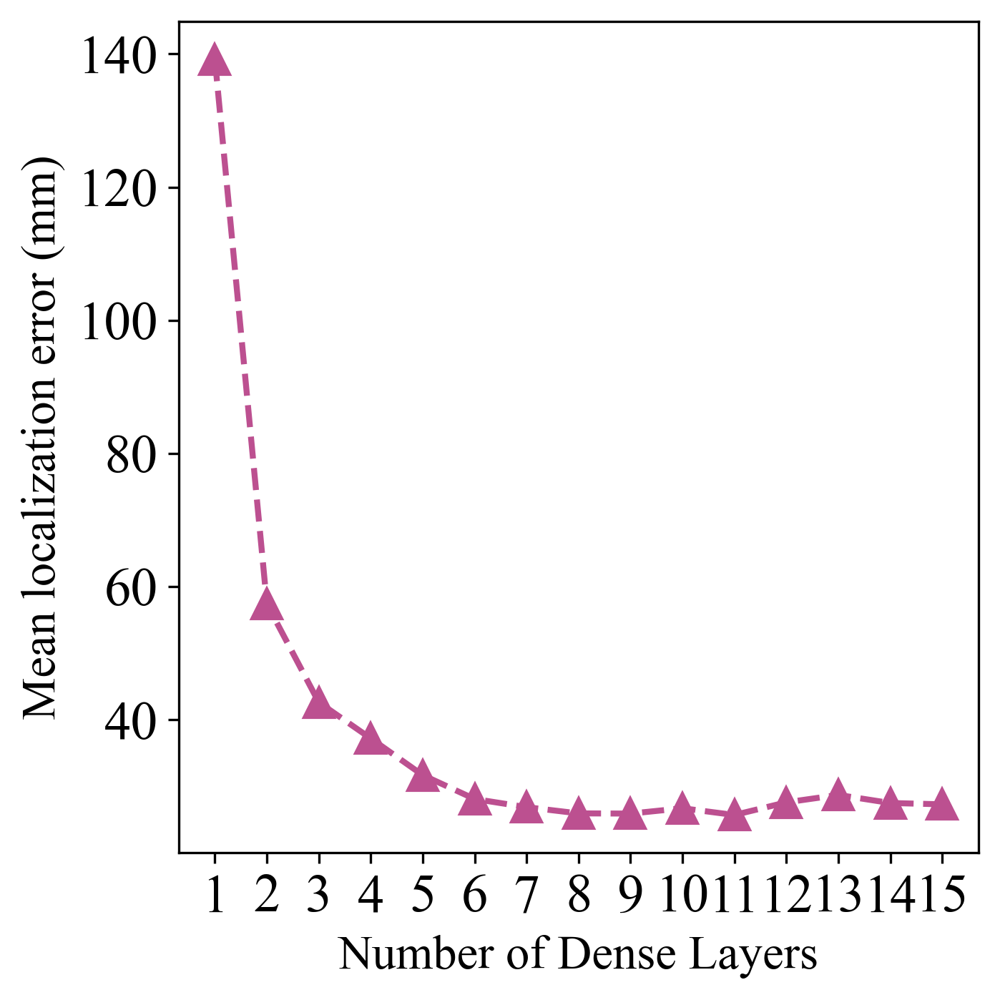

In [32]:
import matplotlib.pyplot as plt

# 数据
errors = [139.2, 57.4, 42.60, 37.18, 31.67, 28.08, 26.85, 25.92, 25.89, 26.69, 25.68, 27.58, 28.69, 27.48, 27.28]
layers = list(range(1, 16))  # 1到15层

plt.figure(figsize=(5, 5), dpi=300)

# 设置全局字体
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 18

# 绘制折线图，带点
plt.plot(layers, errors, marker='^', linestyle='--', markersize=10, color='#bc5090', linewidth=2)

plt.xlabel('Number of Dense Layers', fontname='Times New Roman', fontsize=16)
plt.ylabel('Mean localization error (mm)', fontname='Times New Roman', fontsize=16)

plt.xticks(layers, fontname='Times New Roman', fontsize=18)
plt.yticks(fontname='Times New Roman', fontsize=18)

plt.tight_layout()
plt.show()


In [55]:
import numpy as np
from sklearn.model_selection import train_test_split

# === 加载数据 ===
x_train = np.load('C:/localization/x_train_0dB.npy')  # 输入（污染信号）
y_train = np.load('C:/localization/X_train.npy')       # 目标（干净信号）

x_val = np.load('C:/localization/x_val_0dB.npy')  # 输入（污染信号）
y_val = np.load('C:/localization/X_val.npy')
# === 添加通道维度 ===
x_train = x_train[..., np.newaxis]  # (N, 1024, 1)
y_train = y_train[..., np.newaxis]

x_val = x_val[..., np.newaxis]  # (N, 1024, 1)
y_val = y_val[..., np.newaxis]
# === 按 8:1:1 划分 ===

from tensorflow.keras import layers, models

# === 你的 U-Net 构建函数 ===
def conv_block(x, filters, kernel_size=3, activation='relu'):
    x = layers.Conv1D(filters, kernel_size, padding='same')(x)
    x = layers.Activation(activation)(x)
    x = layers.Conv1D(filters, kernel_size, padding='same')(x)
    x = layers.Activation(activation)(x)
    return x

def encoder_block(x, filters):
    x = conv_block(x, filters)
    p = layers.MaxPooling1D(pool_size=2)(x)
    return x, p

def decoder_block(x, skip, filters):
    x = layers.UpSampling1D(size=2)(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x

def build_unet_1d(input_length=1024):


    inputs = layers.Input(shape=(input_length, 1))
    # 下采样部分
    e1, p1 = encoder_block(inputs, 32)        # 第1层
    e2, p2 = encoder_block(p1, 64)            # 第2层
    e3, p3 = encoder_block(p2, 128)           # 第3层
    e4, p4 = encoder_block(p3, 256)           # 第4层
    e5, p5 = encoder_block(p4, 512)           # 第5层
    e6, p6 = encoder_block(p5, 1024)          # 第6层
    e7, p7 = encoder_block(p6, 2048)          # 第7层
    e8, p8 = encoder_block(p7, 4096)          # 第8层
    e9, p9 = encoder_block(p8, 1096)          # 第9层
    # bottleneck
    b = conv_block(p9, 8192)
    # 上采样部分
    d9 = decoder_block(b,  e9, 8192)          # 第9层
    d8 = decoder_block(d9, e8, 4096)          # 第8层
    d7 = decoder_block(d8, e7, 2048)          # 第7层
    d6 = decoder_block(d7, e6, 1024)          # 第6层
    d5 = decoder_block(d6, e5, 512)           # 第5层
    d4 = decoder_block(d5, e4, 256)           # 第4层
    d3 = decoder_block(d4, e3, 128)           # 第3层
    d2 = decoder_block(d3, e2, 64)            # 第2层
    d1 = decoder_block(d2, e1, 32)            # 第1层
    outputs = layers.Conv1D(1, kernel_size=1, activation='linear')(d1)
    return models.Model(inputs=inputs, outputs=outputs)


#     inputs = layers.Input(shape=(input_length, 1))
#     e1, p1 = encoder_block(inputs, 32)
#     e2, p2 = encoder_block(p1, 64)
#     e3, p3 = encoder_block(p2, 128)
#     e4, p4 = encoder_block(p3, 256)
#     e5, p5 = encoder_block(p4, 512)
#     e6, p6 = encoder_block(p5, 512)
#     b = conv_block(p6, 512)
#     d6 = decoder_block(b, e6, 512)
#     d5 = decoder_block(d6, e5, 256)
#     d4 = decoder_block(d5, e4, 128)
#     d3 = decoder_block(d4, e3, 64)
#     d2 = decoder_block(d3, e2, 32)
#     d1 = decoder_block(d2, e1, 32)
#     outputs = layers.Conv1D(1, kernel_size=1, activation='linear')(d1)
#     return models.Model(inputs=inputs, outputs=outputs)


# 构建模型
model = build_unet_1d(input_length=1024)
model.summary()

from tensorflow.keras.callbacks import EarlyStopping

# === 编译模型 ===
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# === 设置 EarlyStopping（验证集损失连续10轮不提升就停止）===
from tensorflow.keras.callbacks import ModelCheckpoint

# === 设置模型保存路径 ===
checkpoint_path = 'C:/localization/denoise_0dB_opt.h5'

# === 设置只保存 val_loss 最低的模型 ===
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,  # 保存整个模型结构 + 权重
    verbose=1
)

# === 训练固定 100 轮（不使用 early stopping） ===
history = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=100,
    batch_size=200,
    callbacks=[checkpoint],  # 不再用 EarlyStopping
    verbose=1
)









ResourceExhaustedError: failed to allocate memory [Op:Mul]

In [53]:
import numpy as np
from tensorflow.keras.models import load_model

# 定义模型路径和测试数据路径
model_path = 'C:/localization/denoise_0dB_opt.h5'
x_test = np.load('C:/localization/x_test_0dB.npy')

# 添加通道维度（如果还没有）

# 加载模型
denoise_model = load_model(model_path)

# 预测去噪结果
y_pred = denoise_model.predict(x_test, batch_size=2000)


y_test = np.load('C:/localization/X_test.npy')
y_pred = y_pred.squeeze()


def compute_snr(clean, denoised):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean((clean - denoised) ** 2)
    if noise_power == 0:
        return np.inf
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

snr_value = compute_snr(y_test, y_pred)
print(f"Test SNR: {snr_value:.2f} dB")


Test SNR: 12.07 dB


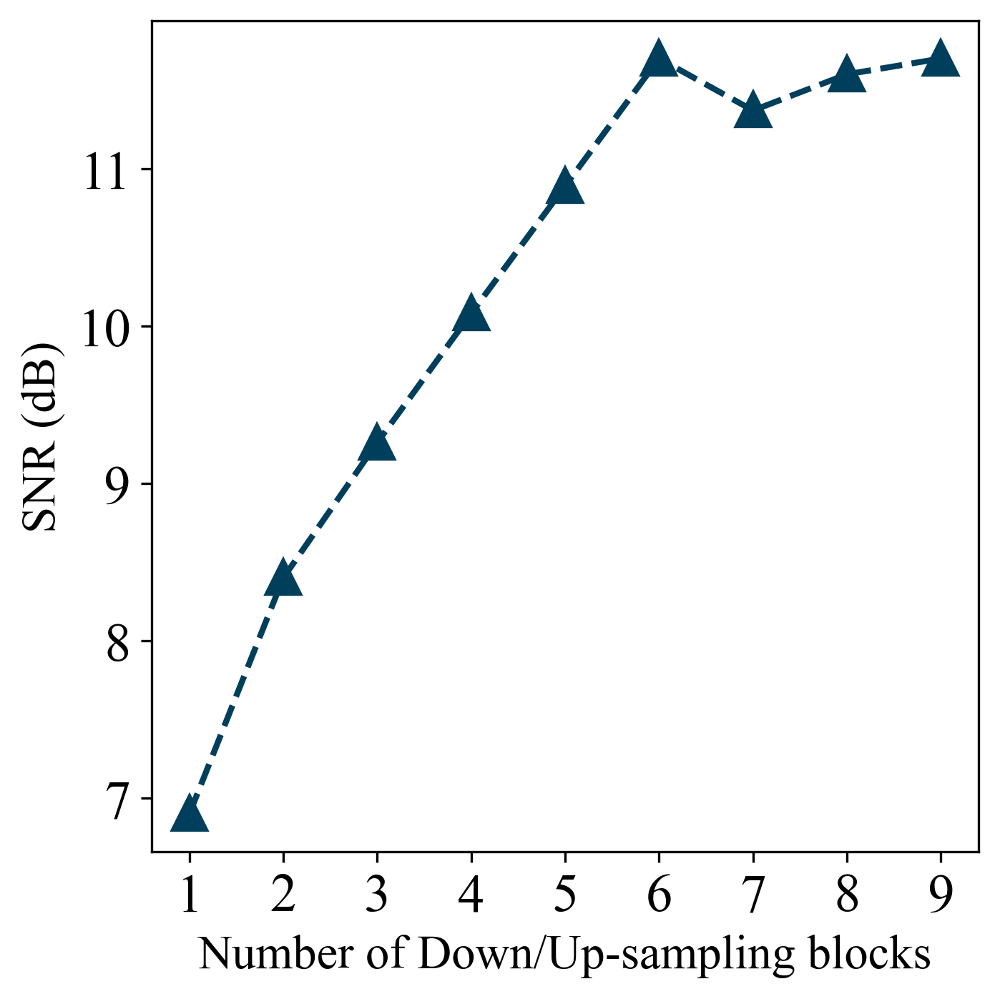

In [62]:
import matplotlib.pyplot as plt

# 数据
snr = [6.90, 8.4, 9.26, 10.08, 10.89, 11.70, 11.37, 11.60,11.7]
layers = list(range(1,10))  # 1到8层

plt.figure(figsize=(5, 5), dpi=300)

# 设置全局字体
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 18

# 绘制折线图，marker空心三角，大小10
plt.plot(layers, snr, marker='^', linestyle='--', markersize=10,  markeredgewidth=2, color='#003f5c', linewidth=2)

plt.xlabel('Number of Down/Up-sampling blocks', fontname='Times New Roman', fontsize=16)
plt.ylabel('SNR (dB)', fontname='Times New Roman', fontsize=16)

plt.xticks(layers, fontname='Times New Roman', fontsize=18)
plt.yticks(fontname='Times New Roman', fontsize=18)

plt.tight_layout()
plt.show()


In [68]:
nosie_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')

clean_x_test = np.load(r'C:/localization/X_test.npy').astype('float32')
print(clean_x_test.shape)

(2295, 1024)


In [65]:
# 在一个新单元里运行：
%pip install EMD-signal


Note: you may need to restart the kernel to use updated packages.


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [11]:
import numpy as np
from scipy.fft import fft, ifft, fftfreq

def fft_denoise(signal, cum_ratio=0.5, fs=1024):
    """
    基于频域累积能量阈值的自适应低通滤波：
    - 对信号做 FFT，计算频谱累积能量
    - 确定累积能量达到 cum_ratio 时的截止频率
    - 应用低通掩码并 IFFT 重构时域信号
    """
    N = len(signal)
    freqs = fftfreq(N, 1/fs)
    spectrum = fft(signal)
    # 只看正频部分
    pos_power = np.abs(spectrum[:N//2])**2
    cum_energy = np.cumsum(pos_power)
    total_energy = cum_energy[-1]
    # 找到频率索引，使累积能量比 >= cum_ratio
    cutoff_idx = np.searchsorted(cum_energy / total_energy, cum_ratio)
    cutoff_freq = freqs[:N//2][cutoff_idx]
    # 构造低通掩码
    mask = np.abs(freqs) <= cutoff_freq
    # 滤波并重构
    filtered = np.real(ifft(spectrum * mask))
    return filtered

def compute_snr(clean, denoised):
    """
    计算 SNR (dB)：10*log10( signal_power / noise_power )
    """
    signal_power = np.mean(clean**2)
    noise_power  = np.mean((clean - denoised)**2)
    if noise_power == 0:
        return np.inf
    return 10 * np.log10(signal_power / noise_power)

noise_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')  # (N, 1024)
clean_X_test = np.load(r'C:/localization/X_test.npy').astype('float32')      # (N, 1024)

    # 2. 对每条含噪信号做 FFT 去噪 (阈值 cum_ratio=0.5)
denoised_list = [fft_denoise(sig, cum_ratio=0.5, fs=1024) for sig in noise_X_test]
denoised_X_test = np.vstack(denoised_list)

    # 3. 分别计算去噪前后各样本的 SNR
N = noise_X_test.shape[0]
snr_before = np.zeros(N, dtype=np.float32)
snr_after  = np.zeros(N, dtype=np.float32)
for i in range(N):
    snr_before[i] = compute_snr(clean_X_test[i], noise_X_test[i])
    snr_after[i]  = compute_snr(clean_X_test[i], denoised_X_test[i])

    # 4. 打印统计结果
print(f"平均去噪前  SNR: {snr_before.mean():.2f} dB")
print(f"平均去噪后  SNR: {snr_after.mean():.2f} dB")
print(f"平均 SNR 提升: {(snr_after - snr_before).mean():.2f} dB")

    # 5. （可选）保存去噪结果和 SNR 向量
    # np.save(r'C:/localization/x_test_0dB_fft_denoised.npy', denoised_X_test)
    # np.save(r'C:/localization/snr_before_0dB.npy', snr_before)
    # np.save(r'C:/localization/snr_after_fft_0dB.npy', snr_after)




平均去噪前  SNR: 0.00 dB
平均去噪后  SNR: 9.93 dB
平均 SNR 提升: 9.93 dB


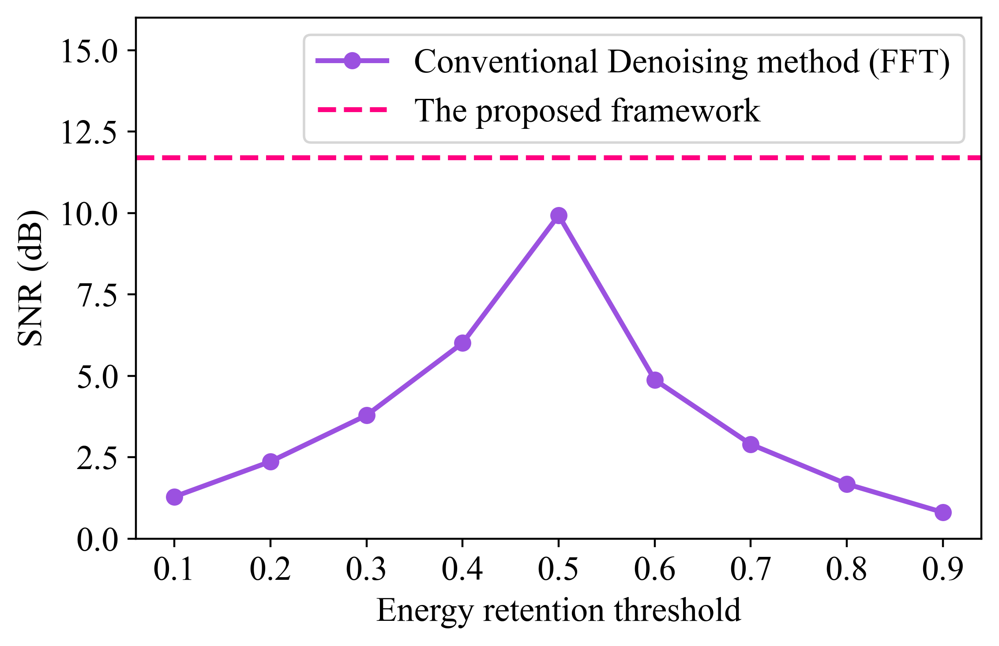

In [127]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Times New Roman'

# 阈值及对应 SNR
thresholds = np.arange(0.1, 1.0, 0.1)
fft_snr = [1.29, 2.37, 3.79, 6.01, 9.93, 4.88, 2.90, 1.68, 0.81]
dl_snr = 11.7  # 你们框架

fig, ax = plt.subplots(figsize=(6, 4), dpi=400)

# FFT方法折线
ax.plot(thresholds, fft_snr, marker='o', color='#9B51E0', linewidth=2, label='Conventional Denoising method (FFT)')

# DL方法水平线
ax.axhline(dl_snr, color='#FF0080', linestyle='--', linewidth=2, label='The proposed framework')

# 设置字体统一
fontsize = 14
ax.set_xlabel('Energy retention threshold', fontsize=fontsize)
ax.set_ylabel('SNR (dB)', fontsize=fontsize)
ax.set_xticks(thresholds)
ax.set_ylim(0, 16)
ax.legend(fontsize=fontsize)
ax.tick_params(axis='both', which='major', labelsize=fontsize)  # 坐标轴数字也统一

plt.tight_layout()
plt.show()


In [9]:
import numpy as np
from tensorflow.keras.models import load_model

# 定义模型路径和测试数据路径
model_path = 'C:/localization/denoise_0dB.h5'
x_test = np.load('C:/localization/x_test_0dB.npy')

# 添加通道维度（如果还没有）

# 加载模型
denoise_model = load_model(model_path)

# 预测去噪结果
y_pred = denoise_model.predict(x_test, batch_size=2000)


y_test = np.load('C:/localization/X_test.npy')
y_pred = y_pred.squeeze()


def compute_snr(clean, denoised):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean((clean - denoised) ** 2)
    if noise_power == 0:
        return np.inf
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

snr_value = compute_snr(y_test, y_pred)
print(f"Test SNR: {snr_value:.2f} dB")


Test SNR: 11.70 dB


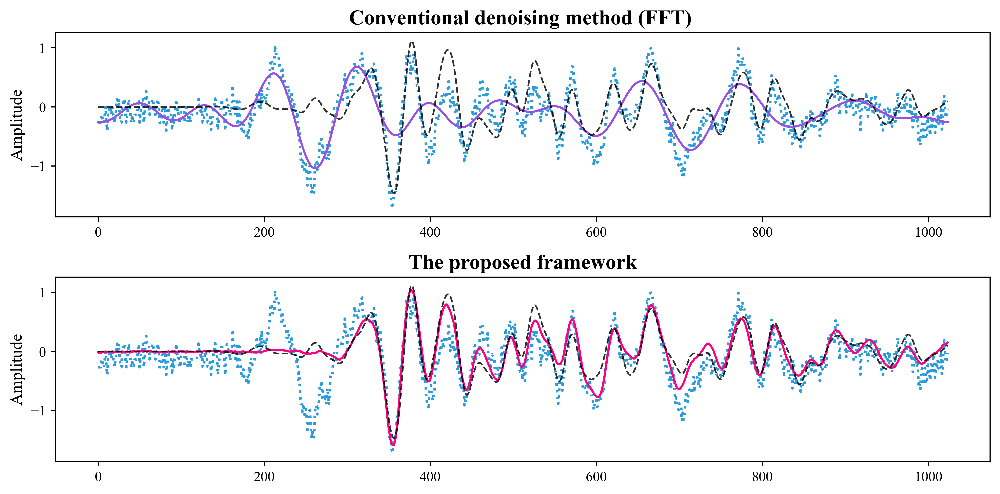

In [20]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Times New Roman'

# 信号索引
idx = 5

# 加载数据
x_test = np.load('C:/localization/x_test_0dB.npy')
fft_denoised = denoised_X_test       # 传统 FFT 去噪
dl_denoised = y_pred                 # DL 去噪
clean = np.load('C:/localization/X_test.npy')

fig, axes = plt.subplots(2, 1, figsize=(10, 5), dpi=500)
fig.subplots_adjust(hspace=0.32)

# ----------- 第1幅：输入、FFT去噪、干净 -----------
axes[0].plot(x_test[idx],        color='#2D9CDB', linestyle=':', linewidth=1.8)
axes[0].plot(fft_denoised[idx],  color='#9B51E0', linewidth=1.5)
axes[0].plot(clean[idx],         color='black', linestyle='--', linewidth=1.2, alpha=0.8)
axes[0].set_ylabel('Amplitude', fontsize=12)
axes[0].set_title('Conventional denoising method (FFT) ', fontsize=15, fontweight='bold')
# axes[0].legend(fontsize=10, loc='upper right')  # 已移除

# ----------- 第2幅：输入、DL去噪、干净 -----------
axes[1].plot(x_test[idx],        color='#2D9CDB', linestyle=':', linewidth=1.8)
axes[1].plot(dl_denoised[idx],   color='#FF0080', linewidth=1.5)
axes[1].plot(clean[idx],         color='black', linestyle='--', linewidth=1.2, alpha=0.8)

axes[1].set_ylabel('Amplitude', fontsize=12)
axes[1].set_title('The proposed framework', fontsize=15, fontweight='bold')
# axes[1].legend(fontsize=10, loc='upper right')  # 已移除

plt.tight_layout()
plt.show()


In [17]:
import numpy as np
import os
from tensorflow.keras.models import load_model
import matplotlib
matplotlib.rcParams['font.family'] = 'Times New Roman'

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')

denoise_model = load_model('C:/localization/denoise_0dB.h5')

X_test = denoise_model.predict(new_X_test, batch_size=2000)



# 预测
y_pred = best_model.predict(fft_denoised )  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")

新测试集样本的平均欧氏距离: 88.3673


C:\Users\RTX4090D\AppData\Local\Temp\ipykernel_19276\466550537.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(methods, fontsize=20)


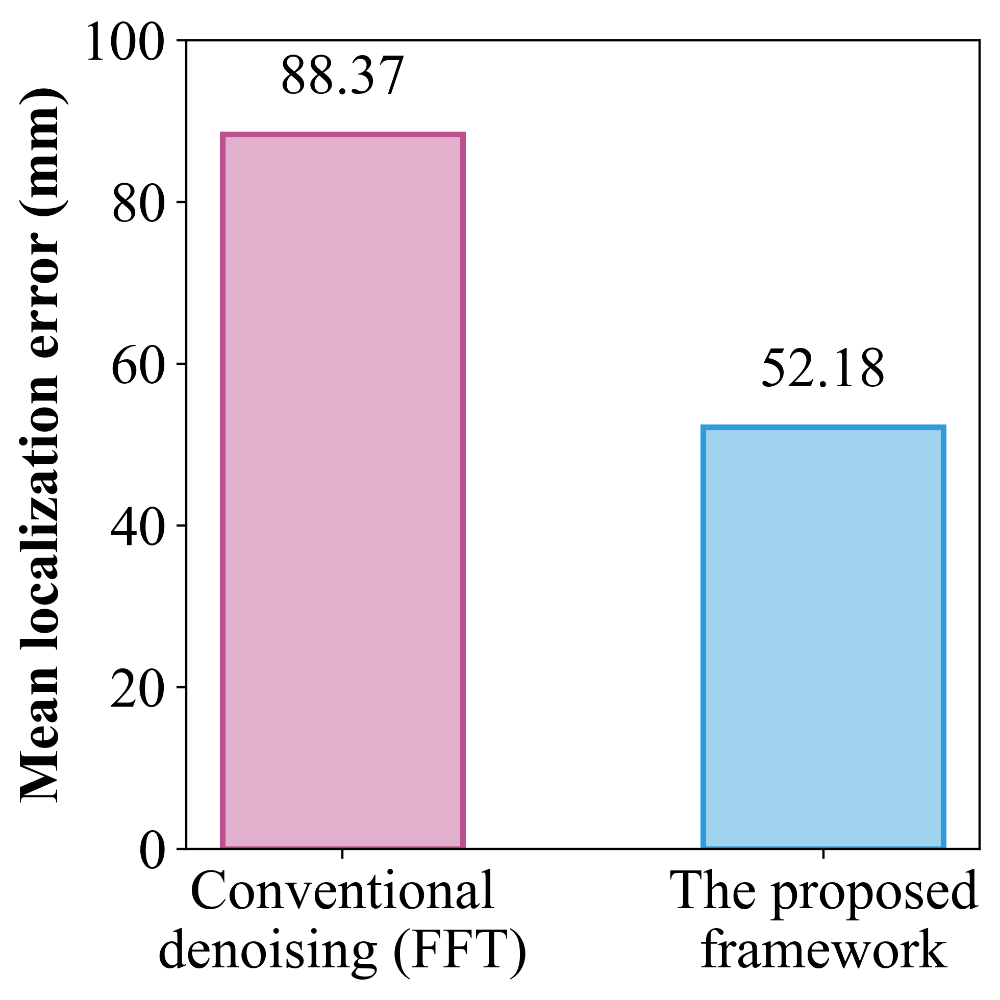

In [30]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['font.family'] = 'Times New Roman'

methods = ['Conventional\ndenoising (FFT)', 'The proposed\nframework']
errors = [88.37, 52.18]

# 你给的配色
edge_colors = ['#bc5090', '#2D9CDB']
fill_colors = [(188/255, 80/255, 144/255, 0.45), (45/255, 156/255, 219/255, 0.45)]

fig, ax = plt.subplots(figsize=(5, 5), dpi=400)

bars = ax.bar(methods, errors, color=fill_colors, edgecolor=edge_colors, linewidth=2, width=0.5)

# 添加数值标签
for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{height:.2f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 10),  # 更大向上偏移
                textcoords="offset points",
                ha='center', va='bottom',
                fontsize=20)

ax.set_ylabel('Mean localization error (mm)', fontsize=20, fontweight='bold')
ax.set_ylim(0, 100)
ax.set_xticklabels(methods, fontsize=20)
ax.tick_params(axis='y', labelsize=20)
plt.tight_layout()
plt.show()


In [1]:
import numpy as np
from sklearn.model_selection import train_test_split

# === 加载数据 ===
x_train = np.load('C:/localization/x_train_0dB.npy')  # 输入（污染信号）
y_train = np.load('C:/localization/X_train.npy')       # 目标（干净信号）

x_val = np.load('C:/localization/x_val_0dB.npy')  # 输入（污染信号）
y_val = np.load('C:/localization/X_val.npy')
# === 添加通道维度 ===
x_train = x_train[..., np.newaxis]  # (N, 1024, 1)
y_train = y_train[..., np.newaxis]

x_val = x_val[..., np.newaxis]  # (N, 1024, 1)
y_val = y_val[..., np.newaxis]
# === 按 8:1:1 划分 ===

from tensorflow.keras import layers, models

# === 你的 U-Net 构建函数 ===
def conv_block(x, filters, kernel_size=3, activation='relu'):
    x = layers.Conv1D(filters, kernel_size, padding='same')(x)
    x = layers.Activation(activation)(x)
    x = layers.Conv1D(filters, kernel_size, padding='same')(x)
    x = layers.Activation(activation)(x)
    return x

def encoder_block(x, filters):
    x = conv_block(x, filters)
    p = layers.MaxPooling1D(pool_size=2)(x)
    return x, p

def decoder_block(x, skip, filters):
    x = layers.UpSampling1D(size=2)(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x

def build_unet_1d(input_length=1024):


#     inputs = layers.Input(shape=(input_length, 1))
#     # 下采样部分
#     e1, p1 = encoder_block(inputs, 32)        # 第1层
#     e2, p2 = encoder_block(p1, 64)            # 第2层
#     e3, p3 = encoder_block(p2, 128)           # 第3层
#     e4, p4 = encoder_block(p3, 256)           # 第4层
#     e5, p5 = encoder_block(p4, 512)           # 第5层
#     e6, p6 = encoder_block(p5, 1024)          # 第6层
#     e7, p7 = encoder_block(p6, 2048)          # 第7层
#     e8, p8 = encoder_block(p7, 4096)          # 第8层
#     e9, p9 = encoder_block(p8, 1096)          # 第9层
#     # bottleneck
#     b = conv_block(p9, 8192)
#     # 上采样部分
#     d9 = decoder_block(b,  e9, 8192)          # 第9层
#     d8 = decoder_block(d9, e8, 4096)          # 第8层
#     d7 = decoder_block(d8, e7, 2048)          # 第7层
#     d6 = decoder_block(d7, e6, 1024)          # 第6层
#     d5 = decoder_block(d6, e5, 512)           # 第5层
#     d4 = decoder_block(d5, e4, 256)           # 第4层
#     d3 = decoder_block(d4, e3, 128)           # 第3层
#     d2 = decoder_block(d3, e2, 64)            # 第2层
#     d1 = decoder_block(d2, e1, 32)            # 第1层
#     outputs = layers.Conv1D(1, kernel_size=1, activation='linear')(d1)
#     return models.Model(inputs=inputs, outputs=outputs)


    inputs = layers.Input(shape=(input_length, 1))
    e1, p1 = encoder_block(inputs, 32)
    e2, p2 = encoder_block(p1, 64)
    e3, p3 = encoder_block(p2, 128)
    e4, p4 = encoder_block(p3, 256)
    e5, p5 = encoder_block(p4, 512)
    e6, p6 = encoder_block(p5, 1024)
    b = conv_block(p6,1024)
    d6 = decoder_block(b, e6, 1024)
    d5 = decoder_block(d6, e5, 256)
    d4 = decoder_block(d5, e4, 128)
    d3 = decoder_block(d4, e3, 64)
    d2 = decoder_block(d3, e2, 32)
    d1 = decoder_block(d2, e1, 32)
    outputs = layers.Conv1D(1, kernel_size=1, activation='linear')(d1)
    return models.Model(inputs=inputs, outputs=outputs)


# 构建模型
model = build_unet_1d(input_length=1024)
model.summary()

from tensorflow.keras.callbacks import EarlyStopping

# === 编译模型 ===
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# === 设置 EarlyStopping（验证集损失连续10轮不提升就停止）===
from tensorflow.keras.callbacks import ModelCheckpoint

# === 设置模型保存路径 ===
checkpoint_path = 'C:/localization/denoise_0dB_with_connect.h5'

# === 设置只保存 val_loss 最低的模型 ===
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,  # 保存整个模型结构 + 权重
    verbose=1
)

# === 训练固定 100 轮（不使用 early stopping） ===
history = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=100,
    batch_size=200,
    callbacks=[checkpoint],  # 不再用 EarlyStopping
    verbose=1
)









Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1024, 1)]    0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 1024, 32)     128         input_1[0][0]                    
__________________________________________________________________________________________________
activation (Activation)         (None, 1024, 32)     0           conv1d[0][0]                     
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 1024, 32)     3104        activation[0][0]                 
______________________________________________________________________________________________

92/92 [==============================] - 19s 88ms/step - loss: 0.0296 - mae: 0.0865 - val_loss: 0.0149 - val_mae: 0.0603

Epoch 00001: val_loss improved from inf to 0.01486, saving model to C:/localization\denoise_0dB_with_connect.h5
Epoch 2/100
92/92 [==============================] - 7s 74ms/step - loss: 0.0145 - mae: 0.0586 - val_loss: 0.0126 - val_mae: 0.0551

Epoch 00002: val_loss improved from 0.01486 to 0.01259, saving model to C:/localization\denoise_0dB_with_connect.h5
Epoch 3/100
92/92 [==============================] - 7s 74ms/step - loss: 0.0133 - mae: 0.0560 - val_loss: 0.0110 - val_mae: 0.0509

Epoch 00003: val_loss improved from 0.01259 to 0.01105, saving model to C:/localization\denoise_0dB_with_connect.h5
Epoch 4/100
92/92 [==============================] - 7s 74ms/step - loss: 0.0114 - mae: 0.0514 - val_loss: 0.0104 - val_mae: 0.0497

Epoch 00004: val_loss improved from 0.01105 to 0.01037, saving model to C:/localization\denoise_0dB_with_connect.h5
Epoch 5/100
92/92 [

92/92 [==============================] - 7s 74ms/step - loss: 9.2127e-04 - mae: 0.0191 - val_loss: 0.0074 - val_mae: 0.0410

Epoch 00083: val_loss did not improve from 0.00675
Epoch 84/100
92/92 [==============================] - 7s 73ms/step - loss: 8.7986e-04 - mae: 0.0188 - val_loss: 0.0074 - val_mae: 0.0413

Epoch 00084: val_loss did not improve from 0.00675
Epoch 85/100
92/92 [==============================] - 7s 73ms/step - loss: 8.3604e-04 - mae: 0.0184 - val_loss: 0.0073 - val_mae: 0.0407

Epoch 00085: val_loss did not improve from 0.00675
Epoch 86/100
92/92 [==============================] - 7s 73ms/step - loss: 8.1514e-04 - mae: 0.0182 - val_loss: 0.0073 - val_mae: 0.0409

Epoch 00086: val_loss did not improve from 0.00675
Epoch 87/100
92/92 [==============================] - 7s 74ms/step - loss: 8.2781e-04 - mae: 0.0182 - val_loss: 0.0075 - val_mae: 0.0416

Epoch 00087: val_loss did not improve from 0.00675
Epoch 88/100
92/92 [==============================] - 7s 74ms/step -

In [145]:
import numpy as np
from tensorflow.keras.models import load_model

# 定义模型路径和测试数据路径
model_path = 'C:/localization/denoise_0dB_with_connect.h5'
x_test = np.load('C:/localization/x_test_0dB.npy')

# 添加通道维度（如果还没有）

# 加载模型
denoise_model = load_model(model_path)

# 预测去噪结果
y_pred = denoise_model.predict(x_test, batch_size=2000)


y_test = np.load('C:/localization/X_test.npy')
y_pred = y_pred.squeeze()


def compute_snr(clean, denoised):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean((clean - denoised) ** 2)
    if noise_power == 0:
        return np.inf
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

snr_value = compute_snr(y_test, y_pred)
print(f"Test SNR: {snr_value:.2f} dB")

# 打印所有 Conv1D 层的名字，人工选一个
conv_layer_names = [layer.name for layer in denoise_model.layers if layer.__class__.__name__ == 'Conv1D']
print(conv_layer_names)



Test SNR: 11.79 dB
['conv1d', 'conv1d_1', 'conv1d_2', 'conv1d_3', 'conv1d_4', 'conv1d_5', 'conv1d_6', 'conv1d_7', 'conv1d_8', 'conv1d_9', 'conv1d_10', 'conv1d_11', 'conv1d_12', 'conv1d_13', 'conv1d_14', 'conv1d_15', 'conv1d_16', 'conv1d_17', 'conv1d_18', 'conv1d_19', 'conv1d_20', 'conv1d_21', 'conv1d_22', 'conv1d_23', 'conv1d_24', 'conv1d_25', 'conv1d_26']


In [19]:
import numpy as np
import os
from tensorflow.keras.models import load_model
import matplotlib
matplotlib.rcParams['font.family'] = 'Times New Roman'

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')

denoise_model = load_model('C:/localization/denoise_0dB.h5')

X_test = denoise_model.predict(new_X_test, batch_size=2000)



# 预测
y_pred = best_model.predict(X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")






新测试集样本的平均欧氏距离: 52.1765


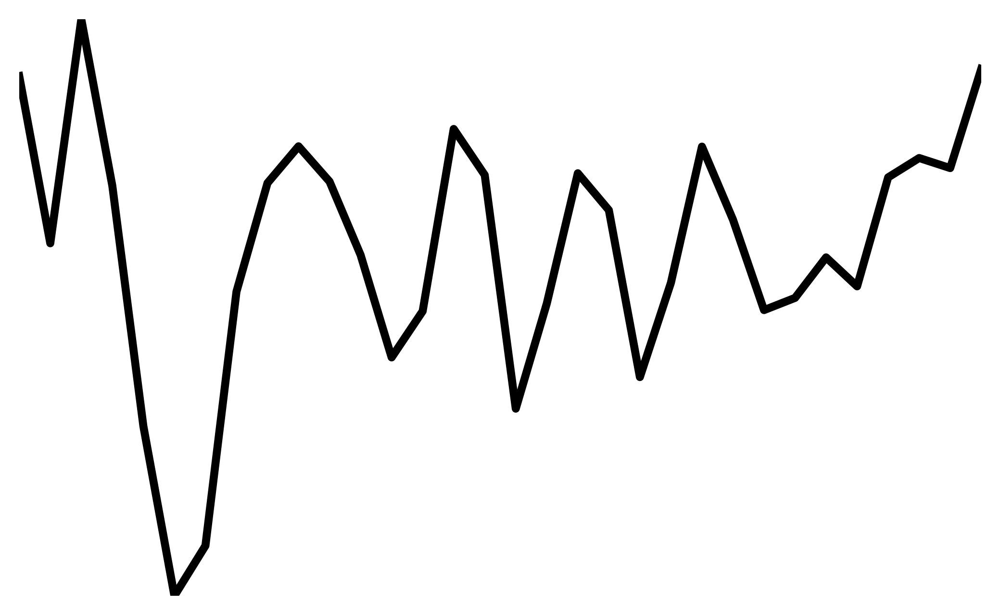

In [174]:

# 假设你想看 conv1d_5 这一层
target_layer = 'conv1d_14'  # 你想看的层名字，按你模型结构修改

from tensorflow.keras.models import Model

# 构造只输出这一层的中间层模型
feature_model = Model(
    inputs=denoise_model.input,
    outputs=denoise_model.get_layer(target_layer).output
)

# 选一个输入样本
sample_idx = 0
input_signal = x_test[sample_idx][np.newaxis, ...]  # (1, 1024, 1)

# 得到该层输出
feature = feature_model.predict(input_signal)  # shape: (1, 时间步, 通道数)

import matplotlib.pyplot as plt

plt.figure(figsize=(5, 3), dpi=400)
plt.plot(feature[0, :,0], color='black', linewidth=3
         
        )
plt.axis('off')  # 关闭全部坐标轴
plt.margins(0)   # 紧贴边界
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # 去掉四周空白
plt.show()


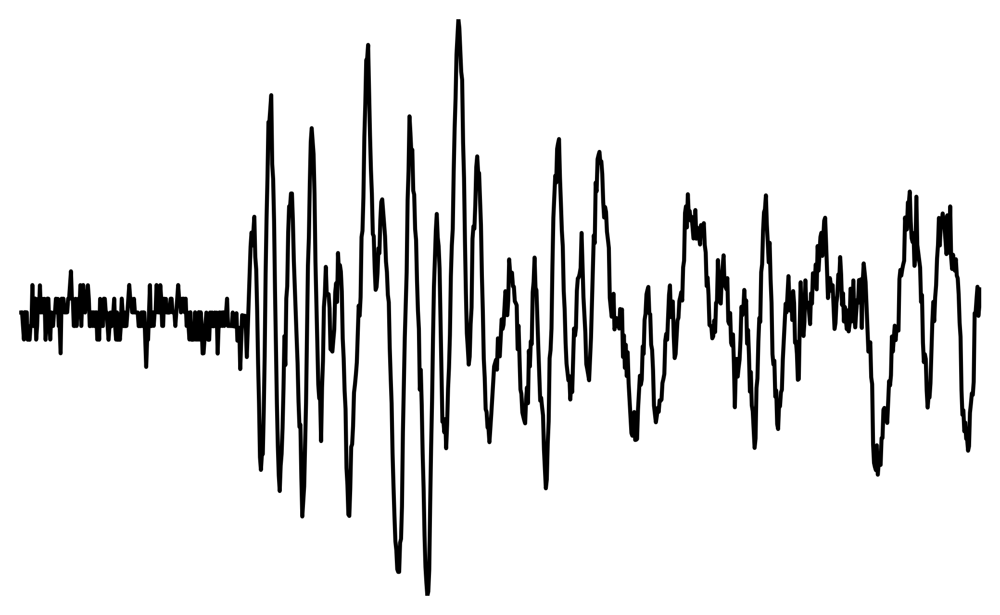

In [178]:
import matplotlib.pyplot as plt

sample_idx = 0  # 你想要的样本索引
true_clean = x_test[sample_idx]  # shape: (1024,) 或 (1024, 1)

plt.figure(figsize=(5, 3), dpi=400)
plt.plot(true_clean.squeeze(), color='black')
plt.axis('off')               # 去掉坐标轴
plt.margins(0)                # 去掉左右空白
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # 去掉边距
plt.show()


In [12]:
import numpy as np
from sklearn.model_selection import train_test_split

# === 加载数据 ===
x_train = np.load('C:/localization/x_train_0dB.npy')  # 输入（污染信号）
y_train = np.load('C:/localization/X_train.npy')       # 目标（干净信号）

x_val = np.load('C:/localization/x_val_0dB.npy')  # 输入（污染信号）
y_val = np.load('C:/localization/X_val.npy')
# === 添加通道维度 ===
x_train = x_train[..., np.newaxis]  # (N, 1024, 1)
y_train = y_train[..., np.newaxis]

x_val = x_val[..., np.newaxis]  # (N, 1024, 1)
y_val = y_val[..., np.newaxis]
# === 按 8:1:1 划分 ===

from tensorflow.keras import layers, models

# === 你的 U-Net 构建函数 ===
def conv_block(x, filters, kernel_size=3, activation='relu'):
    x = layers.Conv1D(filters, kernel_size, padding='same')(x)
    x = layers.Activation(activation)(x)
    x = layers.Conv1D(filters, kernel_size, padding='same')(x)
    x = layers.Activation(activation)(x)
    return x

def encoder_block(x, filters):
    x = conv_block(x, filters)
    p = layers.MaxPooling1D(pool_size=2)(x)
    return x, p

def decoder_block_no_skip(x, filters):
    x = layers.UpSampling1D(size=2)(x)
    x = conv_block(x, filters)
    return x


def build_unet_1d_no_skip(input_length=1024):
    inputs = layers.Input(shape=(input_length, 1))
    e1, p1 = encoder_block(inputs, 32)
    e2, p2 = encoder_block(p1, 64)
    e3, p3 = encoder_block(p2, 128)
    e4, p4 = encoder_block(p3, 256)
    e5, p5 = encoder_block(p4, 512)
    e6, p6 = encoder_block(p5, 1024)
    b = conv_block(p6, 1024)
    d6 = decoder_block_no_skip(b, 1024)
    d5 = decoder_block_no_skip(d6, 256)
    d4 = decoder_block_no_skip(d5, 128)
    d3 = decoder_block_no_skip(d4, 64)
    d2 = decoder_block_no_skip(d3, 32)
    d1 = decoder_block_no_skip(d2, 32)
    outputs = layers.Conv1D(1, kernel_size=1, activation='linear')(d1)
    return models.Model(inputs=inputs, outputs=outputs)


model_no_skip = build_unet_1d_no_skip(input_length=1024)
model_no_skip.summary()

model_no_skip.compile(optimizer='adam', loss='mse', metrics=['mae'])

checkpoint_no_skip = ModelCheckpoint(
    filepath='C:/localization/denoise_0dB_no_connect.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

history_no_skip = model_no_skip.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=100,
    batch_size=200,
    callbacks=[checkpoint_no_skip],
    verbose=1
)










Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 1024, 1)]         0         
_________________________________________________________________
conv1d_27 (Conv1D)           (None, 1024, 32)          128       
_________________________________________________________________
activation_26 (Activation)   (None, 1024, 32)          0         
_________________________________________________________________
conv1d_28 (Conv1D)           (None, 1024, 32)          3104      
_________________________________________________________________
activation_27 (Activation)   (None, 1024, 32)          0         
_________________________________________________________________
max_pooling1d_6 (MaxPooling1 (None, 512, 32)           0         
_________________________________________________________________
conv1d_29 (Conv1D)           (None, 512, 64)           6208

92/92 [==============================] - 11s 70ms/step - loss: 0.1008 - mae: 0.1548 - val_loss: 0.0981 - val_mae: 0.1535

Epoch 00001: val_loss improved from inf to 0.09806, saving model to C:/localization\denoise_0dB_no_connect.h5
Epoch 2/100
92/92 [==============================] - 6s 64ms/step - loss: 0.1002 - mae: 0.1535 - val_loss: 0.0979 - val_mae: 0.1519

Epoch 00002: val_loss improved from 0.09806 to 0.09789, saving model to C:/localization\denoise_0dB_no_connect.h5
Epoch 3/100
92/92 [==============================] - 6s 66ms/step - loss: 0.1002 - mae: 0.1533 - val_loss: 0.0979 - val_mae: 0.1519

Epoch 00003: val_loss improved from 0.09789 to 0.09789, saving model to C:/localization\denoise_0dB_no_connect.h5
Epoch 4/100
92/92 [==============================] - 6s 64ms/step - loss: 0.1002 - mae: 0.1533 - val_loss: 0.0979 - val_mae: 0.1519

Epoch 00004: val_loss improved from 0.09789 to 0.09789, saving model to C:/localization\denoise_0dB_no_connect.h5
Epoch 5/100
92/92 [========

92/92 [==============================] - 6s 63ms/step - loss: 0.1002 - mae: 0.1534 - val_loss: 0.0979 - val_mae: 0.1519

Epoch 00043: val_loss did not improve from 0.09461
Epoch 44/100
92/92 [==============================] - 6s 63ms/step - loss: 0.1002 - mae: 0.1534 - val_loss: 0.0979 - val_mae: 0.1519

Epoch 00044: val_loss did not improve from 0.09461
Epoch 45/100
92/92 [==============================] - 6s 63ms/step - loss: 0.1002 - mae: 0.1533 - val_loss: 0.0979 - val_mae: 0.1519

Epoch 00045: val_loss did not improve from 0.09461
Epoch 46/100
92/92 [==============================] - 6s 64ms/step - loss: 0.1002 - mae: 0.1533 - val_loss: 0.0979 - val_mae: 0.1519

Epoch 00046: val_loss did not improve from 0.09461
Epoch 47/100
92/92 [==============================] - 6s 64ms/step - loss: 0.1002 - mae: 0.1534 - val_loss: 0.0979 - val_mae: 0.1519

Epoch 00047: val_loss did not improve from 0.09461
Epoch 48/100
92/92 [==============================] - 6s 65ms/step - loss: 0.1002 - mae:

In [179]:
import numpy as np
from tensorflow.keras.models import load_model

# 定义模型路径和测试数据路径
model_path = 'C:/localization/denoise_0dB_no_connect.h5'
x_test = np.load('C:/localization/x_test_0dB.npy')

# 添加通道维度（如果还没有）

# 加载模型
denoise_model = load_model(model_path)

# 预测去噪结果
y_pred = denoise_model.predict(x_test, batch_size=2000)


y_test = np.load('C:/localization/X_test.npy')
y_pred = y_pred.squeeze()


def compute_snr(clean, denoised):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean((clean - denoised) ** 2)
    if noise_power == 0:
        return np.inf
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

snr_value = compute_snr(y_test, y_pred)
print(f"Test SNR: {snr_value:.2f} dB")

# 打印所有 Conv1D 层的名字，人工选一个
conv_layer_names = [layer.name for layer in denoise_model.layers if layer.__class__.__name__ == 'Conv1D']
print(conv_layer_names)



Test SNR: 0.13 dB
['conv1d_27', 'conv1d_28', 'conv1d_29', 'conv1d_30', 'conv1d_31', 'conv1d_32', 'conv1d_33', 'conv1d_34', 'conv1d_35', 'conv1d_36', 'conv1d_37', 'conv1d_38', 'conv1d_39', 'conv1d_40', 'conv1d_41', 'conv1d_42', 'conv1d_43', 'conv1d_44', 'conv1d_45', 'conv1d_46', 'conv1d_47', 'conv1d_48', 'conv1d_49', 'conv1d_50', 'conv1d_51', 'conv1d_52', 'conv1d_53']


In [20]:
import numpy as np
import os
from tensorflow.keras.models import load_model
import matplotlib
matplotlib.rcParams['font.family'] = 'Times New Roman'

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')

denoise_model = load_model('C:/localization/denoise_0dB_no_connect.h5')

X_test = denoise_model.predict(new_X_test, batch_size=2000)



# 预测
y_pred = best_model.predict(X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")






新测试集样本的平均欧氏距离: 648.0276


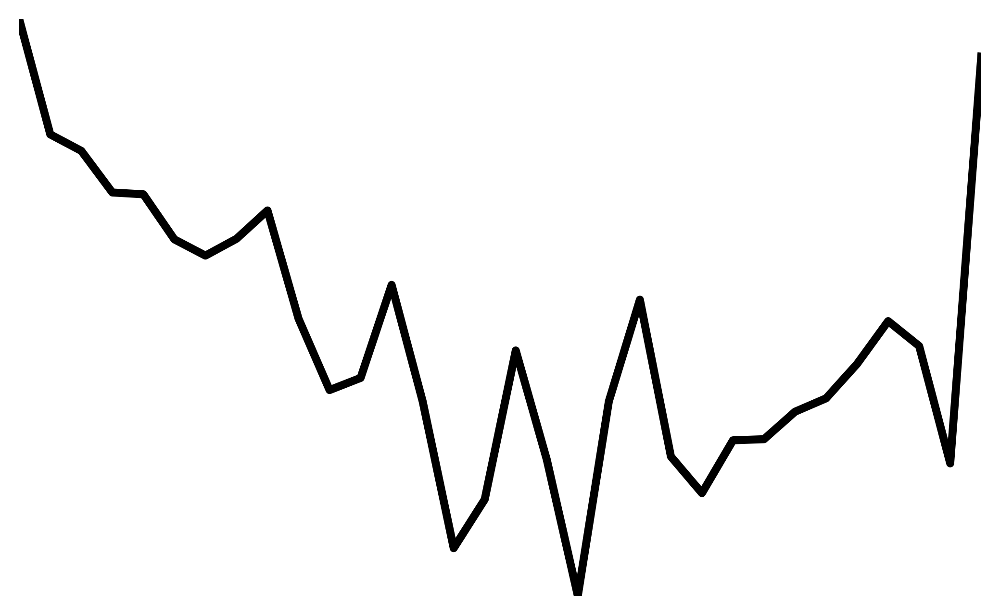

In [192]:

# 假设你想看 conv1d_5 这一层
target_layer = 'conv1d_41'  # 你想看的层名字，按你模型结构修改

from tensorflow.keras.models import Model

# 构造只输出这一层的中间层模型
feature_model = Model(
    inputs=denoise_model.input,
    outputs=denoise_model.get_layer(target_layer).output
)

# 选一个输入样本
sample_idx = 0
input_signal = x_test[sample_idx][np.newaxis, ...]  # (1, 1024, 1)

# 得到该层输出
feature = feature_model.predict(input_signal)  # shape: (1, 时间步, 通道数)

import matplotlib.pyplot as plt

plt.figure(figsize=(5, 3), dpi=400)
plt.plot(feature[0, :,0], color='black', linewidth=3
         
        )
plt.axis('off')  # 关闭全部坐标轴
plt.margins(0)   # 紧贴边界
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # 去掉四周空白
plt.show()


In [215]:
import numpy as np
from sklearn.model_selection import train_test_split

# === 加载数据 ===
x_train = np.load('C:/localization/x_train_0dB.npy')  # 输入（污染信号）
y_train = np.load('C:/localization/X_train.npy')       # 目标（干净信号）

x_val = np.load('C:/localization/x_val_0dB.npy')  # 输入（污染信号）
y_val = np.load('C:/localization/X_val.npy')
# === 添加通道维度 ===
x_train = x_train[..., np.newaxis]  # (N, 1024, 1)
y_train = y_train[..., np.newaxis]

x_val = x_val[..., np.newaxis]  # (N, 1024, 1)
y_val = y_val[..., np.newaxis]
# === 按 8:1:1 划分 ===

import tensorflow as tf
from tensorflow.keras import layers, models

def fc_block(x, units, activation='relu'):
    x = layers.Dense(units, activation=activation)(x)
    x = layers.Dense(units, activation=activation)(x)
    return x

def encoder_fc_block(x, units):
    x_fc = fc_block(x, units)
    p = layers.Dense(units // 2, activation='relu')(x_fc)
    return x_fc, p

def decoder_fc_block(x, skip, units):
    x = layers.Dense(units, activation='relu')(x)
    x = layers.Concatenate()([x, skip])
    x = fc_block(x, units)
    return x

def build_unet_fc(input_length=1024):
    inputs = layers.Input(shape=(input_length, 1))
    x_flat = layers.Flatten()(inputs)

    # Encoder
    e1, p1 = encoder_fc_block(x_flat, 2048)
    e2, p2 = encoder_fc_block(p1, 1024)
    e3, p3 = encoder_fc_block(p2, 512)
    e4, p4 = encoder_fc_block(p3, 256)
    e5, p5 = encoder_fc_block(p4, 128)
    e6, p6 = encoder_fc_block(p5, 64)

    # Bottleneck
    b = fc_block(p6, 32)

    # Decoder
    d6 = decoder_fc_block(b, e6, 64)
    d5 = decoder_fc_block(d6, e5, 128)
    d4 = decoder_fc_block(d5, e4, 256)
    d3 = decoder_fc_block(d4, e3, 512)
    d2 = decoder_fc_block(d3, e2, 1024)
    d1 = decoder_fc_block(d2, e1, 2048)

    # Final reconstruction
    outputs = layers.Dense(input_length, activation='linear')(d1)
    outputs = layers.Reshape((input_length, 1))(outputs)

    return models.Model(inputs=inputs, outputs=outputs)

# 创建并查看模型结构
model = build_unet_fc(input_length=1024)
model.summary()






from tensorflow.keras.callbacks import EarlyStopping

# === 编译模型 ===
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# === 设置 EarlyStopping（验证集损失连续10轮不提升就停止）===
from tensorflow.keras.callbacks import ModelCheckpoint

# === 设置模型保存路径 ===
checkpoint_path = 'C:/localization/denoise_0dB_Dense_with_connect.h5'

# === 设置只保存 val_loss 最低的模型 ===
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,  # 保存整个模型结构 + 权重
    verbose=1
)

# === 训练固定 100 轮（不使用 early stopping） ===
history = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=100,
    batch_size=200,
    callbacks=[checkpoint],  # 不再用 EarlyStopping
    verbose=1
)









Model: "model_183"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 1024, 1)]    0                                            
__________________________________________________________________________________________________
flatten_7 (Flatten)             (None, 1024)         0           input_7[0][0]                    
__________________________________________________________________________________________________
dense_53 (Dense)                (None, 2048)         2099200     flatten_7[0][0]                  
__________________________________________________________________________________________________
dense_54 (Dense)                (None, 2048)         4196352     dense_53[0][0]                   
__________________________________________________________________________________________

92/92 [==============================] - 2s 15ms/step - loss: 0.0424 - mae: 0.1130 - val_loss: 0.0262 - val_mae: 0.0928

Epoch 00001: val_loss improved from inf to 0.02615, saving model to C:/localization\denoise_0dB_Dense_with_connect.h5
Epoch 2/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0238 - mae: 0.0879 - val_loss: 0.0193 - val_mae: 0.0800

Epoch 00002: val_loss improved from 0.02615 to 0.01926, saving model to C:/localization\denoise_0dB_Dense_with_connect.h5
Epoch 3/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0181 - mae: 0.0773 - val_loss: 0.0171 - val_mae: 0.0747

Epoch 00003: val_loss improved from 0.01926 to 0.01711, saving model to C:/localization\denoise_0dB_Dense_with_connect.h5
Epoch 4/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0153 - mae: 0.0711 - val_loss: 0.0153 - val_mae: 0.0697

Epoch 00004: val_loss improved from 0.01711 to 0.01528, saving model to C:/localization\denoise_0dB_Dense_with_connect

92/92 [==============================] - 1s 12ms/step - loss: 0.0072 - mae: 0.0479 - val_loss: 0.0127 - val_mae: 0.0602

Epoch 00084: val_loss did not improve from 0.01102
Epoch 85/100
92/92 [==============================] - 1s 12ms/step - loss: 0.0128 - mae: 0.0577 - val_loss: 0.0140 - val_mae: 0.0623

Epoch 00085: val_loss did not improve from 0.01102
Epoch 86/100
92/92 [==============================] - 1s 12ms/step - loss: 0.0083 - mae: 0.0523 - val_loss: 0.0141 - val_mae: 0.0635

Epoch 00086: val_loss did not improve from 0.01102
Epoch 87/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0081 - mae: 0.0522 - val_loss: 0.0129 - val_mae: 0.0609

Epoch 00087: val_loss did not improve from 0.01102
Epoch 88/100
92/92 [==============================] - 1s 12ms/step - loss: 0.0103 - mae: 0.0576 - val_loss: 0.0135 - val_mae: 0.0630

Epoch 00088: val_loss did not improve from 0.01102
Epoch 89/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0074 - mae:

In [29]:
import numpy as np
from tensorflow.keras.models import load_model

# 定义模型路径和测试数据路径
model_path = 'C:/localization/denoise_0dB_Dense_with_connect.h5'
x_test = np.load('C:/localization/x_test_0dB.npy')

# 添加通道维度（如果还没有）

# 加载模型
denoise_model = load_model(model_path)

# 预测去噪结果
y_pred = denoise_model.predict(x_test, batch_size=2000)


y_test = np.load('C:/localization/X_test.npy')
y_pred = y_pred.squeeze()


def compute_snr(clean, denoised):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean((clean - denoised) ** 2)
    if noise_power == 0:
        return np.inf
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

snr_value = compute_snr(y_test, y_pred)
print(f"Test SNR: {snr_value:.2f} dB")

# 打印所有 Conv1D 层的名字，人工选一个
conv_layer_names = [layer.name for layer in denoise_model.layers if layer.__class__.__name__ == 'Dense']
print(conv_layer_names)



Test SNR: 9.58 dB
['dense_53', 'dense_54', 'dense_55', 'dense_56', 'dense_57', 'dense_58', 'dense_59', 'dense_60', 'dense_61', 'dense_62', 'dense_63', 'dense_64', 'dense_65', 'dense_66', 'dense_67', 'dense_68', 'dense_69', 'dense_70', 'dense_71', 'dense_72', 'dense_73', 'dense_74', 'dense_75', 'dense_76', 'dense_77', 'dense_78', 'dense_79', 'dense_80', 'dense_81', 'dense_82', 'dense_83', 'dense_84', 'dense_85', 'dense_86', 'dense_87', 'dense_88', 'dense_89', 'dense_90', 'dense_91']


In [21]:
import numpy as np
import os
from tensorflow.keras.models import load_model
import matplotlib
matplotlib.rcParams['font.family'] = 'Times New Roman'

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')

denoise_model = load_model('C:/localization/denoise_0dB_Dense_with_connect.h5')

X_test = denoise_model.predict(new_X_test, batch_size=2000)



# 预测
y_pred = best_model.predict(X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")






新测试集样本的平均欧氏距离: 116.4943


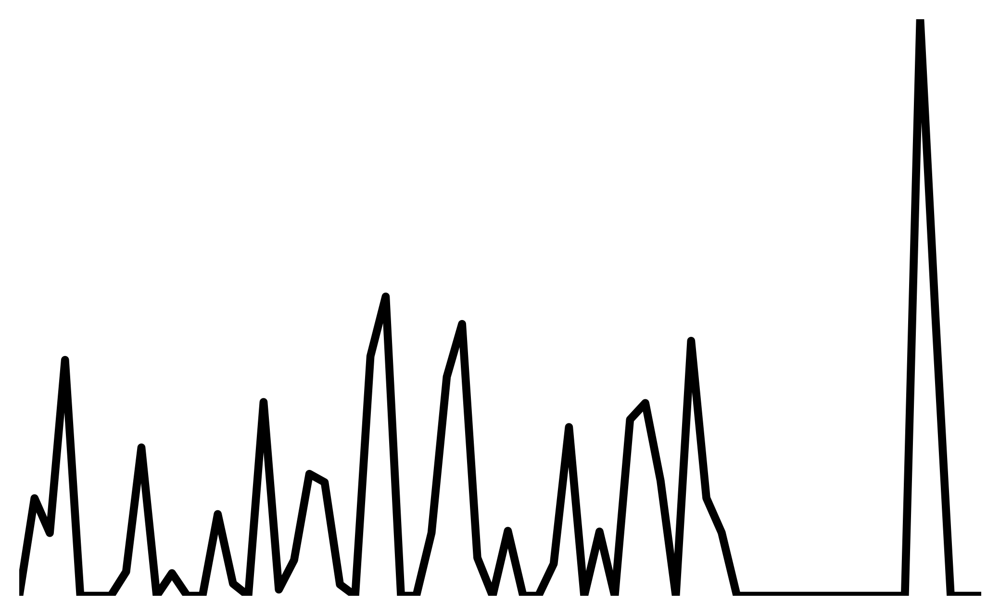

In [48]:

# 假设你想看 conv1d_5 这一层
target_layer = 'dense_73'  # 你想看的层名字，按你模型结构修改

from tensorflow.keras.models import Model

# 构造只输出这一层的中间层模型
feature_model = Model(
    inputs=denoise_model.input,
    outputs=denoise_model.get_layer(target_layer).output
)

# 选一个输入样本
sample_idx = 0
input_signal = x_test[sample_idx][np.newaxis, ...]  # (1, 1024, 1)

# 得到该层输出
feature = feature_model.predict(input_signal)  # shape: (1, 时间步, 通道数)

import matplotlib.pyplot as plt

plt.figure(figsize=(5, 3), dpi=400)
plt.plot(feature[0, :], color='black', linewidth=3
         
        )
plt.axis('off')  # 关闭全部坐标轴
plt.margins(0)   # 紧贴边界
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # 去掉四周空白
plt.show()


In [230]:
import numpy as np
from sklearn.model_selection import train_test_split

# === 加载数据 ===
x_train = np.load('C:/localization/x_train_0dB.npy')  # 输入（污染信号）
y_train = np.load('C:/localization/X_train.npy')       # 目标（干净信号）

x_val = np.load('C:/localization/x_val_0dB.npy')  # 输入（污染信号）
y_val = np.load('C:/localization/X_val.npy')
# === 添加通道维度 ===
x_train = x_train[..., np.newaxis]  # (N, 1024, 1)
y_train = y_train[..., np.newaxis]

x_val = x_val[..., np.newaxis]  # (N, 1024, 1)
y_val = y_val[..., np.newaxis]
# === 按 8:1:1 划分 ===
import tensorflow as tf
from tensorflow.keras import layers, models

def fc_block(x, units, activation='relu'):
    x = layers.Dense(units, activation=activation)(x)
    x = layers.Dense(units, activation=activation)(x)
    return x

def encoder_fc_block(x, units):
    x_fc = fc_block(x, units)
    p = layers.Dense(units // 2, activation='relu')(x_fc)
    return p

def decoder_fc_block(x, units):
    x = layers.Dense(units, activation='relu')(x)
    x = fc_block(x, units)
    return x

def build_unet_fc_no_skip(input_length=1024):
    inputs = layers.Input(shape=(input_length, 1))
    x_flat = layers.Flatten()(inputs)

    # Encoder (no skip connections)
    p1 = encoder_fc_block(x_flat, 2048)
    p2 = encoder_fc_block(p1, 1024)
    p3 = encoder_fc_block(p2, 512)
    p4 = encoder_fc_block(p3, 256)
    p5 = encoder_fc_block(p4, 128)
    p6 = encoder_fc_block(p5, 64)

    # Bottleneck
    b = fc_block(p6, 32)

    # Decoder (no skip connections)
    d6 = decoder_fc_block(b, 64)
    d5 = decoder_fc_block(d6, 128)
    d4 = decoder_fc_block(d5, 256)
    d3 = decoder_fc_block(d4, 512)
    d2 = decoder_fc_block(d3, 1024)
    d1 = decoder_fc_block(d2, 2048)

    # Final reconstruction
    outputs = layers.Dense(input_length, activation='linear')(d1)
    outputs = layers.Reshape((input_length, 1))(outputs)

    return models.Model(inputs=inputs, outputs=outputs)


# 创建并查看模型结构

# 创建并查看模型结构
model = build_unet_fc_no_skip(input_length=1024)

model.summary()






from tensorflow.keras.callbacks import EarlyStopping

# === 编译模型 ===
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# === 设置 EarlyStopping（验证集损失连续10轮不提升就停止）===
from tensorflow.keras.callbacks import ModelCheckpoint

# === 设置模型保存路径 ===
checkpoint_path = 'C:/localization/denoise_0dB_Dense_no_connect.h5'

# === 设置只保存 val_loss 最低的模型 ===
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,  # 保存整个模型结构 + 权重
    verbose=1
)

# === 训练固定 100 轮（不使用 early stopping） ===
history = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=100,
    batch_size=200,
    callbacks=[checkpoint],  # 不再用 EarlyStopping
    verbose=1
)









Model: "model_193"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 1024, 1)]         0         
_________________________________________________________________
flatten_12 (Flatten)         (None, 1024)              0         
_________________________________________________________________
dense_104 (Dense)            (None, 2048)              2099200   
_________________________________________________________________
dense_105 (Dense)            (None, 2048)              4196352   
_________________________________________________________________
dense_106 (Dense)            (None, 1024)              2098176   
_________________________________________________________________
dense_107 (Dense)            (None, 1024)              1049600   
_________________________________________________________________
dense_108 (Dense)            (None, 1024)              10

KeyboardInterrupt: 

C:\Users\RTX4090D\AppData\Local\Temp\ipykernel_20804\1015394813.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(methods, fontsize=17)


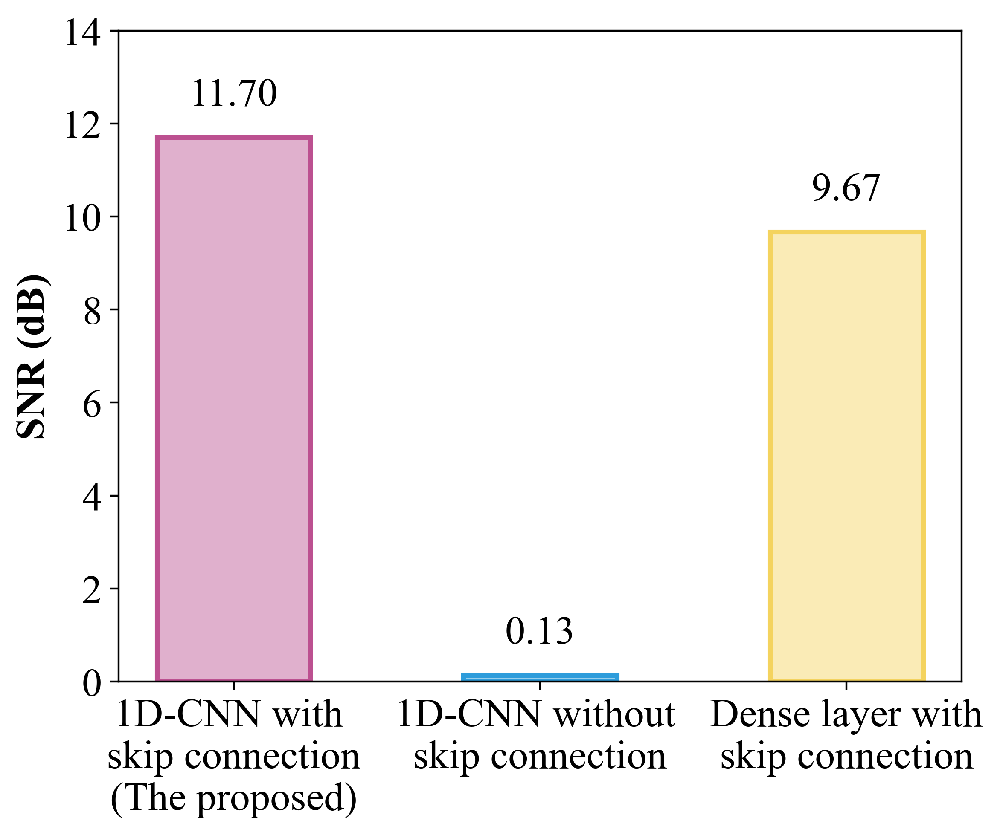

In [94]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['font.family'] = 'Times New Roman'

methods = [
     '1D-CNN with \nskip connection\n(The proposed)',
    '1D-CNN without \nskip connection',
    'Dense layer with\nskip connection'  # 可以换成你喜欢的名称
]
errors = [11.70, 0.13,9.67]

# 颜色设置
edge_colors = ['#bc5090', '#2D9CDB', '#F4D35E']  # 最后是淡黄色的深色
fill_colors = [
    (188/255, 80/255, 144/255, 0.45),     # 原配色
    (45/255, 156/255, 219/255, 0.45),     # 原配色
    (244/255, 211/255, 94/255, 0.45)      # 淡黄色，RGBA
]

fig, ax = plt.subplots(figsize=(6, 5), dpi=400)

bars = ax.bar(methods, errors, color=fill_colors, edgecolor=edge_colors, linewidth=2, width=0.5)

# 添加数值标签
for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{height:.2f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 10),  # 向上偏移
                textcoords="offset points",
                ha='center', va='bottom',
                fontsize=17)

ax.set_ylabel('SNR (dB)', fontsize=17, fontweight='bold')
ax.set_ylim(0, 14)
ax.set_xticklabels(methods, fontsize=17)
ax.tick_params(axis='y', labelsize=17)
plt.tight_layout()
plt.show()


C:\Users\RTX4090D\AppData\Local\Temp\ipykernel_20804\4288127221.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(methods, fontsize=17)


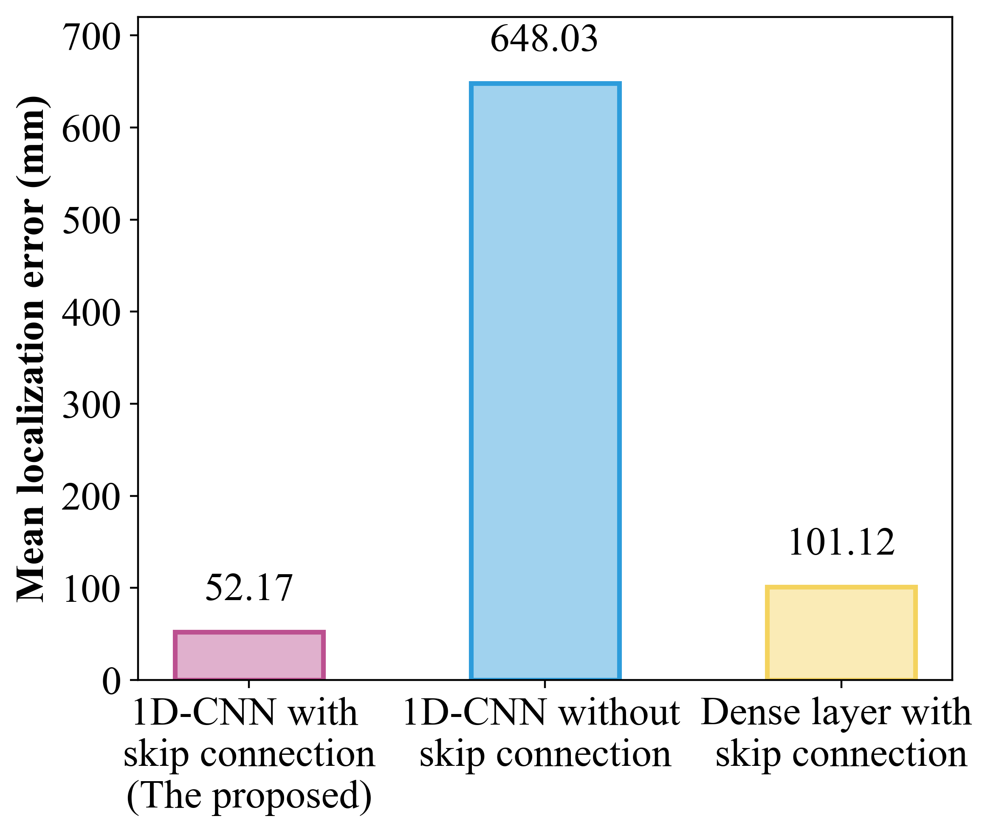

In [93]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['font.family'] = 'Times New Roman'

methods = [
     '1D-CNN with \nskip connection\n(The proposed)',
    '1D-CNN without \nskip connection',
    'Dense layer with \nskip connection'  # 可以换成你喜欢的名称
]
errors = [52.17, 648.03, 101.12]

# 颜色设置
edge_colors = ['#bc5090', '#2D9CDB', '#F4D35E']  # 最后是淡黄色的深色
fill_colors = [
    (188/255, 80/255, 144/255, 0.45),     # 原配色
    (45/255, 156/255, 219/255, 0.45),     # 原配色
    (244/255, 211/255, 94/255, 0.45)      # 淡黄色，RGBA
]

fig, ax = plt.subplots(figsize=(6, 5), dpi=400)

bars = ax.bar(methods, errors, color=fill_colors, edgecolor=edge_colors, linewidth=2, width=0.5)

# 添加数值标签
for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{height:.2f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 10),  # 向上偏移
                textcoords="offset points",
                ha='center', va='bottom',
                fontsize=17)

ax.set_ylabel('Mean localization error (mm)', fontsize=17, fontweight='bold')
ax.set_ylim(0, 720)
ax.set_xticklabels(methods, fontsize=17)
ax.tick_params(axis='y', labelsize=17)
plt.tight_layout()
plt.show()


In [67]:
import numpy as np
from sklearn.model_selection import train_test_split

# === 加载数据 ===
x_train = np.load('C:/localization/x_train_0dB.npy')  # 输入（污染信号）
y_train = np.load('C:/localization/X_train.npy')       # 目标（干净信号）

x_val = np.load('C:/localization/x_val_0dB.npy')  # 输入（污染信号）
y_val = np.load('C:/localization/X_val.npy')
# === 添加通道维度 ===
x_train = x_train[..., np.newaxis]  # (N, 1024, 1)
y_train = y_train[..., np.newaxis]

x_val = x_val[..., np.newaxis]  # (N, 1024, 1)
y_val = y_val[..., np.newaxis]
# === 按 8:1:1 划分 ===

import tensorflow as tf
from tensorflow.keras import layers, models

def fc_block(x, units, activation='relu'):
    x = layers.Dense(units, activation=activation)(x)
    x = layers.Dense(units, activation=activation)(x)
    return x

def encoder_fc_block(x, units):
    x_fc = fc_block(x, units)
    p = layers.Dense(units // 2)(x_fc)
    return x_fc, p

def decoder_fc_block(x, skip, units):
    x = layers.Dense(units)(x)
    x = layers.Concatenate()([x, skip])
    x = fc_block(x, units)
    return x

def build_unet_fc(input_length=1024):
    inputs = layers.Input(shape=(input_length, 1))
    x_flat = layers.Flatten()(inputs)

    # Encoder
    e1, p1 = encoder_fc_block(x_flat, 2048)
    e2, p2 = encoder_fc_block(p1, 1024)
    e3, p3 = encoder_fc_block(p2, 512)
    e4, p4 = encoder_fc_block(p3, 256)
    e5, p5 = encoder_fc_block(p4, 128)
    e6, p6 = encoder_fc_block(p5, 64)

    # Bottleneck
    b = fc_block(p6, 32)

    # Decoder
    d6 = decoder_fc_block(b, e6, 64)
    d5 = decoder_fc_block(d6, e5, 128)
    d4 = decoder_fc_block(d5, e4, 256)
    d3 = decoder_fc_block(d4, e3, 512)
    d2 = decoder_fc_block(d3, e2, 1024)
    d1 = decoder_fc_block(d2, e1, 2048)

    # Final reconstruction
    outputs = layers.Dense(input_length, activation='linear')(d1)
    outputs = layers.Reshape((input_length, 1))(outputs)

    return models.Model(inputs=inputs, outputs=outputs)

# 创建并查看模型结构
model = build_unet_fc(input_length=1024)
model.summary()






from tensorflow.keras.callbacks import EarlyStopping

# === 编译模型 ===
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# === 设置 EarlyStopping（验证集损失连续10轮不提升就停止）===
from tensorflow.keras.callbacks import ModelCheckpoint

# === 设置模型保存路径 ===
checkpoint_path = 'C:/localization/denoise_0dB_Dense_norelu_with_connect.h5'

# === 设置只保存 val_loss 最低的模型 ===
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,  # 保存整个模型结构 + 权重
    verbose=1
)

# === 训练固定 100 轮（不使用 early stopping） ===
history = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=100,
    batch_size=200,
    callbacks=[checkpoint],  # 不再用 EarlyStopping
    verbose=1
)









Model: "model_33"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 1024, 1)]    0                                            
__________________________________________________________________________________________________
flatten_1 (Flatten)             (None, 1024)         0           input_2[0][0]                    
__________________________________________________________________________________________________
dense_39 (Dense)                (None, 2048)         2099200     flatten_1[0][0]                  
__________________________________________________________________________________________________
dense_40 (Dense)                (None, 2048)         4196352     dense_39[0][0]                   
___________________________________________________________________________________________

92/92 [==============================] - 2s 16ms/step - loss: 0.0445 - mae: 0.1155 - val_loss: 0.0273 - val_mae: 0.0941

Epoch 00001: val_loss improved from inf to 0.02726, saving model to C:/localization\denoise_0dB_Dense_norelu_with_connect.h5
Epoch 2/100
92/92 [==============================] - 1s 14ms/step - loss: 0.0251 - mae: 0.0899 - val_loss: 0.0223 - val_mae: 0.0850

Epoch 00002: val_loss improved from 0.02726 to 0.02229, saving model to C:/localization\denoise_0dB_Dense_norelu_with_connect.h5
Epoch 3/100
92/92 [==============================] - 1s 14ms/step - loss: 0.0194 - mae: 0.0795 - val_loss: 0.0177 - val_mae: 0.0755

Epoch 00003: val_loss improved from 0.02229 to 0.01769, saving model to C:/localization\denoise_0dB_Dense_norelu_with_connect.h5
Epoch 4/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0163 - mae: 0.0728 - val_loss: 0.0173 - val_mae: 0.0739

Epoch 00004: val_loss improved from 0.01769 to 0.01728, saving model to C:/localization\denoise_0


Epoch 00039: val_loss did not improve from 0.01094
Epoch 40/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0081 - mae: 0.0517 - val_loss: 0.0120 - val_mae: 0.0591

Epoch 00040: val_loss did not improve from 0.01094
Epoch 41/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0076 - mae: 0.0500 - val_loss: 0.0116 - val_mae: 0.0586

Epoch 00041: val_loss did not improve from 0.01094
Epoch 42/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0083 - mae: 0.0507 - val_loss: 0.0126 - val_mae: 0.0606

Epoch 00042: val_loss did not improve from 0.01094
Epoch 43/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0082 - mae: 0.0493 - val_loss: 0.0135 - val_mae: 0.0629

Epoch 00043: val_loss did not improve from 0.01094
Epoch 44/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0082 - mae: 0.0519 - val_loss: 0.0122 - val_mae: 0.0595

Epoch 00044: val_loss did not improve from 0.01094
Epoch 45/100
92/92 [===

92/92 [==============================] - 1s 13ms/step - loss: 0.0090 - mae: 0.0535 - val_loss: 0.0141 - val_mae: 0.0640

Epoch 00084: val_loss did not improve from 0.01094
Epoch 85/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0075 - mae: 0.0495 - val_loss: 0.0138 - val_mae: 0.0633

Epoch 00085: val_loss did not improve from 0.01094
Epoch 86/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0248 - mae: 0.0499 - val_loss: 0.0180 - val_mae: 0.0733

Epoch 00086: val_loss did not improve from 0.01094
Epoch 87/100
92/92 [==============================] - 1s 12ms/step - loss: 0.0101 - mae: 0.0578 - val_loss: 0.0153 - val_mae: 0.0668

Epoch 00087: val_loss did not improve from 0.01094
Epoch 88/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0125 - mae: 0.0588 - val_loss: 0.0156 - val_mae: 0.0677

Epoch 00088: val_loss did not improve from 0.01094
Epoch 89/100
92/92 [==============================] - 1s 13ms/step - loss: 0.0119 - mae:

In [89]:
import numpy as np
from tensorflow.keras.models import load_model

# 定义模型路径和测试数据路径
model_path = 'C:/localization/denoise_0dB_Dense_norelu_with_connect.h5'
x_test = np.load('C:/localization/x_test_0dB.npy')

# 添加通道维度（如果还没有）

# 加载模型
denoise_model = load_model(model_path)

# 预测去噪结果
y_pred = denoise_model.predict(x_test, batch_size=2000)


y_test = np.load('C:/localization/X_test.npy')
y_pred = y_pred.squeeze()


def compute_snr(clean, denoised):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean((clean - denoised) ** 2)
    if noise_power == 0:
        return np.inf
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

snr_value = compute_snr(y_test, y_pred)
print(f"Test SNR: {snr_value:.2f} dB")

# 打印所有 Conv1D 层的名字，人工选一个
conv_layer_names = [layer.name for layer in denoise_model.layers if layer.__class__.__name__ == 'Dense']
print(conv_layer_names)



Test SNR: 9.67 dB
['dense_39', 'dense_40', 'dense_41', 'dense_42', 'dense_43', 'dense_44', 'dense_45', 'dense_46', 'dense_47', 'dense_48', 'dense_49', 'dense_50', 'dense_51', 'dense_52', 'dense_53', 'dense_54', 'dense_55', 'dense_56', 'dense_57', 'dense_58', 'dense_59', 'dense_60', 'dense_61', 'dense_62', 'dense_63', 'dense_64', 'dense_65', 'dense_66', 'dense_67', 'dense_68', 'dense_69', 'dense_70', 'dense_71', 'dense_72', 'dense_73', 'dense_74', 'dense_75', 'dense_76', 'dense_77']


In [69]:
import numpy as np
import os
from tensorflow.keras.models import load_model
import matplotlib
matplotlib.rcParams['font.family'] = 'Times New Roman'

def euclidean_distance_loss(y_true, y_pred):
    return tf.reduce_mean(tf.norm(y_true - y_pred, axis=-1))

model_path = os.path.join('C:/localization', 'best_model4.h5')
best_model = load_model(model_path, custom_objects={'euclidean_distance_loss': euclidean_distance_loss})

# 加载新的带噪测试数据（假设 shape=(N,1024)）
new_X_test = np.load(r'C:/localization/x_test_0dB.npy').astype('float32')

denoise_model = load_model('C:/localization/denoise_0dB_Dense_norelu_with_connect.h5')

X_test = denoise_model.predict(new_X_test, batch_size=2000)



# 预测
y_pred = best_model.predict(X_test)  # shape: (num_samples, 2)

# （可选）如果你有新的y_test标签，也可以加载并算距离
y_test = np.load('C:/localization/y_test.npy').astype('float32')
distances = np.sqrt(np.sum((y_test - y_pred) ** 2, axis=1))
mean_distance = np.mean(distances)
print(f"新测试集样本的平均欧氏距离: {mean_distance:.4f}")






新测试集样本的平均欧氏距离: 101.1292


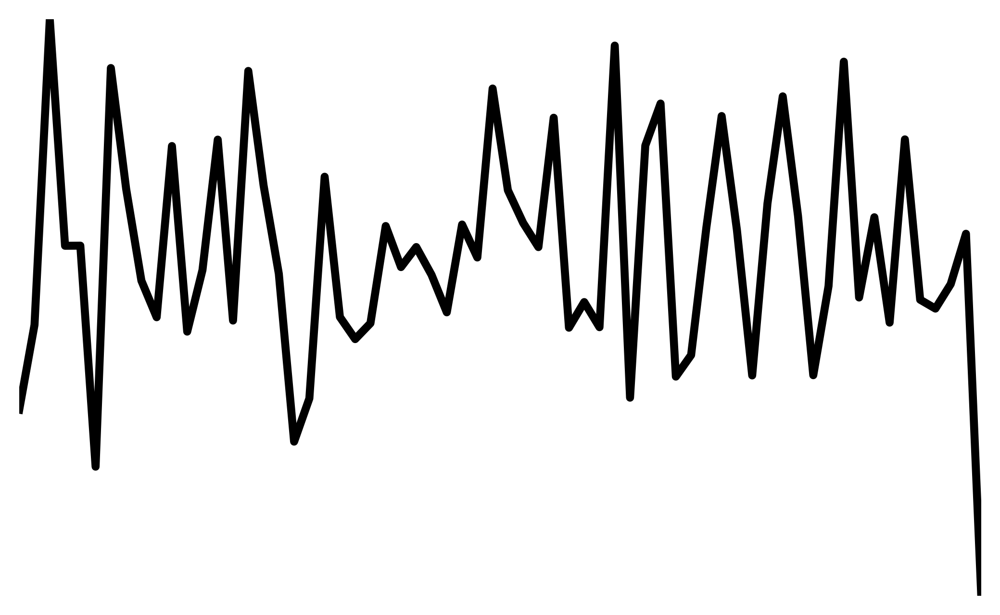

In [86]:

# 假设你想看 conv1d_5 这一层
target_layer = 'dense_59'  # 你想看的层名字，按你模型结构修改

from tensorflow.keras.models import Model

# 构造只输出这一层的中间层模型
feature_model = Model(
    inputs=denoise_model.input,
    outputs=denoise_model.get_layer(target_layer).output
)

# 选一个输入样本
sample_idx = 0
input_signal = x_test[sample_idx][np.newaxis, ...]  # (1, 1024, 1)

# 得到该层输出
feature = feature_model.predict(input_signal)  # shape: (1, 时间步, 通道数)

import matplotlib.pyplot as plt

plt.figure(figsize=(5, 3), dpi=400)
plt.plot(feature[0, :], color='black', linewidth=3
         
        )
plt.axis('off')  # 关闭全部坐标轴
plt.margins(0)   # 紧贴边界
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # 去掉四周空白
plt.show()


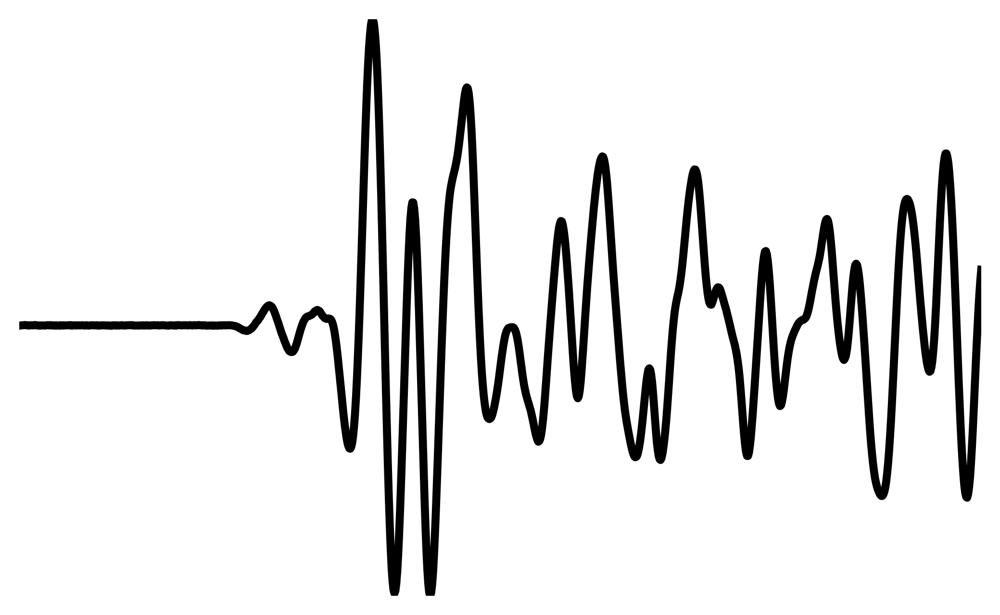

In [91]:
import matplotlib.pyplot as plt

sample_idx = 0  # 你想要的样本索引
true_clean = y_test[sample_idx]  # shape: (1024,) 或 (1024, 1)

plt.figure(figsize=(5, 3), dpi=400)
plt.plot(true_clean.squeeze(), color='black', linewidth=3)
plt.axis('off')               # 去掉坐标轴
plt.margins(0)                # 去掉左右空白
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)  # 去掉边距
plt.show()
